In [1]:
from textblob import TextBlob
import pandas as pd
import re
import numpy as np
import wordcloud as WordCloud
import wordcloud
import tweepy
import matplotlib.pyplot as plt

In [4]:
feed1="I am not Satisfied"
feed2="I am highly satisfied"
feed3="The food was awesome"

In [5]:
blob1=TextBlob(feed1)
blob2=TextBlob(feed2)
blob3=TextBlob(feed3)
print(blob1.sentiment)
print(blob2.sentiment)
print(blob3.sentiment)

Sentiment(polarity=-0.25, subjectivity=1.0)
Sentiment(polarity=0.5, subjectivity=1.0)
Sentiment(polarity=1.0, subjectivity=1.0)


In [6]:
data=pd.read_csv(r"C:\Mba notes\novels\project data\Sentimental analysis\train.tsv",sep="\t",header=0)
data

,PhraseId,SentenceId,Phrase,Sentiment
0,1,1,A series of escapades demonstrating the adage ...,1
1,2,1,A series of escapades demonstrating the adage ...,2
2,3,1,A series,2
3,4,1,A,2
4,5,1,series,2
...,...,...,...,...
156055,156056,8544,Hearst 's,2
156056,156057,8544,forced avuncular chortles,1
156057,156058,8544,avuncular chortles,3
156058,156059,8544,avuncular,2


In [7]:
data[data["Sentiment"]==1]["Phrase"].values[0]

'A series of escapades demonstrating the adage that what is good for the goose is also good for the gander , some of which occasionally amuses but none of which amounts to much of a story .'

In [8]:
def clean(text):
    text=re.sub(r"@[A-Za-z0-9]+","",text)
    text=re.sub(r"#","",text)
    text=re.sub(r"RT[\s]+","",text)
    text=re.sub(r"https?:/\/\S+","",text)
    return text


In [9]:
data["Phrase"]=data["Phrase"].apply(clean)

In [10]:
data

,PhraseId,SentenceId,Phrase,Sentiment
0,1,1,A series of escapades demonstrating the adage ...,1
1,2,1,A series of escapades demonstrating the adage ...,2
2,3,1,A series,2
3,4,1,A,2
4,5,1,series,2
...,...,...,...,...
156055,156056,8544,Hearst 's,2
156056,156057,8544,forced avuncular chortles,1
156057,156058,8544,avuncular chortles,3
156058,156059,8544,avuncular,2


In [11]:
def subjectivity(Phrase):
    return TextBlob(Phrase).sentiment.subjectivity
def polarity(Phrase):
    return TextBlob(Phrase).sentiment.polarity

In [12]:
data["Subjectivity"]=data["Phrase"].apply(subjectivity)
data["Polarity"]=data["Phrase"].apply(polarity)

In [13]:
data.head()

,PhraseId,SentenceId,Phrase,Sentiment,Subjectivity,Polarity
0,1,1,A series of escapades demonstrating the adage ...,1,0.38125,0.4
1,2,1,A series of escapades demonstrating the adage ...,2,0.60000,0.7
2,3,1,A series,2,0.00000,0.0
3,4,1,A,2,0.00000,0.0
4,5,1,series,2,0.00000,0.0


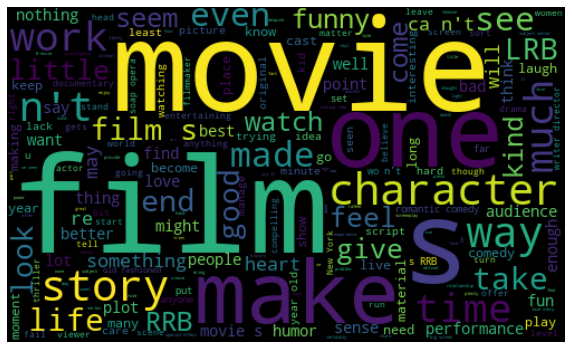

In [14]:
plt.figure(figsize=(10,7))
allwords=" ".join([x for x in data["Phrase"]])
cloud=wordcloud.WordCloud(width=500,height=300,random_state=21,max_font_size=119).generate(allwords)
plt.imshow(cloud,interpolation="bilinear")
plt.axis("off")
plt.show()

In [15]:
allwords

"A series of escapades demonstrating the adage that what is good for the goose is also good for the gander , some of which occasionally amuses but none of which amounts to much of a story . A series of escapades demonstrating the adage that what is good for the goose A series A series of escapades demonstrating the adage that what is good for the goose of escapades demonstrating the adage that what is good for the goose escapades demonstrating the adage that what is good for the goose demonstrating the adage demonstrating the adage the adage that what is good for the goose that what is good for the goose what is good for the goose is good for the goose good for the goose for the goose goose is also good for the gander , some of which occasionally amuses but none of which amounts to much of a story . is also good for the gander , some of which occasionally amuses but none of which amounts to much of a story is also also good for the gander , some of which occasionally amuses but none of

In [13]:
def analysis(score):
    if score<0:
        return "Negative"
    elif score==0:
        return "Neutral"
    else:
        return "Positive"

In [14]:
data["Analysis"]=data["Polarity"].apply(analysis)
data[50:60]

,PhraseId,SentenceId,Phrase,Sentiment,Subjectivity,Polarity,Analysis
50,51,1,none,2,0.0,0.0,Neutral
51,52,1,of which amounts to much of a story,2,0.2,0.2,Positive
52,53,1,which amounts to much of a story,2,0.2,0.2,Positive
53,54,1,amounts to much of a story,2,0.2,0.2,Positive
54,55,1,amounts,2,0.0,0.0,Neutral
55,56,1,to much of a story,2,0.2,0.2,Positive
56,57,1,to,2,0.0,0.0,Neutral
57,58,1,much of a story,2,0.2,0.2,Positive
58,59,1,much,2,0.2,0.2,Positive
59,60,1,of a story,2,0.0,0.0,Neutral


In [15]:
data[data["Analysis"]=="Negative"].head()

,PhraseId,SentenceId,Phrase,Sentiment,Subjectivity,Polarity,Analysis
81,82,3,"Even fans of Ismail Merchant 's work , I suspe...",1,0.541667,-0.291667,Negative
94,95,3,", I suspect , would have a hard time sitting t...",1,0.541667,-0.291667,Negative
100,101,3,would have a hard time sitting through this one .,1,0.541667,-0.291667,Negative
101,102,3,would have a hard time sitting through this one,0,0.541667,-0.291667,Negative
103,104,3,have a hard time sitting through this one,0,0.541667,-0.291667,Negative


In [16]:
def phrase(phrase_no):
    a=data[data["PhraseId"]==phrase_no]["Phrase"].values[0]
    return a


In [17]:
phrase(82)

"Even fans of Ismail Merchant 's work , I suspect , would have a hard time sitting through this one ."

In [18]:
phrase(95)

', I suspect , would have a hard time sitting through this one .'

In [19]:
sorteddata=data.sort_values(by=["Polarity"])
sorteddata.head()

,PhraseId,SentenceId,Phrase,Sentiment,Subjectivity,Polarity,Analysis
80397,80398,4142,so awful,1,1.0,-1.0,Negative
53432,53433,2649,cruel but,2,1.0,-1.0,Negative
86342,86343,4470,feels an awful lot like Friday in Miami .,2,1.0,-1.0,Negative
86343,86344,4470,feels an awful lot like Friday in Miami,2,1.0,-1.0,Negative
19227,19228,843,of boring,1,1.0,-1.0,Negative


In [20]:
j=1
for i in range(0,sorteddata.shape[0]):
    if(sorteddata["Analysis"][i]=="Positive"):
        print(str(j)+")"+sorteddata["Phrase"][i])
        print()
        j=j+1

1)A series of escapades demonstrating the adage that what is good for the goose is also good for the gander , some of which occasionally amuses but none of which amounts to much of a story .

2)A series of escapades demonstrating the adage that what is good for the goose

3)of escapades demonstrating the adage that what is good for the goose

4)escapades demonstrating the adage that what is good for the goose

5)demonstrating the adage that what is good for the goose

6)that what is good for the goose

7)what is good for the goose

8)is good for the goose

9)good for the goose

10)good

11)is also good for the gander , some of which occasionally amuses but none of which amounts to much of a story .

12)is also good for the gander , some of which occasionally amuses but none of which amounts to much of a story

13)good for the gander , some of which occasionally amuses but none of which amounts to much of a story

14)for the gander , some of which occasionally amuses but none of which a

412)while peppering the pages with memorable zingers

413)peppering the pages with memorable zingers

414)with memorable zingers

415)memorable zingers

416)memorable

417)Bloody Sunday has the grace to call for prevention rather than to place blame , making it one of the best war movies ever made .

418)has the grace to call for prevention rather than to place blame , making it one of the best war movies ever made .

419)has the grace to call for prevention rather than to place blame , making it one of the best war movies ever made

420)the grace to call for prevention rather than to place blame , making it one of the best war movies ever made

421)grace to call for prevention rather than to place blame , making it one of the best war movies ever made

422)to call for prevention rather than to place blame , making it one of the best war movies ever made

423)call for prevention rather than to place blame , making it one of the best war movies ever made

424)making it one of the best w

797)Changing Lanes tries for more .

798)tries for more .

799)tries for more

800)for more

801)A macabre and very stylized Swedish fillm about a modern city where all the religious and civic virtues that hold society in place are in tatters .

802)A macabre and very

803)macabre and very

804)stylized Swedish fillm about a modern city where all the religious and civic virtues that hold society in place are in tatters .

805)stylized Swedish fillm about a modern city where all the religious and civic virtues that hold society in place are in tatters

806)stylized Swedish fillm about a modern city

807)about a modern city

808)a modern city

809)modern city

810)One of recent memory 's most thoughtful films about art , ethics , and the cost of moral compromise .

811)'s most thoughtful films about art , ethics , and the cost of moral compromise .

812)'s most thoughtful films about art , ethics , and the cost of moral compromise

813)most thoughtful films about art , ethics , and the c

1113)radical action

1114)-LRB- Cho 's face is -RRB- an amazing slapstick instrument , creating a scrapbook of living mug shots .

1115)Cho 's face is -RRB- an amazing slapstick instrument , creating a scrapbook of living mug shots .

1116)'s face is -RRB- an amazing slapstick instrument , creating a scrapbook of living mug shots .

1117)'s face is -RRB- an amazing slapstick instrument , creating a scrapbook of living mug shots

1118)'s face is -RRB- an amazing slapstick instrument ,

1119)'s face is -RRB- an amazing slapstick instrument

1120)an amazing slapstick instrument

1121)an amazing slapstick

1122)amazing slapstick

1123)amazing

1124)It gets the details of its time frame right but it completely misses its emotions .

1125)It gets the details of its time frame right but it completely misses its emotions

1126)It gets the details of its time frame right but

1127)It gets the details of its time frame right

1128)gets the details of its time frame right

1129)the details of its

1311)Campanella gets the tone just right -- funny in the middle of sad in the middle of hopeful .

1312)gets the tone just right -- funny in the middle of sad in the middle of hopeful .

1313)gets the tone just right -- funny in the middle of sad in the middle of hopeful

1314)gets the tone just right --

1315)gets the tone just right

1316)just right

1317)Nothing more than an amiable but unfocused bagatelle that plays like a loosely-connected string of acting-workshop exercises .

1318)Nothing more than an amiable but unfocused bagatelle that plays like a loosely-connected string of acting-workshop exercises

1319)more than an amiable but unfocused bagatelle that plays like a loosely-connected string of acting-workshop exercises

1320)Wallace gets a bit heavy handed with his message at times , and has a visual flair that waxes poetic far too much for our taste .

1321)gets a bit heavy handed with his message at times , and has a visual flair that waxes poetic far too much for our tas


1550)of an overripe episode of TV 's Dawson 's Creek and a recycled and dumbed-down version of Love Story

1551)an overripe episode of TV 's Dawson 's Creek and a recycled and dumbed-down version of Love Story

1552)a recycled and dumbed-down version of Love Story

1553)of Love Story

1554)The script covers huge , heavy topics in a bland , surfacey way that does n't offer any insight into why , for instance , good things happen to bad people .

1555)covers huge , heavy topics in a bland , surfacey way that does n't offer any insight into why , for instance , good things happen to bad people .

1556)covers huge , heavy topics in a bland , surfacey way that does n't offer any insight into why , for instance , good things happen to bad people

1557)huge , heavy topics in a bland , surfacey way that does n't offer any insight into why , for instance , good things happen to bad people

1558)huge , heavy topics

1559)huge

1560)that does n't offer any insight into why , for instance , good 

1724)Some of the computer animation is handsome , and various amusing sidekicks add much-needed levity to the otherwise bleak tale , but

1725)Some of the computer animation is handsome , and various amusing sidekicks add much-needed levity to the otherwise bleak tale ,

1726)Some of the computer animation is handsome , and various amusing sidekicks add much-needed levity to the otherwise bleak tale

1727)Some of the computer animation is handsome , and

1728)Some of the computer animation is handsome ,

1729)Some of the computer animation is handsome

1730)is handsome

1731)handsome

1732)various amusing sidekicks

1733)amusing sidekicks

1734)Now as a former Gong Show addict , I 'll admit it , my only complaint is that we did n't get more re-creations of all those famous moments from the show .

1735), I 'll admit it , my only complaint is that we did n't get more re-creations of all those famous moments from the show .

1736)my only complaint is that we did n't get more re-creations


2163)one of the rare directors who feels acting is the heart and soul of cinema

2164)of the rare directors who feels acting is the heart and soul of cinema

2165)the rare directors who feels acting is the heart and soul of cinema

2166)the rare directors

2167)rare directors

2168)The filmmaker 's heart is in the right place ...

2169)is in the right place ...

2170)is in the right place

2171)in the right place

2172)the right place

2173)right place

2174)One of the most highly-praised disappointments I 've had the misfortune to watch in quite some time .

2175)One of the most highly-praised disappointments I

2176)of the most highly-praised disappointments I

2177)the most highly-praised disappointments I

2178)most highly-praised disappointments I

2179)Rock 's stand-up magic wanes .

2180)Rock 's stand-up magic

2181)stand-up magic

2182)very meticulously but without any passion

2183)very meticulously but

2184)very meticulously

2185)Sadly , ` Garth ' has n't progressed as nic

2355)stumbles over every cheap trick in the book trying to make the outrage

2356)over every cheap trick in the book trying to make the outrage

2357)every cheap trick in the book trying to make the outrage

2358)every cheap trick

2359)cheap trick

2360)Nicely combines the enigmatic features of ` Memento ' with the hallucinatory drug culture of ` Requiem for a Dream . '

2361)combines the enigmatic features of ` Memento ' with the hallucinatory drug culture of ` Requiem for a Dream . '

2362)combines the enigmatic features of ` Memento ' with the hallucinatory drug culture of ` Requiem for a Dream .

2363)combines the enigmatic features of ` Memento ' with the hallucinatory drug culture of ` Requiem for a Dream

2364)combines the enigmatic features of ` Memento '

2365)the enigmatic features of ` Memento '

2366)the enigmatic features

2367)enigmatic features

2368)enigmatic

2369)Every individual will see the movie through the prism of his or her own beliefs and prejudices , but the 

2900)is not the first time that director Sara Sugarman stoops to having characters drop their pants for laughs and not the last time

2901)is not the first time

2902)the first time

2903)first time

2904)contemporary interpretation

2905)contemporary

2906)There is a strong directorial stamp on every frame of this stylish film that is able to visualize schizophrenia but is still confident enough to step back and look at the sick character with a sane eye .

2907)is a strong directorial stamp on every frame of this stylish film that is able to visualize schizophrenia but is still confident enough to step back and look at the sick character with a sane eye .

2908)is a strong directorial stamp on every frame of this stylish film that is able to visualize schizophrenia but is still confident enough to step back and look at the sick character with a sane eye

2909)a strong directorial stamp on every frame of this stylish film that is able to visualize schizophrenia but is still confident 

3233)the best films of the year

3234)the best films

3235)best films

3236)Combines improbable melodrama -LRB- gored bullfighters , comatose ballerinas -RRB- with subtly kinky bedside vigils and sensational denouements , and yet at the end , we are undeniably touched .

3237)Combines improbable melodrama -LRB- gored bullfighters , comatose ballerinas -RRB- with subtly kinky bedside vigils and sensational denouements , and yet at the end

3238)improbable melodrama -LRB- gored bullfighters , comatose ballerinas -RRB- with subtly kinky bedside vigils and sensational denouements , and yet at the end

3239)melodrama -LRB- gored bullfighters , comatose ballerinas -RRB- with subtly kinky bedside vigils and sensational denouements , and yet at the end

3240)melodrama -LRB- gored bullfighters , comatose ballerinas -RRB- with subtly kinky bedside vigils and sensational denouements

3241)with subtly kinky bedside vigils and sensational denouements

3242)subtly kinky bedside vigils and sensationa

3678)Good Girl

3679)The movie strains to stay on the light , comic side of the issue , despite the difficulty of doing so when dealing with the destruction of property and , potentially , of life itself .

3680)strains to stay on the light , comic side of the issue , despite the difficulty of doing so when dealing with the destruction of property and , potentially , of life itself .

3681)strains to stay on the light , comic side of the issue , despite the difficulty of doing so when dealing with the destruction of property and , potentially , of life itself

3682)to stay on the light , comic side of the issue , despite the difficulty of doing so when dealing with the destruction of property and , potentially , of life itself

3683)stay on the light , comic side of the issue , despite the difficulty of doing so when dealing with the destruction of property and , potentially , of life itself

3684)stay on the light , comic side of the issue ,

3685)stay on the light , comic side of the

3960)So vivid a portrait of a woman consumed by lust and love and crushed by betrayal that it conjures up the intoxicating fumes and emotional ghosts of a freshly painted Rembrandt .

3961)So vivid a portrait of a woman

3962)So vivid a portrait

3963)So vivid

3964)consumed by lust and love and crushed by betrayal that it conjures up the intoxicating fumes and emotional ghosts of a freshly painted Rembrandt .

3965)consumed by lust and love and crushed by betrayal that it conjures up the intoxicating fumes and emotional ghosts of a freshly painted Rembrandt

3966)consumed by lust and love and

3967)consumed by lust and love

3968)by lust and love

3969)lust and love

3970)crushed by betrayal that it conjures up the intoxicating fumes and emotional ghosts of a freshly painted Rembrandt

3971)that it conjures up the intoxicating fumes and emotional ghosts of a freshly painted Rembrandt

3972)it conjures up the intoxicating fumes and emotional ghosts of a freshly painted Rembrandt

3973)

4294)is interesting to witness the conflict from the Palestinian side

4295)interesting to witness the conflict from the Palestinian side

4296)to put the struggle into meaningful historical context

4297)put the struggle into meaningful historical context

4298)into meaningful historical context

4299)meaningful historical context

4300)meaningful

4301)Producer John Penotti surveyed high school students ... and came back with the astonishing revelation that `` they wanted to see something that did n't talk down to them . ''

4302)surveyed high school students ... and came back with the astonishing revelation that `` they wanted to see something that did n't talk down to them . ''

4303)surveyed high school students ... and came back with the astonishing revelation that `` they wanted to see something that did n't talk down to them .

4304)surveyed high school students ... and came back with the astonishing revelation that `` they wanted to see something that did n't talk down to them

4566)with good intentions

4567)good intentions

4568)squeeze the action and our emotions

4569)the action and our emotions

4570)the action and

4571)Though few will argue that it ranks with the best of Herzog 's works , Invincible shows he 's back in form , with an astoundingly rich film .

4572)Though few will argue that it ranks with the best of Herzog 's works

4573)few will argue that it ranks with the best of Herzog 's works

4574)will argue that it ranks with the best of Herzog 's works

4575)argue that it ranks with the best of Herzog 's works

4576)that it ranks with the best of Herzog 's works

4577)it ranks with the best of Herzog 's works

4578)ranks with the best of Herzog 's works

4579)with the best of Herzog 's works

4580)the best of Herzog 's works

4581)the best

4582), Invincible shows he 's back in form , with an astoundingly rich film .

4583)Invincible shows he 's back in form , with an astoundingly rich film .

4584)shows he 's back in form , with an astounding

4839)carrying more emotional baggage than Batman

4840)carrying more emotional baggage

4841)more emotional baggage

4842)more emotional

4843)Were it not for a sentimental resolution that explains way more about Cal than does the movie or the character any good , Freundlich 's World Traveler might have been one of the more daring and surprising American movies of the year .

4844)Were it not for a sentimental resolution that explains way more about Cal than does the movie or the character any good

4845)not for a sentimental resolution that explains way more about Cal than does the movie or the character any good

4846)for a sentimental resolution that explains way more about Cal than does the movie or the character any good

4847)a sentimental resolution that explains way more about Cal than does the movie or the character any good

4848)that explains way more about Cal than does the movie or the character any good

4849)explains way more about Cal than does the movie or the characte

5104)suspenseful enough for older kids

5105)for older kids

5106)older kids

5107)Not only better than its predecessor , it may rate as the most magical and most fun family fare of this or any recent holiday season .

5108)Not only better than its predecessor

5109)Not only better

5110), it may rate as the most magical and most fun family fare of this or any recent holiday season .

5111)it may rate as the most magical and most fun family fare of this or any recent holiday season .

5112)may rate as the most magical and most fun family fare of this or any recent holiday season .

5113)may rate as the most magical and most fun family fare of this or any recent holiday season

5114)rate as the most magical and most fun family fare of this or any recent holiday season

5115)as the most magical and most fun family fare of this or any recent holiday season

5116)the most magical and most fun family fare of this or any recent holiday season

5117)the most magical and most fun family fare



5330)An edgy thriller that delivers a surprising

5331)that delivers a surprising

5332)delivers a surprising

5333)a surprising

5334)Whole stretches of the film may be incomprehensible to moviegoers not already clad in basic black .

5335)Whole stretches of the film

5336)Whole stretches

5337)Charlotte Sometimes is a brilliant movie .

5338)Sometimes is a brilliant movie .

5339)is a brilliant movie .

5340)is a brilliant movie

5341)a brilliant movie

5342)brilliant movie

5343)Godard has never made a more sheerly beautiful film than this unexpectedly moving meditation on love , history , memory , resistance and artistic transcendence .

5344)has never made a more sheerly beautiful film than this unexpectedly moving meditation on love , history , memory , resistance and artistic transcendence .

5345)has never made a more sheerly beautiful film than this unexpectedly moving meditation on love , history , memory , resistance and artistic transcendence

5346)made a more sheerly beaut

5684)a much better mother-daughter tale

5685)much better mother-daughter tale

5686)than last summer 's ` Divine Secrets of the Ya-Ya Sisterhood , ' but that 's not saying much

5687)that 's not saying much

5688)'s not saying much

5689)saying much

5690)But it also has many of the things that made the first one charming .

5691)it also has many of the things that made the first one charming .

5692)also has many of the things that made the first one charming .

5693)has many of the things that made the first one charming .

5694)has many of the things that made the first one charming

5695)many of the things that made the first one charming

5696)of the things that made the first one charming

5697)the things that made the first one charming

5698)that made the first one charming

5699)made the first one charming

5700)the first one charming

5701)the first one

5702)first one

5703)terrified of the book 's irreverent energy , and scotches most

5704)of the book 's irreverent energy

5919)The art direction is often exquisite , and the anthropomorphic animal characters are beautifully realized through clever makeup design , leaving one to hope that the eventual DVD release will offer subtitles and the original Italian-language soundtrack .

5920)The art direction is often exquisite , and the anthropomorphic animal characters are beautifully realized through clever makeup design , leaving one to hope that the eventual DVD release will offer subtitles and the original Italian-language soundtrack

5921)The art direction is often exquisite , and

5922)The art direction is often exquisite ,

5923)The art direction is often exquisite

5924)is often exquisite

5925)often exquisite

5926)exquisite

5927)the anthropomorphic animal characters are beautifully realized through clever makeup design , leaving one to hope that the eventual DVD release will offer subtitles and the original Italian-language soundtrack

5928)are beautifully realized through clever makeup design , lea

6260)accepts the news of his illness so quickly but still finds himself

6261)accepts the news of his illness so quickly but

6262)accepts the news of his illness so quickly

6263)so quickly

6264)quickly

6265)Highly uneven and inconsistent ... Margarita Happy Hour kinda resembles the el cheapo margaritas served within .

6266)Highly uneven and inconsistent ... Margarita Happy Hour kinda

6267)Margarita Happy Hour kinda

6268)Happy Hour kinda

6269)-LRB- Stephen -RRB- Earnhart 's film is more about the optimism of a group of people who are struggling to give themselves a better lot in life than the ones they currently have .

6270)-LRB- Stephen -RRB- Earnhart 's film is more about the optimism of a group of people who are struggling to give themselves a better lot in life than the ones

6271)Earnhart 's film is more about the optimism of a group of people who are struggling to give themselves a better lot in life than the ones

6272)is more about the optimism of a group of people who 

6599)Is there a group of more self-absorbed women than the mother and daughters featured in this film ?

6600)Is there a group of more self-absorbed women than the mother and daughters featured in this film

6601)a group of more self-absorbed women than the mother and daughters featured in this film

6602)of more self-absorbed women than the mother and daughters featured in this film

6603)more self-absorbed women than the mother and daughters featured in this film

6604)more self-absorbed women than the mother and

6605)more self-absorbed women than the mother

6606)more self-absorbed women

6607)The wonderful combination of the sweetness and the extraordinary technical accomplishments of the first film are maintained , but its overall impact falls a little flat with a storyline that never quite delivers the original magic .

6608)The wonderful combination of the sweetness and the extraordinary technical accomplishments of the first film are maintained , but its overall impact falls a

6915)for this ultra-provincial New Yorker

6916)this ultra-provincial New Yorker

6917)ultra-provincial New Yorker

6918)New Yorker

6919)if 26-year-old Reese Witherspoon were not on hand to inject her pure fantasy character , Melanie Carmichael , with a massive infusion of old-fashioned Hollywood magic

6920)26-year-old Reese Witherspoon were not on hand to inject her pure fantasy character , Melanie Carmichael , with a massive infusion of old-fashioned Hollywood magic

6921)were not on hand to inject her pure fantasy character , Melanie Carmichael , with a massive infusion of old-fashioned Hollywood magic

6922)to inject her pure fantasy character , Melanie Carmichael , with a massive infusion of old-fashioned Hollywood magic

6923)inject her pure fantasy character , Melanie Carmichael , with a massive infusion of old-fashioned Hollywood magic

6924)her pure fantasy character , Melanie Carmichael , with a massive infusion of old-fashioned Hollywood magic

6925)her pure fantasy charac

7180)The large-format film is well suited to capture these musicians in full regalia and the incredible IMAX sound system lets you feel the beat down to your toes .

7181)The large-format film is well suited to capture these musicians in full regalia and the incredible IMAX sound system lets you feel the beat down to your toes

7182)The large-format film is well suited to capture these musicians in full regalia and

7183)The large-format film is well suited to capture these musicians in full regalia

7184)is well suited to capture these musicians in full regalia

7185)suited to capture these musicians in full regalia

7186)to capture these musicians in full regalia

7187)capture these musicians in full regalia

7188)in full regalia

7189)full regalia

7190)the incredible IMAX sound system lets you feel the beat down to your toes

7191)the incredible IMAX sound system

7192)incredible IMAX sound system

7193)incredible

7194)IMAX sound system

7195)sound system

7196)sound

7197)Even bi

7426)social and political

7427)social and

7428), State Property does n't end up being very inspiring or insightful .

7429)State Property does n't end up being very inspiring or insightful .

7430)does n't end up being very inspiring or insightful .

7431)does n't end up being very inspiring or insightful

7432)end up being very inspiring or insightful

7433)being very inspiring or insightful

7434)very inspiring or insightful

7435)inspiring or insightful

7436)inspiring or

7437)Compellingly watchable .

7438)Compellingly

7439)is top shelf .

7440)is top shelf

7441)top shelf

7442)This heist flick about young Brooklyn hoods

7443)about young Brooklyn hoods

7444)young Brooklyn hoods

7445)The movie spends more time with Schneider than with newcomer McAdams , even though her performance is more interesting -LRB- and funnier -RRB- than his .

7446)spends more time with Schneider than with newcomer McAdams , even though her performance is more interesting -LRB- and funnier -RRB- tha


7623)recalls the Cary Grant of Room for One More , Houseboat and Father Goose in its affectionate depiction of the gentle war between a reluctant , irresponsible man and the kid who latches onto him

7624)recalls the Cary Grant of Room for One More ,

7625)recalls the Cary Grant of Room for One More

7626)for One More

7627)Houseboat and Father Goose in its affectionate depiction of the gentle war between a reluctant , irresponsible man and the kid who latches onto him

7628)in its affectionate depiction of the gentle war between a reluctant , irresponsible man and the kid who latches onto him

7629)its affectionate depiction of the gentle war between a reluctant , irresponsible man and the kid who latches onto him

7630)of the gentle war between a reluctant , irresponsible man and the kid who latches onto him

7631)the gentle war between a reluctant , irresponsible man and the kid who latches onto him

7632)the gentle war

7633)gentle war

7634)... a light , yet engrossing piece .

7


7889)twists to make the formula feel fresh

7890)to make the formula feel fresh

7891)make the formula feel fresh

7892)the formula feel fresh

7893)feel fresh

7894)but strangely believable

7895)strangely believable

7896)Ya-Yas everywhere will forgive the flaws and love the film .

7897)everywhere will forgive the flaws and love the film .

7898)will forgive the flaws and love the film .

7899)will forgive the flaws and love the film

7900)forgive the flaws and love the film

7901)love the film

7902)-LRB- Washington 's -RRB- strong hand , keen eye , sweet spirit and good taste are reflected in almost every scene .

7903)-LRB- Washington 's -RRB- strong hand , keen eye , sweet spirit and good taste

7904)-LRB- Washington 's -RRB- strong hand ,

7905)-LRB- Washington 's -RRB- strong hand

7906)strong hand

7907)keen eye , sweet spirit and good taste

7908)keen eye , sweet spirit and

7909)keen eye , sweet spirit

7910)sweet spirit

7911)good taste

7912), fun , curiously adolescent 

8174)add up to much more than trite observations on the human condition

8175)to much more than trite observations on the human condition

8176)much more than trite observations on the human condition

8177)much more than

8178)A beautifully observed character piece .

8179)A beautifully

8180)Though it inspires some -LRB- out-of-field -RRB- creative thought , the film is -- to its own detriment -- much more a cinematic collage than a polemical tract .

8181)Though it inspires some -LRB- out-of-field -RRB- creative thought

8182)it inspires some -LRB- out-of-field -RRB- creative thought

8183)inspires some -LRB- out-of-field -RRB- creative thought

8184)some -LRB- out-of-field -RRB- creative thought

8185)creative thought

8186), the film is -- to its own detriment -- much more a cinematic collage than a polemical tract .

8187)the film is -- to its own detriment -- much more a cinematic collage than a polemical tract .

8188)is -- to its own detriment -- much more a cinematic collage 

8506)steadfast

8507)good and

8508), albeit a visually compelling one ,

8509)albeit a visually compelling one ,

8510)albeit a visually compelling one

8511)a visually compelling one

8512)visually compelling one

8513)visually compelling

8514)With lesser talents , High Crimes would be entertaining , but forgettable .

8515), High Crimes would be entertaining , but forgettable .

8516)High Crimes would be entertaining , but forgettable .

8517)The history is fascinating ; the action is dazzling .

8518)The history is fascinating ; the action is dazzling

8519)The history is fascinating ;

8520)The history is fascinating

8521)is fascinating

8522)the action is dazzling

8523)is dazzling

8524)All in all , Road to Perdition is more in love with strangeness than excellence .

8525)is more in love with strangeness than excellence .

8526)is more in love with strangeness than excellence

8527)is more in love

8528)more in love

8529)DeMeo is not without talent ; he just needs better mat


8894)You would n't want to live waydowntown , but it is a hilarious place to visit

8895)You would n't want to live waydowntown , but

8896)You would n't want to live waydowntown ,

8897)You would n't want to live waydowntown

8898)would n't want to live waydowntown

8899)want to live waydowntown

8900)to live waydowntown

8901)live waydowntown

8902)it is a hilarious place to visit

8903)is a hilarious place to visit

8904)a hilarious place to visit

8905)hilarious place to visit

8906)Too intensely focused on the travails of being Hal Hartley to function as pastiche , No Such Thing is Hartley 's least accessible screed yet .

8907)Too intensely focused on the travails of being Hal Hartley to function as pastiche

8908)Too intensely

8909)intensely

8910), No Such Thing is Hartley 's least accessible screed yet .

8911)No Such Thing is Hartley 's least accessible screed yet .

8912)is Hartley 's least accessible screed yet .

8913)is Hartley 's least accessible screed yet

8914)is Ha

9194)The main problem being that it 's only a peek .

9195)The main problem

9196)main problem

9197)main

9198), Juwanna Mann is even more ludicrous than you 'd expect from the guy-in-a-dress genre

9199)Juwanna Mann is even more ludicrous than you 'd expect from the guy-in-a-dress genre

9200)is even more ludicrous than you 'd expect from the guy-in-a-dress genre

9201)is even more ludicrous

9202)even more ludicrous

9203)more ludicrous

9204)But it 's hard to imagine a more generic effort in the genre .

9205)it 's hard to imagine a more generic effort in the genre .

9206)'s hard to imagine a more generic effort in the genre .

9207)'s hard to imagine a more generic effort in the genre

9208)hard to imagine a more generic effort in the genre

9209)to imagine a more generic effort in the genre

9210)imagine a more generic effort in the genre

9211)a more generic effort in the genre

9212)a more generic effort

9213)more generic effort

9214)more generic

9215)Jason Patric and Ray L


9486)is concocted and carried out by folks worthy of scorn

9487)carried out by folks worthy of scorn

9488)by folks worthy of scorn

9489)folks worthy of scorn

9490)folks worthy

9491)the nicest thing I can say is that I ca n't remember a single name responsible for it

9492)is that I ca n't remember a single name responsible for it

9493)that I ca n't remember a single name responsible for it

9494)I ca n't remember a single name responsible for it

9495)ca n't remember a single name responsible for it

9496)remember a single name responsible for it

9497)a single name responsible for it

9498)responsible for it

9499)Watching Harris ham it up while physically and emotionally disintegrating over the course of the movie has a certain poignancy in light of his recent death , but Boyd 's film offers little else of consequence .

9500)Watching Harris ham it up while physically and emotionally disintegrating over the course of the movie has a certain poignancy in light of his recent dea

9634)has never been filmed more irresistibly than in ` Baran .

9635)has never been filmed more irresistibly than in ` Baran

9636)been filmed more irresistibly than in ` Baran

9637)filmed more irresistibly than in ` Baran

9638)more irresistibly than in ` Baran

9639)to think of any film more challenging or depressing than The Grey Zone

9640)think of any film more challenging or depressing than The Grey Zone

9641)think of any film more challenging or depressing

9642)of any film more challenging or depressing

9643)any film more challenging or depressing

9644)more challenging or depressing

9645)challenging or

9646)An elegant film

9647)elegant film

9648)elegant

9649)often surprising twists and

9650)often surprising twists

9651)An example of quiet , confident craftsmanship that tells a sweet , charming tale of intergalactic friendship .

9652)An example of quiet , confident craftsmanship that tells a sweet , charming tale of intergalactic friendship

9653)of quiet , confident

9919)X-Men - occasionally brilliant but mostly average , showing signs of potential for the sequels , but not giving us much this time around

9920)X-Men - occasionally brilliant but mostly average ,

9921)X-Men - occasionally brilliant but mostly average

9922)occasionally brilliant but mostly average

9923)occasionally brilliant but

9924)occasionally brilliant

9925)showing signs of potential for the sequels , but not giving us much this time around

9926)giving us much this time around

9927)giving us much this time

9928)much this time

9929)When the twist endings were actually surprising ?

9930)the twist endings were actually surprising ?

9931)the twist endings were actually surprising

9932)were actually surprising

9933)Much of the cast

9934)Represents a worthy departure from the culture clash comedies that have marked an emerging Indian American cinema .

9935)Represents a worthy departure from the culture clash comedies that have marked an emerging Indian American cinema



10460)Not really as bad as you might think

10461)Beautifully filmed and well acted ... but admittedly problematic in its narrative specifics .

10462)Beautifully filmed

10463)enjoyably

10464)Deuces Wild represents

10465)Deuces Wild

10466)One of the best films of the year with its exquisite acting , inventive screenplay , mesmerizing music , and many inimitable scenes of tenderness , loss , discontent , and yearning .

10467)One of the best films of the year with its exquisite acting , inventive screenplay , mesmerizing music , and many inimitable scenes of tenderness , loss , discontent , and yearning

10468)One of the best films of the year with its exquisite acting , inventive screenplay , mesmerizing music , and many inimitable scenes

10469)of the best films of the year with its exquisite acting , inventive screenplay , mesmerizing music , and many inimitable scenes

10470)the best films of the year with its exquisite acting , inventive screenplay , mesmerizing music , and man

10891)'re sure to get more out of the latter experience

10892)sure to get more out of the latter experience

10893)to get more out of the latter experience

10894)get more out of the latter experience

10895)get more out

10896)more out

10897)You get the idea , though , that Kapur intended the film to be more than that .

10898)get the idea , though , that Kapur intended the film to be more than that .

10899)get the idea , though , that Kapur intended the film to be more than that

10900)that Kapur intended the film to be more than that

10901)Kapur intended the film to be more than that

10902)intended the film to be more than that

10903)the film to be more than that

10904)film to be more than that

10905)to be more than that

10906)be more than that

10907)Both deserve better .

10908)deserve better .

10909)deserve better

10910)Parents may even find that it goes by quickly , because it has some of the funniest jokes of any movie this year , including those intended for adults 

11262)fools who saw Quentin Tarantino 's handful of raucous gangster films and branched out into their own pseudo-witty copycat interpretations

11263)who saw Quentin Tarantino 's handful of raucous gangster films and branched out into their own pseudo-witty copycat interpretations

11264)saw Quentin Tarantino 's handful of raucous gangster films and branched out into their own pseudo-witty copycat interpretations

11265)branched out into their own pseudo-witty copycat interpretations

11266)into their own pseudo-witty copycat interpretations

11267)their own pseudo-witty copycat interpretations

11268)own pseudo-witty copycat interpretations

11269)Far more enjoyable than its predecessor .

11270)more enjoyable than its predecessor .

11271)more enjoyable than its predecessor

11272)enjoyable than its predecessor

11273)It 's hard to fairly judge a film like RINGU when you 've seen the remake first .

11274)'s hard to fairly judge a film like RINGU when you 've seen the remake first .

11604)It 's nice to see Piscopo again after all these years , and Chaykin and Headly are priceless .

11605)It 's nice to see Piscopo again after all these years , and Chaykin and Headly are priceless

11606)It 's nice to see Piscopo again after all these years , and

11607)It 's nice to see Piscopo again after all these years ,

11608)It 's nice to see Piscopo again after all these years

11609)'s nice to see Piscopo again after all these years

11610)nice to see Piscopo again after all these years

11611)Chaykin and Headly are priceless

11612)are priceless

11613)priceless

11614)For a long time the film succeeds with its dark , delicate treatment of these characters and its unerring respect for them .

11615)the film succeeds with its dark , delicate treatment of these characters and its unerring respect for them .

11616)succeeds with its dark , delicate treatment of these characters and its unerring respect for them .

11617)succeeds with its dark , delicate treatment of these ch

11868)like just one more

11869)just one more

11870)Nachtwey clears the cynicism right out of you .

11871)clears the cynicism right out of you .

11872)clears the cynicism right out of you

11873)the cynicism right out of you

11874)right out of you

11875)she of the impossibly long limbs and sweetly conspiratorial smile

11876)of the impossibly long limbs and sweetly conspiratorial smile

11877)the impossibly long limbs and sweetly conspiratorial smile

11878)impossibly long limbs and sweetly conspiratorial smile

11879)impossibly long limbs and sweetly conspiratorial

11880)sweetly conspiratorial

11881)the `` wild ride ''

11882)`` wild ride ''

11883)wild ride ''

11884)young men

11885)-LRB- It -RRB- highlights not so much the crime lord 's messianic bent , but Spacey 's .

11886)-LRB- It -RRB- highlights not so much the crime lord 's messianic bent , but Spacey 's

11887)-LRB- It -RRB- highlights not so much the crime lord 's messianic bent , but

11888)-LRB- It -RRB- highlight


12050)keep this fresh

12051)this fresh

12052)LaBute was more fun when his characters were torturing each other psychologically and talking about their genitals in public .

12053)was more fun when his characters were torturing each other psychologically and talking about their genitals in public .

12054)was more fun when his characters were torturing each other psychologically and talking about their genitals in public

12055)was more fun

12056)Executed with such gentle but insistent sincerity , with such good humor and appreciation of the daily grind that only the most hardhearted Scrooge could fail to respond .

12057)Executed with such gentle but insistent sincerity , with such good humor and appreciation of the daily grind that only the most hardhearted Scrooge could fail to respond

12058)Executed with such gentle but insistent sincerity , with such good humor and

12059)Executed with such gentle but insistent sincerity , with such good humor

12060)Executed with such gentle 

12376)is nicely shot , well-edited and

12377)is nicely shot , well-edited

12378)is nicely shot ,

12379)is nicely shot

12380)nicely shot

12381)The filmmakers needed more emphasis on the storytelling and less on the glamorous machine that thrusts the audience into a future they wo n't much care about .

12382)needed more emphasis on the storytelling and less on the glamorous machine that thrusts the audience into a future they wo n't much care about .

12383)needed more emphasis on the storytelling and less on the glamorous machine that thrusts the audience into a future they wo n't much care about

12384)needed more emphasis on the storytelling and less

12385)needed more emphasis

12386)more emphasis

12387)on the glamorous machine that thrusts the audience into a future they wo n't much care about

12388)the glamorous machine that thrusts the audience into a future they wo n't much care about

12389)that thrusts the audience into a future they wo n't much care about

12390)thrust

12639)on its fairly ludicrous plot

12640)its fairly ludicrous plot

12641)fairly ludicrous plot

12642)fairly ludicrous

12643)... Jones , despite a definitely distinctive screen presence , just is n't able to muster for a movie that , its title notwithstanding , should have been a lot nastier if it wanted to fully capitalize on its lead 's specific gifts .

12644)Jones , despite a definitely distinctive screen presence , just is n't able to muster for a movie that , its title notwithstanding , should have been a lot nastier if it wanted to fully capitalize on its lead 's specific gifts .

12645)Jones , despite a definitely distinctive screen presence , just is n't able to muster for a movie that , its title notwithstanding , should have been a lot nastier if it wanted to fully capitalize on its lead 's specific gifts

12646), despite a definitely distinctive screen presence , just is n't able to muster for a movie that , its title notwithstanding , should have been a lot nastier if i

12786)a real filmmaker

12787)real filmmaker

12788)Nothing more than a stifling morality tale dressed up in peekaboo clothing .

12789)more than a stifling morality tale dressed up in peekaboo clothing .

12790)more than a stifling morality tale dressed up in peekaboo clothing

12791)more than a stifling morality tale

12792)A series of immaculately composed shots of Patch Adams quietly freaking out does not make for much of a movie .

12793)does not make for much of a movie .

12794)does not make for much of a movie

12795)make for much of a movie

12796)for much of a movie

12797)much of a movie

12798)The movie does n't add anything fresh to the myth .

12799)does n't add anything fresh to the myth .

12800)does n't add anything fresh to the myth

12801)add anything fresh to the myth

12802)add anything fresh

12803)anything fresh

12804)The entire cast is extraordinarily good .

12805)is extraordinarily good .

12806)is extraordinarily good

12807)extraordinarily good

12808)extra

13136)There 's already been too many of these films ...

13137)'s already been too many of these films ...

13138)'s already been too many of these films

13139)been too many of these films

13140)been too many

13141)Go for La Salle 's performance , and make do as best you can with a stuttering script .

13142)do as best you can with a stuttering script .

13143)do as best you can with a stuttering script

13144)as best you can with a stuttering script

13145)best you can with a stuttering script

13146)It remains to be seen whether Statham can move beyond the crime-land action genre , but then again , who says he has to ?

13147)It remains to be seen whether Statham can move beyond the crime-land action genre , but then again

13148)remains to be seen whether Statham can move beyond the crime-land action genre , but then again

13149)to be seen whether Statham can move beyond the crime-land action genre , but then again

13150)be seen whether Statham can move beyond the crime-land ac

13503)figures prominently in this movie

13504)figures prominently

13505)prominently

13506)helps keep the proceedings as funny for grown-ups as for rugrats

13507)keep the proceedings as funny for grown-ups as for rugrats

13508)the proceedings as funny for grown-ups as for rugrats

13509)as funny for grown-ups as for rugrats

13510)funny for grown-ups as for rugrats

13511)Initially gripping , eventually cloying POW drama .

13512)Initially gripping

13513), Secret Ballot is a purposefully reductive movie -- which may be why it 's so successful at lodging itself in the brain .

13514)Secret Ballot is a purposefully reductive movie -- which may be why it 's so successful at lodging itself in the brain .

13515)is a purposefully reductive movie -- which may be why it 's so successful at lodging itself in the brain .

13516)is a purposefully reductive movie -- which may be why it 's so successful at lodging itself in the brain

13517)a purposefully reductive movie -- which may be why i

13818)in anything ever , and easily the most watchable film of the year

13819)anything ever , and easily the most watchable film of the year

13820)anything ever , and easily

13821)the most watchable film of the year

13822)the most watchable film

13823)most watchable film

13824)most watchable

13825)Everything about it from the bland songs to the colorful but flat drawings

13826)about it from the bland songs to the colorful but flat drawings

13827)it from the bland songs to the colorful but flat drawings

13828)from the bland songs to the colorful but flat drawings

13829)the bland songs to the colorful but flat drawings

13830)to the colorful but flat drawings

13831)the colorful but flat drawings

13832)colorful but flat drawings

13833)colorful but flat

13834)colorful but

13835)completely serviceable and

13836)completely serviceable

13837)You have enough finely tuned acting to compensate for the movie 's failings .

13838)have enough finely tuned acting to compensate for 

14221)familiar situations and repetitive scenes

14222)familiar situations and

14223)familiar situations

14224)Broomfield has a rather unique approach to documentary .

14225)has a rather unique approach to documentary .

14226)has a rather unique approach to documentary

14227)a rather unique approach to documentary

14228)a rather unique approach

14229)rather unique approach

14230)rather unique

14231)Never inspires more than an interested detachment .

14232)inspires more than an interested detachment .

14233)inspires more than an interested detachment

14234)inspires more

14235)than an interested detachment

14236)an interested detachment

14237)interested detachment

14238)Combines a comically dismal social realism with a farcically bawdy fantasy of redemption and regeneration .

14239)Combines a comically dismal social realism with a farcically bawdy fantasy of redemption and regeneration

14240)a comically dismal social realism with a farcically bawdy fantasy of redemption

14554)you love the music , and

14555)you love the music ,

14556)you love the music

14557)love the music

14558), its hard to imagine having more fun watching a documentary ...

14559)its hard to imagine having more fun watching a documentary ...

14560)hard to imagine having more fun watching a documentary ...

14561)hard to imagine having more fun watching a documentary

14562)to imagine having more fun watching a documentary

14563)imagine having more fun watching a documentary

14564)having more fun watching a documentary

14565)more fun watching a documentary

14566)But first , you have to give the audience a reason to want to put for that effort

14567)first , you have to give the audience a reason to want to put for that effort

14568)Contains all the substance of a Twinkie -- easy to swallow , but scarcely nourishing .

14569)Contains all the substance of a Twinkie -- easy to swallow , but scarcely nourishing

14570)all the substance of a Twinkie -- easy to swallow , but scar

14870)Together , Miller , Kuras and the actresses make Personal Velocity into an intricate , intimate and intelligent journey .

14871), Miller , Kuras and the actresses make Personal Velocity into an intricate , intimate and intelligent journey .

14872)Miller , Kuras and the actresses make Personal Velocity into an intricate , intimate and intelligent journey .

14873)make Personal Velocity into an intricate , intimate and intelligent journey .

14874)make Personal Velocity into an intricate , intimate and intelligent journey

14875)into an intricate , intimate and intelligent journey

14876)an intricate , intimate and intelligent journey

14877)intricate , intimate and intelligent journey

14878)intricate , intimate and intelligent

14879), intimate and intelligent

14880)intimate and intelligent

14881)intimate and

14882)A very well-meaning movie , and it will stand in future years as an eloquent memorial to the World Trade Center tragedy .

14883)A very well-meaning movie , and i

15141)is very , very good

15142)very , very good

15143), very good

15144)mildly unimpressive

15145)Watching these two actors play against each other so intensely , but with restraint , is a treat .

15146)Watching these two actors play against each other so intensely , but with restraint

15147)against each other so intensely , but with restraint

15148)each other so intensely , but with restraint

15149)so intensely , but with restraint

15150)so intensely

15151)What 's the most positive thing that can be said about the new Rob Schneider vehicle ?

15152)'s the most positive thing that can be said about the new Rob Schneider vehicle ?

15153)'s the most positive thing that can be said about the new Rob Schneider vehicle

15154)the most positive thing that can be said about the new Rob Schneider vehicle

15155)the most positive thing

15156)most positive thing

15157)that can be said about the new Rob Schneider vehicle

15158)can be said about the new Rob Schneider vehicle

15159)

15322)to a very talented but underutilized supporting cast

15323)a very talented but underutilized supporting cast

15324)very talented but underutilized supporting cast

15325)very talented but underutilized

15326)very talented but

15327), Bartleby squanders as much as it gives out .

15328)Bartleby squanders as much as it gives out .

15329)squanders as much as it gives out .

15330)squanders as much as it gives out

15331)as much as it gives out

15332)-LRB- Davis -RRB- wants to cause his audience an epiphany , yet he refuses to give us real situations and characters .

15333)-LRB- Davis -RRB- wants to cause his audience an epiphany , yet he refuses to give us real situations and characters

15334)-LRB- Davis -RRB- wants to cause his audience an epiphany , yet

15335)-LRB- Davis -RRB- wants to cause his audience an epiphany ,

15336)-LRB- Davis -RRB- wants to cause his audience an epiphany

15337)wants to cause his audience an epiphany

15338)he refuses to give us real situations


15500)makes Oliver far more interesting

15501)Oliver far more interesting

15502)far more interesting

15503)weirdly likable

15504)A plethora of engaging diatribes on the meaning of ` home , ' delivered in grand passion by the members of the various households .

15505)A plethora of engaging diatribes on the meaning of ` home , '

15506)A plethora of engaging diatribes on the meaning of ` home ,

15507)A plethora of engaging diatribes on the meaning of ` home

15508)A plethora of engaging diatribes

15509)of engaging diatribes

15510)engaging diatribes

15511)delivered in grand passion by the members of the various households .

15512)delivered in grand passion by the members of the various households

15513)delivered in grand passion

15514)in grand passion

15515)grand passion

15516)as it provides a fresh view of an old type

15517)it provides a fresh view of an old type

15518)provides a fresh view of an old type

15519)a fresh view of an old type

15520)a fresh view

15521)fres

15933)Zhuangzhuang creates delicate balance of style , text , and subtext that 's so simple and precise that anything discordant would topple the balance , but against all odds , nothing does .

15934)Zhuangzhuang creates delicate balance of style , text , and subtext that 's so simple and precise that anything discordant would topple the balance , but against all odds , nothing does

15935)Zhuangzhuang creates delicate balance of style , text , and subtext that 's so simple and precise that anything discordant would topple the balance , but

15936)Zhuangzhuang creates delicate balance of style , text , and subtext that 's so simple and precise that anything discordant would topple the balance ,

15937)Zhuangzhuang creates delicate balance of style , text , and subtext that 's so simple and precise that anything discordant would topple the balance

15938)creates delicate balance of style , text , and subtext that 's so simple and precise that anything discordant would topple the balanc

16294)a movie without an apparent audience

16295)without an apparent audience

16296)an apparent audience

16297)apparent audience

16298)This is not an easy film .

16299)is not an easy film .

16300)is not an easy film

16301)an easy film

16302)easy film

16303)A potentially good comic premise and excellent cast are terribly wasted .

16304)A potentially good comic premise and excellent cast

16305)A potentially good comic premise and

16306)A potentially good comic premise

16307)potentially good comic premise

16308)potentially good

16309)comic premise

16310)excellent cast

16311)Jaunty fun , with its celeb-strewn backdrop well used .

16312)fun , with its celeb-strewn backdrop well used .

16313)Far too clever by half , Howard 's film is really a series of strung-together moments , with all the spaces in between filled with fantasies , daydreams , memories and one fantastic visual trope after another .

16314)Far too clever by half

16315), Howard 's film is really a series of

16649)An undeniably moving film to experience , and ultimately that 's what makes it worth a recommendation .

16650)An undeniably moving film to experience , and ultimately that 's what makes it worth a recommendation

16651)ultimately that 's what makes it worth a recommendation

16652)that 's what makes it worth a recommendation

16653)'s what makes it worth a recommendation

16654)what makes it worth a recommendation

16655)makes it worth a recommendation

16656)worth a recommendation

16657)Frank Capra played this story straight .

16658)played this story straight .

16659)played this story straight

16660)Starts as an intense political and psychological thriller but is sabotaged by ticking time bombs and other Hollywood-action cliches .

16661)Starts as an intense political and psychological thriller

16662)as an intense political and psychological thriller

16663)an intense political and psychological thriller

16664)intense political and psychological thriller

16665)Cattaneo r

16924)wildly implausible

16925)imaginatively

16926)I 've ever seen in the many film

16927)'ve ever seen in the many film

16928)seen in the many film

16929)in the many film

16930)the many film

16931)many film

16932)With jump cuts , fast editing and lots of pyrotechnics

16933)jump cuts , fast editing and lots of pyrotechnics

16934)jump cuts , fast editing and

16935)jump cuts , fast editing

16936)fast editing

16937)-LRB- While The Last Metro -RRB- was more melodramatic , confined to a single theater company and its strategies and deceptions , while Tavernier is more concerned with the entire period of history .

16938)While The Last Metro -RRB- was more melodramatic , confined to a single theater company and its strategies and deceptions , while Tavernier is more concerned with the entire period of history .

16939)While The Last Metro -RRB- was more melodramatic

16940)The Last Metro -RRB- was more melodramatic

16941)was more melodramatic

16942)more melodramatic

16943), c

17303)A charming but slight comedy .

17304)A charming but slight comedy

17305)charming but slight comedy

17306)charming but slight

17307)charming but

17308)... post-September 11 , `` The Sum Of All Fears '' seems more tacky and reprehensible , manipulating our collective fear without bestowing the subject with the intelligence or sincerity it unequivocally deserves .

17309)post-September 11 , `` The Sum Of All Fears '' seems more tacky and reprehensible , manipulating our collective fear without bestowing the subject with the intelligence or sincerity it unequivocally deserves .

17310)seems more tacky and reprehensible , manipulating our collective fear without bestowing the subject with the intelligence or sincerity it unequivocally deserves .

17311)seems more tacky and reprehensible , manipulating our collective fear without bestowing the subject with the intelligence or sincerity it unequivocally deserves

17312)seems more tacky and reprehensible ,

17313)seems more tacky an

17551)the best film

17552)so far this year is a franchise sequel starring Wesley Snipes

17553)two young women

17554)It is about irrational , unexplainable life and it seems so real because it does not attempt to filter out the complexity .

17555)It is about irrational , unexplainable life and it seems so real because it does not attempt to filter out the complexity

17556)it seems so real because it does not attempt to filter out the complexity

17557)seems so real because it does not attempt to filter out the complexity

17558)seems so real

17559)so real

17560)The writing is clever and the cast is appealing .

17561)The writing is clever and the cast is appealing

17562)The writing is clever and

17563)The writing is clever

17564)is clever

17565)the cast is appealing

17566)is appealing

17567)Certainly the big finish was n't something Galinsky and Hawley could have planned for ... but part of being a good documentarian is being there when the rope snaps .

17568)Certainly the


17764)cast full

17765)more than make up for its logical loopholes , which fly by so fast there 's no time to think about them anyway .

17766)more than make up for its logical loopholes , which fly by so fast there 's no time to think about them anyway

17767)make up for its logical loopholes , which fly by so fast there 's no time to think about them anyway

17768)for its logical loopholes , which fly by so fast there 's no time to think about them anyway

17769)its logical loopholes , which fly by so fast there 's no time to think about them anyway

17770)its logical loopholes ,

17771)its logical loopholes

17772)logical loopholes

17773)logical

17774)which fly by so fast there 's no time to think about them anyway

17775)fly by so fast there 's no time to think about them anyway

17776)fly

17777)by so fast there 's no time to think about them anyway

17778)so fast there 's no time to think about them anyway

17779)so fast

17780)A sluggish pace and lack of genuine narrative hem

17974)is ultimately what makes Shanghai Ghetto move beyond a good , dry , reliable textbook and what allows it to rank with its worthy predecessors

17975)what makes Shanghai Ghetto move beyond a good , dry , reliable textbook and what allows it to rank with its worthy predecessors

17976)what makes Shanghai Ghetto move beyond a good , dry , reliable textbook and

17977)what makes Shanghai Ghetto move beyond a good , dry , reliable textbook

17978)makes Shanghai Ghetto move beyond a good , dry , reliable textbook

17979)Shanghai Ghetto move beyond a good , dry , reliable textbook

17980)move beyond a good , dry , reliable textbook

17981)beyond a good , dry , reliable textbook

17982)a good , dry , reliable textbook

17983)good , dry , reliable textbook

17984)with its worthy predecessors

17985)its worthy predecessors

17986)worthy predecessors

17987)at the lives of some of the 1.2 million Palestinians who live in the crowded cities and refugee camps of Gaza

17988)the lives of some 

18355)While the transgressive trappings -LRB- especially the frank sex scenes -RRB- ensure that the film is never dull , Rodrigues 's beast-within metaphor is ultimately rather silly and overwrought , making the ambiguous ending seem goofy rather than provocative .

18356)While the transgressive trappings -LRB- especially the frank sex scenes -RRB- ensure that the film is never dull

18357)the transgressive trappings -LRB- especially the frank sex scenes -RRB- ensure that the film is never dull

18358)trappings -LRB- especially the frank sex scenes -RRB- ensure that the film is never dull

18359)-LRB- especially the frank sex scenes -RRB- ensure that the film is never dull

18360)especially the frank sex scenes -RRB- ensure that the film is never dull

18361)-RRB- ensure that the film is never dull

18362)ensure that the film is never dull

18363)that the film is never dull

18364)the film is never dull

18365)making the ambiguous ending seem goofy rather than provocative

18366)the am

18754)his own DV poetry

18755)own DV poetry

18756)With a tighter editorial process and firmer direction this material could work , especially since the actresses in the lead roles are all more than competent , but as is , Personal Velocity seems to be idling in neutral .

18757)With a tighter editorial process and firmer direction this material could work , especially since the actresses in the lead roles are all more than competent , but as is , Personal Velocity seems to be idling in neutral

18758)With a tighter editorial process and firmer direction this material could work , especially since the actresses in the lead roles are all more than competent , but

18759)With a tighter editorial process and firmer direction this material could work , especially since the actresses in the lead roles are all more than competent ,

18760)With a tighter editorial process and firmer direction this material could work , especially since the actresses in the lead roles are all more than compet

19131)Arteta directs one of the best ensemble casts of the year

19132)directs one of the best ensemble casts of the year

19133)one of the best ensemble casts of the year

19134)of the best ensemble casts of the year

19135)the best ensemble casts of the year

19136)the best ensemble casts

19137)best ensemble casts

19138)This rush to profits has created a predictably efficient piece of business notable largely for its overwhelming creepiness , for an eagerness to create images you wish you had n't seen , which , in this day and age , is of course the point .

19139)has created a predictably efficient piece of business notable largely for its overwhelming creepiness , for an eagerness to create images you wish you had n't seen , which , in this day and age , is of course the point .

19140)has created a predictably efficient piece of business notable largely for its overwhelming creepiness , for an eagerness to create images you wish you had n't seen , which , in this day and age , i


19488)I would n't be interested in knowing any of them personally

19489)would n't be interested in knowing any of them personally

19490)be interested in knowing any of them personally

19491)interested in knowing any of them personally

19492)Is `` Ballistic '' worth the price of admission ?

19493)Is `` Ballistic '' worth the price of admission

19494)Is `` Ballistic '' worth

19495)`` Ballistic '' worth

19496)Ballistic '' worth

19497)'' worth

19498)McTiernan 's remake may be lighter on its feet -- the sober-minded original was as graceful as a tap-dancing rhino -- but

19499)McTiernan 's remake may be lighter on its feet -- the sober-minded original was as graceful as a tap-dancing rhino --

19500)-- the sober-minded original was as graceful as a tap-dancing rhino --

19501)the sober-minded original was as graceful as a tap-dancing rhino --

19502)the sober-minded original was as graceful as a tap-dancing rhino

19503)the sober-minded original

19504)sober-minded original

1950

19780)Deuces Wild , which was shot two years ago , has been gathering dust on MGM 's shelf

19781)Deuces Wild , which was shot two years ago ,

19782)Deuces Wild , which was shot two years ago

19783)Deuces Wild ,

19784)If The Full Monty was a freshman fluke , Lucky Break is -LRB- Cattaneo -RRB- sophomore slump .

19785)If The Full Monty was a freshman fluke

19786)The Full Monty was a freshman fluke

19787), Lucky Break is -LRB- Cattaneo -RRB- sophomore slump .

19788)Lucky Break is -LRB- Cattaneo -RRB- sophomore slump .

19789)Derailed by bad writing and possibly also by some of that extensive post-production reworking to aim the film at young males in the throes of their first full flush of testosterone .

19790)Derailed by bad writing and possibly also by some of that extensive post-production reworking to aim the film at young males in the throes of their first full flush of testosterone

19791)possibly also by some of that extensive post-production reworking to aim the film at y

20038)improved upon the first and taken it a step further , richer and deeper

20039)improved upon the first and

20040)improved upon the first

20041)upon the first

20042)gentle and affecting

20043)lacks aspirations of social upheaval .

20044)lacks aspirations of social upheaval

20045)aspirations of social upheaval

20046)of social upheaval

20047)social upheaval

20048)teen-oriented variation on a theme that the playwright Craig Lucas explored with infinitely more grace and eloquence in his Prelude to a Kiss .

20049)teen-oriented variation on a theme that the playwright Craig Lucas explored with infinitely more grace and eloquence in his Prelude to a Kiss

20050)that the playwright Craig Lucas explored with infinitely more grace and eloquence in his Prelude to a Kiss

20051)the playwright Craig Lucas explored with infinitely more grace and eloquence in his Prelude to a Kiss

20052)explored with infinitely more grace and eloquence in his Prelude to a Kiss

20053)explored with inf

20323)Even better than the first one !

20324)Even better than the first one

20325)than the first one

20326)As immaculate as Stuart Little 2 is , it could be a lot better if it were , well , more adventurous .

20327), it could be a lot better if it were , well , more adventurous .

20328)it could be a lot better if it were , well , more adventurous .

20329)could be a lot better if it were , well , more adventurous .

20330)could be a lot better if it were , well , more adventurous

20331)be a lot better if it were , well , more adventurous

20332)a lot better if it were , well , more adventurous

20333)a lot better

20334)if it were , well , more adventurous

20335)it were , well , more adventurous

20336)were , well , more adventurous

20337)more adventurous

20338)She may not be real , but the laughs are .

20339)She may not be real , but the laughs are

20340)She may not be real , but

20341)She may not be real ,

20342)She may not be real

20343)may not be real

20344)be real



20624)than by its own story

20625)by its own story

20626)super -

20627)-LRB- N -RRB- o matter how much good will the actors generate , Showtime eventually folds under its own thinness .

20628)-LRB- N -RRB- o matter how much good will the actors generate

20629)o matter how much good will the actors generate

20630)matter how much good will the actors generate

20631)how much good will the actors generate

20632)how much good

20633), Showtime eventually folds under its own thinness .

20634)Showtime eventually folds under its own thinness .

20635)eventually folds under its own thinness .

20636)folds under its own thinness .

20637)folds under its own thinness

20638)under its own thinness

20639)its own thinness

20640)own thinness

20641)how resolutely unamusing , how thoroughly unrewarding all of this is , and what a reckless squandering of four fine acting talents

20642)what a reckless squandering of four fine acting talents

20643)what a reckless squandering of four fine

20

20948)digs beyond the usual portrayals of good kids and bad seeds to reveal a more ambivalent set of characters and motivations .

20949)digs beyond the usual portrayals of good kids and bad seeds to reveal a more ambivalent set of characters and motivations

20950)of good kids and bad seeds

20951)good kids and bad seeds

20952)good kids and

20953)good kids

20954)to reveal a more ambivalent set of characters and motivations

20955)reveal a more ambivalent set of characters and motivations

20956)a more ambivalent set of characters and motivations

20957)a more ambivalent set

20958)more ambivalent set

20959)more ambivalent

20960)Because the genre is well established , what makes the movie fresh is smart writing , skewed characters , and the title performance by Kieran Culkin .

20961)Because the genre is well established , what makes the movie fresh

20962), what makes the movie fresh

20963)what makes the movie fresh

20964)makes the movie fresh

20965)the movie fresh

20966)is s

21142)Tambor and Clayburgh make an appealing couple -- he 's understated and sardonic , she 's appealingly manic and energetic .

21143)Tambor and Clayburgh make an appealing couple -- he 's understated and sardonic

21144)make an appealing couple -- he 's understated and sardonic

21145)an appealing couple -- he 's understated and sardonic

21146)an appealing couple --

21147)an appealing couple

21148)appealing couple

21149), she 's appealingly manic and energetic .

21150)she 's appealingly manic and energetic .

21151)'s appealingly manic and energetic .

21152)'s appealingly manic and energetic

21153)appealingly manic and energetic

21154)appealingly

21155)manic and energetic

21156)The formula is familiar but enjoyable .

21157)is familiar but enjoyable .

21158)is familiar but enjoyable

21159)familiar but enjoyable

21160)familiar but

21161)Sweet and memorable film .

21162)Sweet and memorable film

21163)memorable film

21164)While not all that bad of a movie , it 's nowhe

21612)than a more measured or polished production ever could

21613)a more measured or polished production ever could

21614)a more measured or polished production

21615)more measured or polished production

21616)more measured or polished

21617)Lyne 's latest , the erotic thriller Unfaithful , further demonstrates just how far his storytelling skills have eroded .

21618)Lyne 's latest , the erotic thriller Unfaithful ,

21619)Lyne 's latest , the erotic thriller Unfaithful

21620)Lyne 's latest ,

21621)Lyne 's latest

21622)the erotic thriller Unfaithful

21623)erotic thriller Unfaithful

21624)further demonstrates just how far his storytelling skills have eroded .

21625)demonstrates just how far his storytelling skills have eroded .

21626)demonstrates just how far his storytelling skills have eroded

21627)just how far his storytelling skills have eroded

21628)just how far

21629)how far

21630)Another love story in 2002 's remarkable procession of sweeping pictures that have 

21879)go see this unique and entertaining twist on the classic whale 's tale

21880)see this unique and entertaining twist on the classic whale 's tale

21881)this unique and entertaining twist on the classic whale 's tale

21882)this unique and entertaining twist

21883)unique and entertaining twist

21884)unique and entertaining

21885)on the classic whale 's tale

21886)the classic whale 's tale

21887)the classic whale 's

21888)classic whale 's

21889)A fine effort , an interesting topic , some intriguing characters and a sad ending .

21890)A fine effort , an interesting topic , some intriguing characters and a sad ending

21891)A fine effort ,

21892)A fine effort

21893)fine effort

21894)an interesting topic , some intriguing characters and a sad ending

21895)an interesting topic , some intriguing characters and

21896)an interesting topic , some intriguing characters

21897)an interesting topic ,

21898)an interesting topic

21899)interesting topic

21900)some intriguing cha

22318)true believer

22319)A comedy that is warm , inviting , and surprising .

22320)comedy that is warm , inviting , and surprising .

22321)comedy that is warm , inviting , and surprising

22322)that is warm , inviting , and surprising

22323)is warm , inviting , and surprising

22324)warm , inviting , and surprising

22325)warm , inviting , and

22326)warm , inviting ,

22327)warm , inviting

22328)warm ,

22329)It has fun with the quirks of family life , but it also treats the subject with fondness and respect .

22330)It has fun with the quirks of family life , but it also treats the subject with fondness and respect

22331)It has fun with the quirks of family life , but

22332)It has fun with the quirks of family life ,

22333)It has fun with the quirks of family life

22334)has fun with the quirks of family life

22335)fun with the quirks of family life

22336)Despite engaging offbeat touches , Knockaround Guys rarely seems interested in kicking around a raison d'etre that 's a

22613)One of the film 's most effective aspects is its Tchaikovsky soundtrack of neurasthenic regret .

22614)One of the film 's most effective aspects

22615)of the film 's most effective aspects

22616)the film 's most effective aspects

22617)most effective aspects

22618)most effective

22619)young life

22620)Great character interaction .

22621)Great character

22622)Intensely romantic , thought-provoking and even an engaging mystery .

22623)Intensely romantic , thought-provoking and even an engaging mystery

22624)thought-provoking and even an engaging mystery

22625)thought-provoking and

22626)even an engaging mystery

22627)an engaging mystery

22628)engaging mystery

22629)A vibrant whirlwind of love , family and all that goes with it , My Big Fat Greek Wedding is a non-stop funny feast of warmth , colour and cringe .

22630)A vibrant whirlwind of love , family and all that goes with it

22631)A vibrant whirlwind of love , family and all that

22632)A vibrant whirlwind

226

22957)with adventure and a worthwhile environmental message

22958)adventure and a worthwhile environmental message

22959)a worthwhile environmental message

22960)worthwhile environmental message

22961)it 's great for the kids

22962)'s great for the kids

22963)great for the kids

22964)The script was reportedly rewritten a dozen times -- either 11 times too many or else too few .

22965)The script was reportedly rewritten a dozen times -- either 11 times too many or else too few

22966)either 11 times too many or else too few

22967)either 11 times too many or else

22968)11 times too many or else

22969)11 times too many or

22970)11 times too many

22971)Not the Great American Comedy , but if you liked the previous movies in the series , you 'll have a good time with this one too .

22972)Not the Great American Comedy

22973)the Great American Comedy

22974)Great American Comedy

22975), but if you liked the previous movies in the series , you 'll have a good time with this one 

23293)sustains a higher plateau with Bullock 's memorable first interrogation of Gosling

23294)sustains a higher plateau

23295)a higher plateau

23296)higher plateau

23297)higher

23298)with Bullock 's memorable first interrogation of Gosling

23299)Bullock 's memorable first interrogation of Gosling

23300)Bullock 's memorable first interrogation

23301)memorable first interrogation

23302)first interrogation

23303)When one hears Harry Shearer is going to make his debut as a film director , one would hope for the best

23304), one would hope for the best

23305)one would hope for the best

23306)would hope for the best

23307)hope for the best

23308)for the best

23309)The movie worked for me right up to the final scene , and then it caved in .

23310)The movie worked for me right up to the final scene , and then it caved in

23311)The movie worked for me right up to the final scene , and

23312)The movie worked for me right up to the final scene ,

23313)The movie worked for me 

23508)Features what is surely the funniest and most accurate depiction of writer 's block ever .

23509)Features what is surely the funniest and most accurate depiction of writer

23510)what is surely the funniest and most accurate depiction of writer

23511)is surely the funniest and most accurate depiction of writer

23512)is surely

23513)the funniest and most accurate depiction of writer

23514)the funniest and most accurate depiction

23515)funniest and most accurate depiction

23516)funniest and most accurate

23517)most accurate

23518)The bottom line is the piece works brilliantly .

23519)is the piece works brilliantly .

23520)is the piece works brilliantly

23521)Ramsay is clearly extraordinarily talented , and based on three short films and two features , here 's betting her third feature will be something to behold .

23522)Ramsay is clearly extraordinarily talented , and based on three short films and two features , here 's betting her third feature will be something to b

23795)Gere gives a good performance in a film that does n't merit it .

23796)gives a good performance in a film that does n't merit it .

23797)gives a good performance in a film that does n't merit it

23798)a good performance in a film that does n't merit it

23799)a good performance

23800)good performance

23801)Rarely has skin looked as beautiful , desirable , even delectable , as it does in Trouble Every Day .

23802)has skin looked as beautiful , desirable , even delectable , as it does in Trouble Every Day .

23803)has skin looked as beautiful , desirable , even delectable , as it does in Trouble Every Day

23804)skin looked as beautiful , desirable , even delectable , as it does in Trouble Every Day

23805)looked as beautiful , desirable , even delectable , as it does in Trouble Every Day

23806)looked as beautiful , desirable , even delectable ,

23807)as beautiful , desirable , even delectable ,

23808)as beautiful , desirable , even delectable

23809)as beautiful , desirab

24066)serve no other purpose

24067)no other purpose

24068)A spiffy animated feature about an unruly adolescent boy who is yearning for adventure and a chance to prove his worth .

24069)A spiffy animated feature about an unruly adolescent boy who is yearning for adventure and a chance to prove his worth

24070)about an unruly adolescent boy who is yearning for adventure and a chance to prove his worth

24071)an unruly adolescent boy who is yearning for adventure and a chance to prove his worth

24072)who is yearning for adventure and a chance to prove his worth

24073)is yearning for adventure and a chance to prove his worth

24074)yearning for adventure and a chance to prove his worth

24075)a chance to prove his worth

24076)chance to prove his worth

24077)to prove his worth

24078)prove his worth

24079)his worth

24080), poetic , earnest and -- sadly -- dull

24081)poetic , earnest and -- sadly -- dull

24082)Nothing here seems as funny as it did in Analyze This , not even Joe V

24408)Effective in all its aspects , Margarita Happy Hour represents an auspicious feature debut for Chaiken .

24409)Effective in all its aspects

24410), Margarita Happy Hour represents an auspicious feature debut for Chaiken .

24411)Margarita Happy Hour represents an auspicious feature debut for Chaiken .

24412)Margarita Happy Hour

24413)Happy Hour

24414)`` Nicholas Nickleby '' is a perfect family film to take everyone to since there 's no new `` A Christmas Carol '' out in the theaters this year .

24415)Nicholas Nickleby '' is a perfect family film to take everyone to since there 's no new `` A Christmas Carol '' out in the theaters this year .

24416)'' is a perfect family film to take everyone to since there 's no new `` A Christmas Carol '' out in the theaters this year .

24417)is a perfect family film to take everyone to since there 's no new `` A Christmas Carol '' out in the theaters this year .

24418)is a perfect family film to take everyone to since there 's no new `

24876)genial is the conceit , this is one of those rare pictures that you root for throughout ,

24877)genial is the conceit , this is one of those rare pictures that you root for throughout

24878)this is one of those rare pictures that you root for throughout

24879)is one of those rare pictures that you root for throughout

24880)is one of those rare pictures

24881)one of those rare pictures

24882)of those rare pictures

24883)those rare pictures

24884)rare pictures

24885)dearly hoping that the rich promise of the script will be realized on the screen

24886)hoping that the rich promise of the script will be realized on the screen

24887)that the rich promise of the script will be realized on the screen

24888)the rich promise of the script will be realized on the screen

24889)the rich promise of the script

24890)the rich promise

24891)rich promise

24892)The following things are not at all entertaining :

24893)The following things are not at all entertaining

24894)are not 


25256)transplant a Hollywood star into Newfoundland 's wild soil

25257)into Newfoundland 's wild soil

25258)Newfoundland 's wild soil

25259)wild soil

25260)What makes this film special is Serry 's ability to take what is essentially a contained family conflict and put it into a much larger historical context .

25261)What makes this film special

25262)makes this film special

25263)this film special

25264)It 's a setup so easy it borders on facile , but keeping the film from cheap-shot mediocrity is its crack cast .

25265)It 's a setup so easy it borders on facile , but keeping the film from cheap-shot mediocrity is its crack cast

25266)It 's a setup so easy it borders on facile , but

25267)It 's a setup so easy it borders on facile ,

25268)It 's a setup so easy it borders on facile

25269)'s a setup so easy it borders on facile

25270)a setup so easy it borders on facile

25271)a setup so easy

25272)so easy

25273)If swimfan does catch on , it may be because teens are look

25594)thanks to Huston 's revelatory performance

25595)The Mothman Prophecies , which is mostly a bore , seems to exist only for its climactic setpiece .

25596)The Mothman Prophecies , which is mostly a bore ,

25597)The Mothman Prophecies , which is mostly a bore

25598)which is mostly a bore

25599)is mostly a bore

25600)The action sequences are fun and reminiscent of combat scenes from the Star Wars series .

25601)are fun and reminiscent of combat scenes from the Star Wars series .

25602)are fun and reminiscent of combat scenes from the Star Wars series

25603)are fun and reminiscent of combat scenes

25604)fun and reminiscent of combat scenes

25605)fun and reminiscent

25606)An easy watch

25607)easy watch

25608)Ferrara 's strongest and most touching movie of recent years .

25609)'s strongest and most touching movie of recent years .

25610)'s strongest and most touching movie of recent years

25611)strongest and most touching movie of recent years

25612)most touching movi

25938)strained caper movies that 's hardly any fun to watch

25939)caper movies that 's hardly any fun to watch

25940)that 's hardly any fun to watch

25941)'s hardly any fun to watch

25942)any fun to watch

25943)Deflated ending aside , there 's much to recommend the film .

25944), there 's much to recommend the film .

25945)there 's much to recommend the film .

25946)'s much to recommend the film .

25947)'s much to recommend the film

25948)much to recommend the film

25949)A weird and wonderful comedy .

25950)A weird and wonderful comedy

25951)weird and wonderful comedy

25952)weird and wonderful

25953)call ` too clever

25954)` too clever

25955)A compelling pre-WWII drama with vivid characters and a warm , moving message .

25956)A compelling pre-WWII drama with vivid characters and a warm , moving message

25957)A compelling pre-WWII drama

25958)compelling pre-WWII drama

25959)with vivid characters and a warm , moving message

25960)vivid characters and a warm , moving

26265)most pleasurable expressions

26266)of pure movie

26267)pure movie

26268)love to come from an American director in years .

26269)love to come from an American director in years

26270)Standing by Yourself is haunting ... -LRB- It 's -RRB- what punk rock music used to be , and what the video medium could use more of : spirit , perception , conviction .

26271)is haunting ... -LRB- It 's -RRB- what punk rock music used to be , and what the video medium could use more of : spirit , perception , conviction .

26272)is haunting ... -LRB- It 's -RRB- what punk rock music used to be , and what the video medium could use more of : spirit , perception , conviction

26273)-LRB- It 's -RRB- what punk rock music used to be , and what the video medium could use more of : spirit , perception , conviction

26274)what the video medium could use more of : spirit , perception , conviction

26275)the video medium could use more of : spirit , perception , conviction

26276)could use more of : spi

26541)The film does a solid job of slowly , steadily building up to the climactic burst of violence .

26542)does a solid job of slowly , steadily building up to the climactic burst of violence .

26543)does a solid job of slowly , steadily building up to the climactic burst of violence

26544)steadily building up to the climactic burst of violence

26545)steadily

26546)You 've already seen City by the Sea under a variety of titles , but it 's worth yet another visit .

26547)You 've already seen City by the Sea under a variety of titles , but it 's worth yet another visit

26548)it 's worth yet another visit

26549)'s worth yet another visit

26550)worth yet another visit

26551), neither Sendak nor the directors are particularly engaging or articulate .

26552)neither Sendak nor the directors are particularly engaging or articulate .

26553)are particularly engaging or articulate .

26554)are particularly engaging or articulate

26555)particularly engaging or articulate

26556)parti

26801)involving Aragorn 's dreams of Arwen , this is even better than The Fellowship .

26802), this is even better than The Fellowship .

26803)this is even better than The Fellowship .

26804)is even better than The Fellowship .

26805)is even better than The Fellowship

26806)even better than The Fellowship

26807)plays like an unbalanced mixture of graphic combat footage and almost saccharine domestic interludes that are pure Hollywood .

26808)like an unbalanced mixture of graphic combat footage and almost saccharine domestic interludes that are pure Hollywood .

26809)like an unbalanced mixture of graphic combat footage and almost saccharine domestic interludes that are pure Hollywood

26810)an unbalanced mixture of graphic combat footage and almost saccharine domestic interludes that are pure Hollywood

26811)almost saccharine domestic interludes that are pure Hollywood

26812)that are pure Hollywood

26813)are pure Hollywood

26814)pure Hollywood

26815)Scooby Doo is surely eve

27072)strong finish

27073)the Venezuelans say things like `` si , pretty much '' and `` por favor , go home '' when talking to Americans .

27074)say things like `` si , pretty much '' and `` por favor , go home '' when talking to Americans .

27075)say things like `` si , pretty much '' and `` por favor , go home '' when talking to Americans

27076)like `` si , pretty much '' and `` por favor , go home '' when talking to Americans

27077)`` si , pretty much '' and `` por favor , go home '' when talking to Americans

27078)`` si , pretty much '' and `` por favor ,

27079)si , pretty much '' and `` por favor ,

27080)si , pretty much '' and `` por favor

27081)si , pretty much '' and ``

27082)si , pretty much '' and

27083)si , pretty much ''

27084)si , pretty much

27085)original enough

27086)Confessions is n't always coherent , but it 's sharply comic and surprisingly touching , so hold the gong .

27087)Confessions is n't always coherent , but it 's sharply comic and surprisingly

27381)right actors

27382)with the kind of visual flair that shows what great cinema can really do

27383)the kind of visual flair that shows what great cinema can really do

27384)the kind of visual flair

27385)that shows what great cinema can really do

27386)shows what great cinema can really do

27387)what great cinema can really do

27388)great cinema can really do

27389)can really do

27390)can really

27391)Believes so fervently in humanity that it feels almost anachronistic , and it is too cute by half .

27392)Believes so fervently in humanity that it feels almost anachronistic , and it is too cute by half

27393)it is too cute by half

27394)is too cute by half

27395)too cute by half

27396)cute by half

27397)Shyamalan offers copious hints along the way -- myriad signs , if you will -- that beneath the familiar , funny surface is a far bigger , far more meaningful story than one in which little green men come to Earth for harvesting purposes .

27398)offers copious hints 

27820)offers us the sense that on some elemental level , Lilia deeply wants to break free of her old life .

27821)offers us the sense that on some elemental level , Lilia deeply wants to break free of her old life

27822)offers us the sense

27823)offers us

27824)that on some elemental level , Lilia deeply wants to break free of her old life

27825)on some elemental level , Lilia deeply wants to break free of her old life

27826), Lilia deeply wants to break free of her old life

27827)Lilia deeply wants to break free of her old life

27828)deeply wants to break free of her old life

27829)wants to break free of her old life

27830)to break free of her old life

27831)break free of her old life

27832)free of her old life

27833)of her old life

27834)her old life

27835)old life

27836)Instead , he focuses on the anguish that can develop when one mulls leaving the familiar to traverse uncharted ground .

27837), he focuses on the anguish that can develop when one mulls leaving the f


28016)more than adequately fills the eyes

28017)adequately fills the eyes

28018)This is n't a new idea .

28019)is n't a new idea .

28020)is n't a new idea

28021)a new idea

28022)new idea

28023)A tour de force drama about the astonishingly pivotal role of imagination in the soulful development of two rowdy teenagers .

28024)force drama about the astonishingly pivotal role of imagination in the soulful development of two rowdy teenagers .

28025)force drama about the astonishingly pivotal role of imagination in the soulful development of two rowdy teenagers

28026)about the astonishingly pivotal role of imagination in the soulful development of two rowdy teenagers

28027)the astonishingly pivotal role of imagination in the soulful development of two rowdy teenagers

28028)the astonishingly pivotal role

28029)astonishingly pivotal role

28030)astonishingly pivotal

28031)pivotal

28032)While Scorsese 's bold images and generally smart casting ensure that `` Gangs '' is never let

28354)in certain places

28355)certain places

28356), is wry and engrossing .

28357)is wry and engrossing .

28358)is wry and engrossing

28359)wry and engrossing

28360)A noble failure .

28361)noble failure .

28362)It 's not a bad plot ; but , unfortunately , the movie is nowhere near as refined as all the classic dramas it borrows from .

28363)It 's not a bad plot ; but , unfortunately , the movie is nowhere near as refined as all the classic dramas it borrows from

28364)It 's not a bad plot ; but ,

28365)It 's not a bad plot ; but

28366)It 's not a bad plot ;

28367)It 's not a bad plot

28368)'s not a bad plot

28369), the movie is nowhere near as refined as all the classic dramas it borrows from

28370)the movie is nowhere near as refined as all the classic dramas it borrows from

28371)is nowhere near as refined as all the classic dramas it borrows from

28372)is nowhere near as

28373)nowhere near as

28374)near as

28375)refined as all the classic dramas it borrows from

28823)about quiet , decisive moments between members of the cultural elite

28824)quiet , decisive moments between members of the cultural elite

28825)between members of the cultural elite

28826)members of the cultural elite

28827)of the cultural elite

28828)the cultural elite

28829)cultural elite

28830)The movie is pretty funny now and then without in any way demeaning its subjects .

28831)is pretty funny now and then without in any way demeaning its subjects .

28832)is pretty funny now and then without in any way demeaning its subjects

28833)is pretty funny

28834)captive

28835)It 's a treat -- a delightful , witty , improbable romantic comedy with a zippy jazzy score ... Grant and Bullock make it look as though they are having so much fun .

28836)It 's a treat -- a delightful , witty , improbable romantic comedy with a zippy jazzy score ... Grant and Bullock make it look as though they are having so much fun

28837)It 's a treat -- a delightful , witty , improbable romant

29168)better to go in knowing full well what 's going to happen

29169)to go in knowing full well what 's going to happen

29170)go in knowing full well what 's going to happen

29171)in knowing full well what 's going to happen

29172)knowing full well what 's going to happen

29173)full well what 's going to happen

29174)full well

29175)willing to let the earnestness of its execution and skill of its cast take you down a familiar road with a few twists

29176)to let the earnestness of its execution and skill of its cast take you down a familiar road with a few twists

29177)let the earnestness of its execution and skill of its cast take you down a familiar road with a few twists

29178)the earnestness of its execution and skill of its cast take you down a familiar road with a few twists

29179)take you down a familiar road with a few twists

29180)down a familiar road with a few twists

29181)a familiar road with a few twists

29182)a familiar road

29183)familiar road

29184)masqu

29498)but brilliantly named Half Past Dead -- or for Seagal

29499)brilliantly named Half Past Dead -- or for Seagal

29500)Most fish stories are a little peculiar , but this is one that should be thrown back in the river .

29501)Most fish stories are a little peculiar , but this is one that should be thrown back in the river

29502)Most fish stories are a little peculiar , but

29503)Most fish stories are a little peculiar ,

29504)Most fish stories are a little peculiar

29505)Most fish stories

29506)You may leave the theater with more questions than answers , but darned if your toes wo n't still be tapping .

29507)may leave the theater with more questions than answers , but darned if your toes wo n't still be tapping .

29508)may leave the theater with more questions than answers , but darned if your toes wo n't still be tapping

29509)may leave the theater with more questions than answers , but

29510)may leave the theater with more questions than answers ,

29511)may leave the 

29819)Clayburgh and Tambor are charming performers ; neither of them deserves Eric Schaeffer .

29820)Clayburgh and Tambor are charming performers ; neither of them deserves Eric Schaeffer

29821)Clayburgh and Tambor are charming performers ;

29822)Clayburgh and Tambor are charming performers

29823)are charming performers

29824)charming performers

29825)It 's so devoid of joy and energy it makes even Jason X ... look positively Shakesperean by comparison .

29826)'s so devoid of joy and energy it makes even Jason X ... look positively Shakesperean by comparison .

29827)'s so devoid of joy and energy it makes even Jason X ... look positively Shakesperean by comparison

29828)'s so devoid of joy and energy

29829)so devoid of joy and energy

29830)devoid of joy and energy

29831)of joy and energy

29832)joy and energy

29833)it makes even Jason X ... look positively Shakesperean by comparison

29834)makes even Jason X ... look positively Shakesperean by comparison

29835)even Jason 

30084)to pass up , and for the blacklight crowd , way cheaper -LRB- and better -RRB- than Pink Floyd tickets .

30085)to pass up , and for the blacklight crowd , way cheaper -LRB- and better -RRB- than Pink Floyd tickets

30086)for the blacklight crowd , way cheaper -LRB- and better -RRB- than Pink Floyd tickets

30087)for the blacklight crowd , way cheaper -LRB- and better -RRB-

30088)the blacklight crowd , way cheaper -LRB- and better -RRB-

30089)way cheaper -LRB- and better -RRB-

30090)cheaper -LRB- and better -RRB-

30091)-LRB- and better -RRB-

30092)-LRB- and better

30093)Sweetly sexy , funny and touching .

30094)sexy , funny and touching .

30095)sexy , funny and touching

30096), funny and touching

30097)It 's a rare window on an artistic collaboration .

30098)'s a rare window on an artistic collaboration .

30099)'s a rare window on an artistic collaboration

30100)a rare window on an artistic collaboration

30101)a rare window

30102)rare window

30103)on an artistic c

30381)a verbal duel between two gifted performers

30382)between two gifted performers

30383)two gifted performers

30384)gifted performers

30385)A deliciously nonsensical comedy about a city coming apart at its seams .

30386)A deliciously nonsensical comedy about a city coming apart at its seams

30387)A deliciously nonsensical comedy about a city

30388)A deliciously nonsensical comedy

30389)deliciously nonsensical comedy

30390)deliciously nonsensical

30391)This New Zealand coming-of-age movie is n't really about anything .

30392)This New Zealand coming-of-age movie

30393)New Zealand coming-of-age movie

30394)is n't really about anything .

30395)is n't really about anything

30396)What makes the movie special is its utter sincerity .

30397)What makes the movie special

30398)makes the movie special

30399)the movie special

30400)movie special

30401)-LRB- A -RRB- devastatingly powerful and astonishingly vivid Holocaust drama .

30402)devastatingly powerful and astonishing

30613)Feardotcom 's thrills are all cheap ,

30614)Feardotcom 's thrills are all cheap

30615)are all cheap

30616)they mostly work

30617)mostly work

30618)Not really a thriller so much as a movie for teens to laugh , groan and hiss at .

30619)really a thriller so much as a movie for teens to laugh , groan and hiss at .

30620)really a thriller so much as a movie for teens to laugh , groan and hiss at

30621)really a thriller so much

30622)really a thriller

30623)as a movie for teens to laugh , groan and hiss at

30624)a movie for teens to laugh , groan and hiss at

30625)a movie for teens to laugh , groan and hiss

30626)for teens to laugh , groan and hiss

30627)teens to laugh , groan and hiss

30628)to laugh , groan and hiss

30629)laugh , groan and hiss

30630)The boys ' sparring , like the succession of blows dumped on Guei , wears down the story 's more cerebral , and likable , plot elements .

30631)wears down the story 's more cerebral , and likable , plot elements .

3063


30840)The best film of the year 2002

30841)A moving and not infrequently breathtaking film .

30842)A moving and not infrequently breathtaking film

30843)moving and not infrequently breathtaking film

30844)moving and not infrequently breathtaking

30845)not infrequently breathtaking

30846)infrequently breathtaking

30847)An ambitious ` what if ? '

30848)ambitious ` what if ? '

30849)ambitious ` what if ?

30850)ambitious ` what if

30851)ambitious ` what

30852)ambitious `

30853)A slam-bang extravaganza that is all about a wild-and-woolly , wall-to-wall good time .

30854)is all about a wild-and-woolly , wall-to-wall good time .

30855)is all about a wild-and-woolly , wall-to-wall good time

30856)all about a wild-and-woolly , wall-to-wall good time

30857)about a wild-and-woolly , wall-to-wall good time

30858)a wild-and-woolly , wall-to-wall good time

30859)wild-and-woolly , wall-to-wall good time

30860), wall-to-wall good time

30861)wall-to-wall good time

30862)Campanell

31110)A ` Girls Gone Wild ' video for the boho art-house crowd , The Burning Sensation is n't a definitive counter-cultural document -- its makers are n't removed and inquisitive enough for that .

31111)A ` Girls Gone Wild ' video for the boho art-house crowd , The Burning Sensation is n't a definitive counter-cultural document -- its makers are n't removed and inquisitive enough for that

31112)A ` Girls Gone Wild ' video for the boho art-house crowd , The Burning Sensation is n't a definitive counter-cultural document --

31113)A ` Girls Gone Wild ' video for the boho art-house crowd , The Burning Sensation is n't a definitive counter-cultural document

31114)A ` Girls Gone Wild ' video for the boho art-house crowd , The Burning Sensation

31115)A ` Girls Gone Wild ' video

31116)A ` Girls Gone Wild '

31117)` Girls Gone Wild '

31118)Girls Gone Wild '

31119)Gone Wild '

31120)Wild '

31121)Kurys never shows why , of all the period 's volatile romantic lives , Sand and Musset are w

31536)Full of the kind of obnoxious chitchat that only self-aware neurotics engage in .

31537)Full of the kind of obnoxious

31538)of the kind of obnoxious

31539)the kind of obnoxious

31540)does LeBlanc make one spectacularly ugly-looking broad

31541)make one spectacularly ugly-looking broad

31542)one spectacularly ugly-looking broad

31543)spectacularly ugly-looking broad

31544)spectacularly ugly-looking

31545)The climactic events are so well realized that you may forget all about the original conflict , just like the movie does

31546)are so well realized that you may forget all about the original conflict , just like the movie does

31547)realized that you may forget all about the original conflict , just like the movie does

31548)that you may forget all about the original conflict , just like the movie does

31549)you may forget all about the original conflict , just like the movie does

31550)may forget all about the original conflict , just like the movie does

31551)forg

31869)The kind of film that leaves you scratching your head in amazement over the fact that so many talented people could participate in such an ill-advised and poorly executed idea .

31870)The kind of film that leaves you scratching your head in amazement over the fact that so many talented people could participate in such an ill-advised and poorly

31871)of film that leaves you scratching your head in amazement over the fact that so many talented people could participate in such an ill-advised and poorly

31872)film that leaves you scratching your head in amazement over the fact that so many talented people could participate in such an ill-advised and poorly

31873)film that leaves you scratching your head in amazement over the fact that so many talented people could participate in such an

31874)that leaves you scratching your head in amazement over the fact that so many talented people could participate in such an

31875)leaves you scratching your head in amazement over the fact t

32202)whose songs spring directly from the lives of the people

32203)spring directly from the lives of the people

32204)spring directly

32205)directly

32206), the movie exalts the Marxian dream of honest working folk , with little to show for their labor , living harmoniously , joined in song .

32207)the movie exalts the Marxian dream of honest working folk , with little to show for their labor , living harmoniously , joined in song .

32208)exalts the Marxian dream of honest working folk , with little to show for their labor , living harmoniously , joined in song .

32209)exalts the Marxian dream of honest working folk , with little to show for their labor , living harmoniously , joined in song

32210)exalts the Marxian dream of honest working folk , with little

32211)exalts the Marxian dream of honest working folk ,

32212)exalts the Marxian dream of honest working folk

32213)the Marxian dream of honest working folk

32214)of honest working folk

32215)honest working folk

322

32530)but very pleasing at its best moments

32531)very pleasing at its best moments

32532)pleasing at its best moments

32533)at its best moments

32534)its best moments

32535)best moments

32536), it 's very much like life itself .

32537)it 's very much like life itself .

32538)'s very much like life itself .

32539)'s very much like life itself

32540)'s very much like life

32541)very much like life

32542)But unless you 're an absolute raving Star Wars junkie , it is n't much fun .

32543)unless you 're an absolute raving Star Wars junkie , it is n't much fun .

32544)unless you 're an absolute raving Star Wars junkie

32545)you 're an absolute raving Star Wars junkie

32546)'re an absolute raving Star Wars junkie

32547)an absolute raving Star Wars junkie

32548)absolute raving Star Wars junkie

32549), it is n't much fun .

32550)it is n't much fun .

32551)is n't much fun .

32552)are once again made all too clear in this schlocky horror\/action hybrid .

32553)are once aga

32848)The script by David Koepp is perfectly serviceable and because he gives the story some soul ... he elevates the experience to a more mythic level

32849)The script by David Koepp is perfectly serviceable and because he gives the story some soul ...

32850)The script by David Koepp is perfectly serviceable and because he gives the story some soul

32851)is perfectly serviceable and because he gives the story some soul

32852)perfectly serviceable and because he gives the story some soul

32853)perfectly serviceable and

32854)perfectly serviceable

32855)he elevates the experience to a more mythic level

32856)elevates the experience to a more mythic level

32857)to a more mythic level

32858)a more mythic level

32859)more mythic level

32860)Been there , done that , liked it much better the first time around - when it was called The Professional .

32861)Been there , done that , liked it much better the first time around - when it was called The Professional

32862)Been there , 

33160)genuine and sweet

33161)genuine and

33162)Cox creates a fluid and mesmerizing sequence of images to match the words of Nijinsky 's diaries .

33163)creates a fluid and mesmerizing sequence of images to match the words of Nijinsky 's diaries .

33164)creates a fluid and mesmerizing sequence of images to match the words of Nijinsky 's diaries

33165)creates a fluid and mesmerizing sequence of images

33166)a fluid and mesmerizing sequence of images

33167)a fluid and mesmerizing sequence

33168)fluid and mesmerizing sequence

33169)fluid and mesmerizing

33170)The whole affair , true story or not , feels incredibly hokey ... -LRB- it -RRB- comes off like a Hallmark commercial .

33171)The whole affair , true story or not , feels incredibly hokey ... -LRB- it -RRB- comes off like a Hallmark commercial

33172)The whole affair , true story or not , feels incredibly hokey ...

33173)The whole affair , true story or not , feels incredibly hokey

33174)The whole affair , true story or 


33410)above the globe in dazzling panoramic shots that make the most of the large-screen format , before swooping down on a string of exotic locales , scooping the whole world up in a joyous communal festival of rhythm

33411)the globe in dazzling panoramic shots that make the most of the large-screen format , before swooping down on a string of exotic locales , scooping the whole world up in a joyous communal festival of rhythm

33412)in dazzling panoramic shots that make the most of the large-screen format , before swooping down on a string of exotic locales , scooping the whole world up in a joyous communal festival of rhythm

33413)dazzling panoramic shots that make the most of the large-screen format , before swooping down on a string of exotic locales , scooping the whole world up in a joyous communal festival of rhythm

33414)dazzling panoramic shots

33415)that make the most of the large-screen format , before swooping down on a string of exotic locales , scooping the whole wo

33687)far more often than the warfare

33688)more often than the warfare

33689)to create the kind of art shots that fill gallery shows

33690)create the kind of art shots that fill gallery shows

33691)the kind of art shots that fill gallery shows

33692)the kind of art shots

33693)This new movie version of the Alexandre Dumas classic is the stuff of high romance , brought off with considerable wit .

33694)This new movie version of the Alexandre Dumas classic

33695)This new movie version

33696)new movie version

33697)of the Alexandre Dumas classic

33698)the Alexandre Dumas classic

33699)Alexandre Dumas classic

33700)Dumas classic

33701)is the stuff of high romance , brought off with considerable wit .

33702)is the stuff of high romance , brought off with considerable wit

33703)the stuff of high romance , brought off with considerable wit

33704)of high romance , brought off with considerable wit

33705)high romance , brought off with considerable wit

33706)high romance ,



33938)would likely be most effective if used as a tool to rally anti-Catholic protestors

33939)be most effective if used as a tool to rally anti-Catholic protestors

33940)most effective if used as a tool to rally anti-Catholic protestors

33941)A fanciful drama about Napoleon 's last years and his surprising discovery of love and humility .

33942)A fanciful drama about Napoleon 's last years and his surprising discovery of love and humility

33943)about Napoleon 's last years and his surprising discovery of love and humility

33944)Napoleon 's last years and his surprising discovery of love and humility

33945)his surprising discovery of love and humility

33946)his surprising discovery

33947)surprising discovery

33948)of love and humility

33949)love and humility

33950)Excellent performances from Jacqueline Bisset and Martha Plimpton grace this deeply touching melodrama .

33951)Excellent performances from Jacqueline Bisset and Martha Plimpton

33952)grace this deeply touching m


34328)makes the right choices at every turn

34329)the right choices at every turn

34330)the right choices

34331)right choices

34332)... most viewers will wish there had been more of the `` Queen '' and less of the `` Damned . ''

34333)most viewers will wish there had been more of the `` Queen '' and less of the `` Damned . ''

34334)viewers will wish there had been more of the `` Queen '' and less of the `` Damned . ''

34335)will wish there had been more of the `` Queen '' and less of the `` Damned . ''

34336)will wish there had been more of the `` Queen '' and less of the `` Damned .

34337)will wish there had been more of the `` Queen '' and less of the `` Damned

34338)wish there had been more of the `` Queen '' and less of the `` Damned

34339)there had been more of the `` Queen '' and less of the `` Damned

34340)had been more of the `` Queen '' and less of the `` Damned

34341)been more of the `` Queen '' and less of the `` Damned

34342)more of the `` Queen '' and less o

34736)Franco is an excellent choice for the walled-off but combustible hustler , but he does not give the transcendent performance SONNY needs to overcome gaps in character development and story logic .

34737)Franco is an excellent choice for the walled-off but combustible hustler , but he does not give the transcendent performance SONNY needs to overcome gaps in character development and story logic

34738)Franco is an excellent choice for the walled-off but combustible hustler , but

34739)Franco is an excellent choice for the walled-off but combustible hustler ,

34740)Franco is an excellent choice for the walled-off but combustible hustler

34741)is an excellent choice for the walled-off but combustible hustler

34742)an excellent choice for the walled-off but combustible hustler

34743)an excellent choice

34744)excellent choice

34745)Suffice to say that after seeing this movie in IMAX form , you 'll be more acquainted with the tiniest details of Tom Hanks ' face than his wife i

35101)Then you 'd do well to check this one out because it 's straight up Twin Peaks action ...

35102)you 'd do well to check this one out because it 's straight up Twin Peaks action ...

35103)'d do well to check this one out because it 's straight up Twin Peaks action ...

35104)'d do well to check this one out because it 's straight up Twin Peaks action

35105)do well to check this one out because it 's straight up Twin Peaks action

35106)because it 's straight up Twin Peaks action

35107)it 's straight up Twin Peaks action

35108)'s straight up Twin Peaks action

35109)'s straight

35110)up Twin Peaks action

35111)Twin Peaks action

35112)Peaks action

35113)In the real world

35114)the real world

35115)real world

35116)an actor this uncharismatically beautiful

35117)this uncharismatically beautiful

35118)an original and highly cerebral examination of the psychopathic mind

35119)an original and highly cerebral examination

35120)original and highly cerebral examination

351

35413)unusually surreal

35414)A chance to see three splendid actors turn a larky chase movie into an emotionally satisfying exploration of the very human need to be somebody , and to belong to somebody .

35415)A chance to see three splendid actors

35416)chance to see three splendid actors

35417)to see three splendid actors

35418)see three splendid actors

35419)three splendid actors

35420)splendid actors

35421)turn a larky chase movie into an emotionally satisfying exploration of the very human need to be somebody , and to belong to somebody .

35422)turn a larky chase movie into an emotionally satisfying exploration of the very human need to be somebody , and to belong to somebody

35423)turn a larky chase movie into an emotionally satisfying exploration of the very human need

35424)into an emotionally satisfying exploration of the very human need

35425)an emotionally satisfying exploration of the very human need

35426)an emotionally satisfying exploration

35427)emotionally

35727)While this one gets off with a good natured warning , future Lizard endeavors will need to adhere more closely to the laws of laughter

35728)While this one gets off with a good natured warning

35729)this one gets off with a good natured warning

35730)gets off with a good natured warning

35731)with a good natured warning

35732)a good natured warning

35733)good natured warning

35734)good natured

35735), future Lizard endeavors will need to adhere more closely to the laws of laughter

35736)future Lizard endeavors will need to adhere more closely to the laws of laughter

35737)will need to adhere more closely to the laws of laughter

35738)need to adhere more closely to the laws of laughter

35739)to adhere more closely to the laws of laughter

35740)adhere more closely to the laws of laughter

35741)adhere more closely

35742)A good film with a solid pedigree both in front of and , more specifically , behind the camera .

35743)A good film with a solid pedigree both in fron

36029)Should n't have been allowed to use the word `` new '' in its title , because there 's not an original character , siuation or joke in the entire movie .

36030)Should n't have been allowed to use the word `` new '' in its title , because there 's not an original character , siuation or joke in the entire movie

36031)have been allowed to use the word `` new '' in its title , because there 's not an original character , siuation or joke in the entire movie

36032)been allowed to use the word `` new '' in its title , because there 's not an original character , siuation or joke in the entire movie

36033)allowed to use the word `` new '' in its title , because there 's not an original character , siuation or joke in the entire movie

36034)allowed to use the word `` new '' in its title ,

36035)allowed to use the word `` new '' in its title

36036)to use the word `` new '' in its title

36037)use the word `` new '' in its title

36038)use the word `` new ''

36039)the word `` new 

36327)are as rare as snake foo yung

36328)as rare as snake foo yung

36329)rare as snake foo yung

36330)Though the opera itself takes place mostly indoors , Jacquot seems unsure of how to evoke any sort of naturalism on the set .

36331)Though the opera itself takes place mostly indoors

36332)the opera itself takes place mostly indoors

36333)place mostly indoors

36334)place mostly

36335)One of those films that seems tailor made to air on pay cable to offer some modest amusements when one has nothing else to watch .

36336)made to air on pay cable to offer some modest amusements when one has nothing else to watch .

36337)made to air on pay cable to offer some modest amusements when one has nothing else to watch

36338)to air on pay cable to offer some modest amusements when one has nothing else to watch

36339)air on pay cable to offer some modest amusements when one has nothing else to watch

36340)to offer some modest amusements when one has nothing else to watch

36341)offer s

36554)cultural and personal self-discovery

36555)There 's ... an underlying Old World sexism to Monday Morning that undercuts its charm .

36556)There 's ... an underlying Old World sexism to Monday Morning that undercuts its charm

36557)an underlying Old World sexism to Monday Morning that undercuts its charm

36558)an underlying Old World

36559)underlying Old World

36560)While the material is slight , the movie is better than you might think .

36561), the movie is better than you might think .

36562)the movie is better than you might think .

36563)is better than you might think .

36564)is better than you might think

36565)There 's nothing like love to give a movie a B-12 shot , and CQ shimmers with it .

36566)There 's nothing like love to give a movie a B-12 shot , and CQ shimmers with it

36567)There 's nothing like love to give a movie a B-12 shot , and

36568)There 's nothing like love to give a movie a B-12 shot ,

36569)There 's nothing like love to give a movie a B-12

36835)thought of the first film

36836)Missteps take what was otherwise a fascinating , riveting story and send it down the path of the mundane .

36837)take what was otherwise a fascinating , riveting story and send it down the path of the mundane .

36838)take what was otherwise a fascinating , riveting story and send it down the path of the mundane

36839)take what was otherwise a fascinating , riveting story and

36840)take what was otherwise a fascinating , riveting story

36841)what was otherwise a fascinating , riveting story

36842)was otherwise a fascinating , riveting story

36843)a fascinating , riveting story

36844)fascinating , riveting story

36845), riveting story

36846)What 's really sad is to see two Academy Award winning actresses -LRB- and one Academy Award winning actor -RRB- succumb to appearing in this junk that 's TV sitcom material at best .

36847)is to see two Academy Award winning actresses -LRB- and one Academy Award winning actor -RRB- succumb to appearin

37250)the pantheon of the best of the swashbucklers

37251)of the best of the swashbucklers

37252)the best of the swashbucklers

37253)but it is a whole lot of fun and you get to see the one of the world 's best actors , Daniel Auteuil ,

37254)it is a whole lot of fun and you get to see the one of the world 's best actors , Daniel Auteuil ,

37255)it is a whole lot of fun and

37256)it is a whole lot of fun

37257)is a whole lot of fun

37258)a whole lot of fun

37259)you get to see the one of the world 's best actors , Daniel Auteuil ,

37260)get to see the one of the world 's best actors , Daniel Auteuil ,

37261)to see the one of the world 's best actors , Daniel Auteuil ,

37262)see the one of the world 's best actors , Daniel Auteuil ,

37263)the one of the world 's best actors , Daniel Auteuil ,

37264)of the world 's best actors , Daniel Auteuil ,

37265)the world 's best actors , Daniel Auteuil ,

37266)the world 's best actors , Daniel Auteuil

37267)the world 's best actors


37530)books unread

37531)unread

37532), fine music never heard

37533)fine music never heard

37534)fine music

37535)The film just might turn on many people to opera , in general , an art form at once visceral and spiritual , wonderfully vulgar and sublimely lofty -- and as emotionally grand as life .

37536)The film just might turn on many people to opera , in general

37537)just might turn on many people to opera , in general

37538)might turn on many people to opera , in general

37539)turn on many people to opera , in general

37540)turn on many people to opera ,

37541)turn on many people to opera

37542)turn on many people

37543)on many people

37544)as emotionally grand

37545)emotionally grand

37546)Payne has created a beautiful canvas , and Nicholson proves once again that he 's the best brush in the business .

37547)Payne has created a beautiful canvas , and Nicholson proves once again that he 's the best brush in the business

37548)Payne has created a beautiful canva

37782)will be seen to better advantage on cable , especially considering its barely

37783)be seen to better advantage on cable , especially considering its barely

37784)seen to better advantage on cable , especially considering its barely

37785)seen to better advantage on cable ,

37786)seen to better advantage on cable

37787)to better advantage on cable

37788)better advantage on cable

37789)better advantage

37790)especially considering its barely

37791)considering its barely

37792)The acting is fine but the script is about as interesting as a recording of conversations at the Wal-Mart checkout line .

37793)The acting is fine but the script is about as interesting as a recording of conversations at the Wal-Mart checkout line

37794)The acting is fine but

37795)The acting is fine

37796)is fine

37797)the script is about as interesting as a recording of conversations at the Wal-Mart checkout line

37798)is about as interesting as a recording of conversations at the Wal-Mart c

37980)care what kind of sewage they shovel into their mental gullets to simulate sustenance

37981)what kind of sewage they shovel into their mental gullets to simulate sustenance

37982)what kind of sewage

37983)Seems based on ugly ideas instead of ugly behavior , as Happiness was ... Hence , Storytelling is far more appealing .

37984)Seems based on ugly ideas instead of ugly behavior , as Happiness was ... Hence , Storytelling is far more appealing

37985)as Happiness was

37986)Happiness was

37987)Hence , Storytelling is far more appealing

37988), Storytelling is far more appealing

37989)Storytelling is far more appealing

37990)is far more appealing

37991)far more appealing

37992)Director-writer Bille August ... depicts this relationship with economical grace , letting his superb actors convey Martin 's deterioration and Barbara 's sadness -- and , occasionally , anger .

37993)Director-writer Bille August ... depicts this relationship with economical grace , letting his sup

38172)visual coming right

38173)coming right

38174)The determination of Pinochet 's victims to seek justice , and their often heartbreaking testimony , spoken directly into director Patricio Guzman 's camera , pack a powerful emotional wallop .

38175)The determination of Pinochet 's victims to seek justice , and their often heartbreaking testimony , spoken directly into director Patricio Guzman 's camera , pack a powerful emotional wallop

38176)their often heartbreaking testimony , spoken directly into director Patricio Guzman 's camera , pack a powerful emotional wallop

38177)their often heartbreaking testimony , spoken directly into director Patricio Guzman 's camera ,

38178)their often heartbreaking testimony , spoken directly into director Patricio Guzman 's camera

38179)spoken directly into director Patricio Guzman 's camera

38180)spoken directly

38181)pack a powerful emotional wallop

38182)a powerful emotional wallop

38183)powerful emotional wallop

38184)Writer\/direc

38362)express their own views .

38363)express their own views

38364)their own views

38365)own views

38366)Not exaggerated enough to be a parody of gross-out flicks , college flicks , or even flicks in general .

38367)Not exaggerated enough to be a parody of gross-out flicks , college flicks , or even flicks in general

38368)Not exaggerated enough

38369)Not exaggerated

38370)to be a parody of gross-out flicks , college flicks , or even flicks in general

38371)be a parody of gross-out flicks , college flicks , or even flicks in general

38372)a parody of gross-out flicks , college flicks , or even flicks in general

38373)of gross-out flicks , college flicks , or even flicks in general

38374)gross-out flicks , college flicks , or even flicks in general

38375)even flicks in general

38376)and your reward will be a thoughtful , emotional movie experience .

38377)your reward will be a thoughtful , emotional movie experience .

38378)will be a thoughtful , emotional movie experie

38576)13 Conversations may be a bit too enigmatic and overly ambitious to be fully successful , but

38577)13 Conversations may be a bit too enigmatic and overly ambitious to be fully successful ,

38578)13 Conversations may be a bit too enigmatic and overly ambitious to be fully successful

38579)may be a bit too enigmatic and overly ambitious to be fully successful

38580)be a bit too enigmatic and overly ambitious to be fully successful

38581)a bit too enigmatic and overly ambitious to be fully successful

38582)a bit too enigmatic and

38583)a bit too enigmatic

38584)too enigmatic

38585)overly ambitious to be fully successful

38586)ambitious to be fully successful

38587)to be fully successful

38588)be fully successful

38589)fully successful

38590)is so busy

38591)so busy

38592)that it fails to have a heart , mind or humor of its own

38593)it fails to have a heart , mind or humor of its own

38594)fails to have a heart , mind or humor of its own

38595)to have a heart , m

38773)of gay culture

38774)gay culture

38775)Occasionally loud and offensive , but more often , it simply lulls you into a gentle waking coma .

38776)Occasionally loud and offensive , but more often

38777)loud and offensive , but more often

38778)loud and offensive

38779), but more often

38780), it simply lulls you into a gentle waking coma .

38781)it simply lulls you into a gentle waking coma .

38782)simply lulls you into a gentle waking coma .

38783)lulls you into a gentle waking coma .

38784)lulls you into a gentle waking coma

38785)into a gentle waking coma

38786)a gentle waking coma

38787)gentle waking coma

38788)are generally

38789)Any reasonably creative eighth-grader could have written a more credible script , though with the same number of continuity errors .

38790)Any reasonably creative eighth-grader

38791)reasonably creative eighth-grader

38792)reasonably creative

38793)could have written a more credible script , though with the same number of continuity

39121)Davis has energy , but she does n't bother to make her heroine 's book sound convincing , the gender-war ideas original , or the comic scenes fly .

39122)Davis has energy , but she does n't bother to make her heroine 's book sound convincing , the gender-war ideas original , or the comic scenes fly

39123)she does n't bother to make her heroine 's book sound convincing , the gender-war ideas original , or the comic scenes fly

39124)does n't bother to make her heroine 's book sound convincing , the gender-war ideas original , or the comic scenes fly

39125)bother to make her heroine 's book sound convincing , the gender-war ideas original , or the comic scenes fly

39126)to make her heroine 's book sound convincing , the gender-war ideas original , or the comic scenes fly

39127)make her heroine 's book sound convincing , the gender-war ideas original , or the comic scenes fly

39128)her heroine 's book sound convincing , the gender-war ideas original , or the comic scenes fly



39481)that just does n't have big screen magic

39482)just does n't have big screen magic

39483)does n't have big screen magic

39484)have big screen magic

39485)big screen magic

39486)screen magic

39487)This time , the hype is quieter , and while the movie is slightly less successful than the first , it 's still a rollicking good time for the most part .

39488)This time , the hype is quieter , and while the movie is slightly less successful than the first , it 's still a rollicking good time for the most part

39489)while the movie is slightly less successful than the first , it 's still a rollicking good time for the most part

39490)while the movie is slightly less successful than the first

39491)the movie is slightly less successful than the first

39492)is slightly less successful than the first

39493)slightly less successful than the first

39494)slightly less successful

39495)less successful

39496), it 's still a rollicking good time for the most part

39497)it 's still

39821)in formula -- which is a waste of De Niro , McDormand and the other good actors in the cast

39822)formula -- which is a waste of De Niro , McDormand and the other good actors in the cast

39823)which is a waste of De Niro , McDormand and the other good actors in the cast

39824)is a waste of De Niro , McDormand and the other good actors in the cast

39825)a waste of De Niro , McDormand and the other good actors in the cast

39826)a waste of De Niro , McDormand and the other good actors

39827)of De Niro , McDormand and the other good actors

39828)De Niro , McDormand and the other good actors

39829)the other good actors

39830)other good actors

39831)Miyazaki 's nonstop images are so stunning , and his imagination so vivid , that the only possible complaint you could have about Spirited Away is that there is no rest period , no timeout .

39832)Miyazaki 's nonstop images are so stunning , and his imagination so vivid , that the only possible complaint you could have about Spir

40180)Buy is an accomplished actress , and this is a big , juicy role .

40181)Buy is an accomplished actress , and this is a big , juicy role

40182)Buy is an accomplished actress , and

40183)Buy is an accomplished actress ,

40184)Buy is an accomplished actress

40185)is an accomplished actress

40186)an accomplished actress

40187)accomplished actress

40188)For the future , one hopes Mr. Plympton will find room for one more member of his little band , a professional screenwriter .

40189), one hopes Mr. Plympton will find room for one more member of his little band , a professional screenwriter .

40190)one hopes Mr. Plympton will find room for one more member of his little band , a professional screenwriter .

40191)hopes Mr. Plympton will find room for one more member of his little band , a professional screenwriter .

40192)hopes Mr. Plympton will find room for one more member of his little band , a professional screenwriter

40193)Mr. Plympton will find room for one more membe

40382)The film 's intimate camera work and

40383)The film 's intimate camera work

40384)intimate camera work

40385)-LRB- Sam 's -RRB- self-flagellation is more depressing than entertaining .

40386)self-flagellation is more depressing than entertaining .

40387)self-flagellation is more depressing than entertaining

40388)is more depressing than entertaining

40389)more depressing than entertaining

40390)Resembles a soft porn Brian De Palma pastiche .

40391)a soft porn Brian De Palma pastiche .

40392)a soft porn Brian De Palma

40393)soft porn Brian De Palma

40394)that you hope Britney wo n't do it one more time , as far as

40395)you hope Britney wo n't do it one more time , as far as

40396)hope Britney wo n't do it one more time , as far as

40397)Britney wo n't do it one more time , as far as

40398)wo n't do it one more time , as far as

40399)do it one more time , as far as

40400)one more time , as far as

40401)one more time

40402), as far as

40403)as far as

40404)far

40701)It is n't that the picture is unfamiliar , but that it manages to find new avenues of discourse on old problems .

40702)is n't that the picture is unfamiliar , but that it manages to find new avenues of discourse on old problems .

40703)is n't that the picture is unfamiliar , but that it manages to find new avenues of discourse on old problems

40704)that the picture is unfamiliar , but that it manages to find new avenues of discourse on old problems

40705)that it manages to find new avenues of discourse on old problems

40706)it manages to find new avenues of discourse on old problems

40707)manages to find new avenues of discourse on old problems

40708)to find new avenues of discourse on old problems

40709)find new avenues of discourse on old problems

40710)find new avenues of discourse

40711)new avenues of discourse

40712)new avenues

40713)on old problems

40714)old problems

40715)An alternately fascinating and frustrating documentary .

40716)An alternately fascinat

40870)most beautiful , evocative works

40871)most beautiful , evocative

40872)beautiful , evocative

40873)While American Adobo has its heart -LRB- and its palate -RRB- in the right place , its brain is a little scattered -- ditsy , even .

40874)While American Adobo has its heart -LRB- and its palate -RRB- in the right place

40875)American Adobo has its heart -LRB- and its palate -RRB- in the right place

40876)has its heart -LRB- and its palate -RRB- in the right place

40877)It may not be as cutting , as witty or as true as back in the glory days of Weekend and Two or Three Things I Know About Her , but who else engaged in filmmaking today is so cognizant of the cultural and moral issues involved in the process ?

40878)may not be as cutting , as witty or as true as back in the glory days of Weekend and Two or Three Things I Know About Her , but who else engaged in filmmaking today is so cognizant of the cultural and moral issues involved in the process ?

40879)may not be as cut


41066)A film that presents an interesting , even sexy premise

41067)that presents an interesting , even sexy premise

41068)presents an interesting , even sexy premise

41069)an interesting , even sexy premise

41070)interesting , even sexy premise

41071)interesting , even sexy

41072), even sexy

41073)then ruins itself with too many contrivances and goofy situations .

41074)ruins itself with too many contrivances and goofy situations .

41075)ruins itself with too many contrivances and goofy situations

41076)with too many contrivances and goofy situations

41077)too many contrivances and goofy situations

41078)too many contrivances and

41079)too many contrivances

41080)many contrivances

41081)goofy situations

41082)It 's sweet , funny , charming , and completely delightful .

41083)'s sweet , funny , charming , and completely delightful .

41084)'s sweet , funny , charming , and completely delightful

41085)sweet , funny , charming , and completely delightful

41086)sweet ,

41257)-LRB- and educational -RRB-

41258)-LRB- and educational

41259)... an interesting slice of history .

41260)an interesting slice of history .

41261)an interesting slice of history

41262)an interesting slice

41263)interesting slice

41264)an intellectual exercise

41265)intellectual exercise

41266)I guess it just goes to show that if you give a filmmaker an unlimited amount of phony blood , nothing good can happen .

41267)guess it just goes to show that if you give a filmmaker an unlimited amount of phony blood , nothing good can happen .

41268)guess it just goes to show that if you give a filmmaker an unlimited amount of phony blood , nothing good can happen

41269)it just goes to show that if you give a filmmaker an unlimited amount of phony blood , nothing good can happen

41270)just goes to show that if you give a filmmaker an unlimited amount of phony blood , nothing good can happen

41271)goes to show that if you give a filmmaker an unlimited amount of phony blood , n

41518)Sad to say -- it accurately reflects the rage and alienation that fuels the self-destructiveness of many young people .

41519)Sad to say -- it accurately reflects the rage and alienation that fuels the self-destructiveness of many young people

41520)it accurately reflects the rage and alienation that fuels the self-destructiveness of many young people

41521)accurately reflects the rage and alienation that fuels the self-destructiveness of many young people

41522)reflects the rage and alienation that fuels the self-destructiveness of many young people

41523)the rage and alienation that fuels the self-destructiveness of many young people

41524)that fuels the self-destructiveness of many young people

41525)fuels the self-destructiveness of many young people

41526)the self-destructiveness of many young people

41527)of many young people

41528)many young people

41529)endearing about it .

41530)endearing about it

41531)Overcomes its visual hideousness with a sharp script an


41843)The drama was so uninspiring that even a story immersed in love , lust , and sin could n't keep my attention .

41844)was so uninspiring that even a story immersed in love , lust , and sin could n't keep my attention .

41845)was so uninspiring that even a story immersed in love , lust , and sin could n't keep my attention

41846)that even a story immersed in love , lust , and sin could n't keep my attention

41847)even a story immersed in love , lust , and sin could n't keep my attention

41848)even a story immersed in love , lust , and sin

41849)immersed in love , lust , and sin

41850)in love , lust , and sin

41851)love , lust , and sin

41852)love , lust , and

41853)love , lust ,

41854)love , lust

41855)Whatever satire Lucky Break was aiming for , it certainly got lost in the `` soon-to-be-forgettable '' section of the quirky rip-off prison romp pile .

41856)Whatever satire Lucky Break was aiming for

41857)satire Lucky Break was aiming for

41858)satire Lucky Break

4

42190)mistake it for an endorsement of the very things

42191)for an endorsement of the very things

42192)an endorsement of the very things

42193)of the very things

42194)the very things

42195)very things

42196)An entertaining mix of period drama and flat-out farce that should please history fans .

42197)An entertaining mix of period drama and flat-out farce that should please history fans

42198)An entertaining mix

42199)entertaining mix

42200), surreal ache of mortal awareness emerges a radiant character portrait .

42201)surreal ache of mortal awareness emerges a radiant character portrait .

42202)surreal ache of mortal awareness

42203)surreal ache

42204)Refreshing .

42205)not scary

42206)is funny .

42207)to provide much more insight than the inside column of a torn book jacket

42208)provide much more insight than the inside column of a torn book jacket

42209)provide much more insight

42210)much more insight

42211)more insight

42212)Literary purists may not be ple

42541)Yakusho , as always , is wonderful as the long-faced sad sack ... and his chemistry with Shimizu is very believable .

42542)Yakusho , as always , is wonderful as the long-faced sad sack ... and his chemistry with Shimizu is very believable

42543)Yakusho , as always , is wonderful as the long-faced sad sack ... and

42544)Yakusho , as always , is wonderful as the long-faced sad sack ...

42545)Yakusho , as always , is wonderful as the long-faced sad sack

42546), as always , is wonderful as the long-faced sad sack

42547)is wonderful as the long-faced sad sack

42548)wonderful as the long-faced sad sack

42549)his chemistry with Shimizu is very believable

42550)is very believable

42551)very believable

42552)By no means a slam-dunk and sure to ultimately disappoint the action fans who will be moved to the edge of their seats by the dynamic first act , it still comes off as a touching , transcendent love story .

42553)By no means a slam-dunk and sure to ultimately disappoint t

42856)the more you will probably like it .

42857)At its worst the screenplay is callow , but at its best it is a young artist 's thoughtful consideration of fatherhood .

42858)At its worst the screenplay is callow , but at its best it is a young artist 's thoughtful consideration of fatherhood

42859)at its best it is a young artist 's thoughtful consideration of fatherhood

42860)it is a young artist 's thoughtful consideration of fatherhood

42861)is a young artist 's thoughtful consideration of fatherhood

42862)a young artist 's thoughtful consideration of fatherhood

42863)a young artist 's thoughtful consideration

42864)a young artist 's

42865)young artist 's

42866)thoughtful consideration

42867)The film 's best trick is the way that it treats conspiracy as a kind of political Blair Witch , a monstrous murk that haunts us precisely because it can never be seen .

42868)The film 's best trick

42869)best trick

42870)is the way that it treats conspiracy as a kind of politica

43107)into film school in the first place

43108)film school in the first place

43109)The film is filled with humorous observations about the general absurdity of modern life as seen through the eyes outsiders , but deftly manages to avoid many of the condescending stereotypes that so often plague films dealing with the mentally ill .

43110)The film is filled with humorous observations about the general absurdity of modern life as seen through the eyes outsiders , but deftly manages to avoid many of the condescending stereotypes that so often plague films dealing with the mentally ill

43111)The film is filled with humorous observations about the general absurdity of modern life as seen through the eyes outsiders , but

43112)The film is filled with humorous observations about the general absurdity of modern life as seen through the eyes outsiders ,

43113)The film is filled with humorous observations about the general absurdity of modern life as seen through the eyes outsiders

4311

43406), the movie eventually gets around to its real emotional business , striking deep chords of sadness .

43407)the movie eventually gets around to its real emotional business , striking deep chords of sadness .

43408)eventually gets around to its real emotional business , striking deep chords of sadness .

43409)eventually gets around to its real emotional business , striking deep chords of sadness

43410)gets around to its real emotional business , striking deep chords of sadness

43411)striking deep chords of sadness

43412)A film which presses familiar Herzog tropes into the service of a limpid and conventional historical fiction , when really what we demand of the director is to be mesmerised .

43413)A film which presses familiar Herzog tropes into the service of a limpid and conventional historical fiction , when really what we demand of the director

43414)which presses familiar Herzog tropes into the service of a limpid and conventional historical fiction , when really wha

43552)is remarkably fuddled about motives and context , which drains it of the dramatic substance that would shake us in our boots -LRB- or cinema seats -RRB- .

43553)is remarkably fuddled about motives and context , which drains it of the dramatic substance that would shake us in our boots -LRB- or cinema seats -RRB-

43554)remarkably fuddled about motives and context , which drains it of the dramatic substance that would shake us in our boots -LRB- or cinema seats -RRB-

43555)The film fits into a genre that has been overexposed , redolent of a thousand cliches , and yet remains uniquely itself , vibrant with originality .

43556)fits into a genre that has been overexposed , redolent of a thousand cliches , and yet remains uniquely itself , vibrant with originality .

43557)fits into a genre that has been overexposed , redolent of a thousand cliches , and yet remains uniquely itself , vibrant with originality

43558)into a genre that has been overexposed , redolent of a thousand cli


44036)take for granted in most films are mishandled here

44037)for granted in most films are mishandled here

44038)granted in most films are mishandled here

44039)granted in most films

44040)in most films

44041)most films

44042)The pitch must have read like a discarded House Beautiful spread .

44043)must have read like a discarded House Beautiful spread .

44044)must have read like a discarded House Beautiful spread

44045)have read like a discarded House Beautiful spread

44046)read like a discarded House Beautiful spread

44047)like a discarded House Beautiful spread

44048)a discarded House Beautiful spread

44049)discarded House Beautiful spread

44050)House Beautiful spread

44051)Beautiful spread

44052)For free .

44053)The Piano Teacher is not an easy film .

44054)Sparkles in its deft portrait of Tinseltown 's seasoned veterans of gossip , wealth , paranoia , and celebrityhood .

44055)Sparkles in its deft portrait of Tinseltown 's seasoned veterans of gossip , wealth 

44385)is n't subversive so much as it is nit-picky about the hypocrisies of our time .

44386)is n't subversive so much as it is nit-picky about the hypocrisies of our time

44387)so much as it is nit-picky about the hypocrisies of our time

44388)A tedious parable about honesty and good sportsmanship .

44389)parable about honesty and good sportsmanship .

44390)parable about honesty and good sportsmanship

44391)about honesty and good sportsmanship

44392)honesty and good sportsmanship

44393)good sportsmanship

44394)It 's difficult to feel anything much while watching this movie , beyond mild disturbance or detached pleasure at the acting .

44395)'s difficult to feel anything much while watching this movie , beyond mild disturbance or detached pleasure at the acting .

44396)'s difficult to feel anything much while watching this movie , beyond mild disturbance or detached pleasure at the acting

44397)difficult to feel anything much while watching this movie , beyond mild disturba

44599)when he 's not at his most critically insightful

44600)he 's not at his most critically insightful

44601)'s not at his most critically insightful

44602)at his most critically insightful

44603)his most critically insightful

44604)his most

44605)It sounds like another clever if pointless excursion into the abyss , and that 's more or less how it plays out .

44606)It sounds like another clever if pointless excursion into the abyss , and that 's more or less how it plays out

44607)that 's more or less how it plays out

44608)'s more or less how it plays out

44609)more or less how it plays out

44610)A must for fans of British cinema , if only because so many titans of the industry are along for the ride .

44611)must for fans of British cinema , if only because so many titans of the industry are along for the ride .

44612)must for fans of British cinema , if only because so many titans of the industry are along for the ride

44613)for fans of British cinema , if only becaus

44978)The AAA of action , XXX is a blast of adrenalin , rated EEE for excitement .

44979)The AAA of action

44980)Although melodramatic and predictable , this romantic comedy explores the friendship between five Filipino-Americans and their frantic efforts to find love .

44981), this romantic comedy explores the friendship between five Filipino-Americans and their frantic efforts to find love .

44982)this romantic comedy explores the friendship between five Filipino-Americans and their frantic efforts to find love .

44983)explores the friendship between five Filipino-Americans and their frantic efforts to find love .

44984)explores the friendship between five Filipino-Americans and their frantic efforts to find love

44985)the friendship between five Filipino-Americans and their frantic efforts to find love

44986)to find love

44987)sticks , really ,

44988)sticks , really

44989)Brosnan gives a portrayal as solid and as perfect as his outstanding performance as Bond in Die Anoth

45324)does n't bring you into the characters so much as it has you study them

45325)bring you into the characters so much as it has you study them

45326)so much as it has you study them

45327)fast-moving and cheerfully

45328)cheerfully

45329)A dazzling thing to behold -- as long as you 're wearing the somewhat cumbersome 3D goggles the theater provides .

45330)A dazzling thing to behold -- as long as you 're wearing the somewhat cumbersome 3D goggles the theater

45331)dazzling thing to behold -- as long as you 're wearing the somewhat cumbersome 3D goggles the theater

45332)Could use a little more humanity , but it never lacks in eye-popping visuals .

45333)Could use a little more humanity , but it never lacks in eye-popping visuals

45334)Could use a little more humanity , but

45335)Could use a little more humanity ,

45336)Could use a little more humanity

45337)use a little more humanity

45338)a little more humanity

45339)little more humanity

45340)Mostly , Shafer and c

45565)... a trashy little bit of fluff stuffed with enjoyable performances and a bewildering sense of self-importance

45566)a trashy little bit of fluff stuffed with enjoyable performances and a bewildering sense of self-importance

45567)bit of fluff stuffed with enjoyable performances and a bewildering sense of self-importance

45568)bit of fluff stuffed with enjoyable performances and

45569)bit of fluff stuffed with enjoyable performances

45570)of fluff stuffed with enjoyable performances

45571)fluff stuffed with enjoyable performances

45572)with enjoyable performances

45573)enjoyable performances

45574)If you 're really renting this you 're not interested in discretion in your entertainment choices , you 're interested in Anne Geddes , John Grisham , and Thomas Kincaid .

45575)If you 're really renting this you 're not interested in discretion in your entertainment choices

45576)you 're really renting this you 're not interested in discretion in your entertainment choices


45838)seem so real

45839)While general audiences might not come away with a greater knowledge of the facts of Cuban music , they 'll be treated to an impressive and highly entertaining celebration of its sounds .

45840)While general audiences might not come away with a greater knowledge of the facts of Cuban music

45841)general audiences might not come away with a greater knowledge of the facts of Cuban music

45842)general audiences

45843)might not come away with a greater knowledge of the facts of Cuban music

45844)come away with a greater knowledge of the facts of Cuban music

45845)with a greater knowledge of the facts of Cuban music

45846)a greater knowledge of the facts of Cuban music

45847)a greater knowledge

45848)greater knowledge

45849), they 'll be treated to an impressive and highly entertaining celebration of its sounds .

45850)they 'll be treated to an impressive and highly entertaining celebration of its sounds .

45851)'ll be treated to an impressive and highl

46042)a remarkably cohesive whole

46043)remarkably cohesive whole

46044)remarkably cohesive

46045)through their consistently sensitive and often exciting treatment of an ignored people

46046)their consistently sensitive and often exciting treatment of an ignored people

46047)their consistently sensitive and often exciting treatment

46048)consistently sensitive and often exciting treatment

46049)consistently sensitive and often exciting

46050)consistently sensitive and

46051)consistently sensitive

46052)often exciting

46053)Hoffman waits too long to turn his movie in an unexpected direction , and

46054)Hoffman waits too long to turn his movie in an unexpected direction ,

46055)Hoffman waits too long to turn his movie in an unexpected direction

46056)waits too long to turn his movie in an unexpected direction

46057)too long to turn his movie in an unexpected direction

46058)long to turn his movie in an unexpected direction

46059)to turn his movie in an unexpected directi

46276)Smart and fun , but far more witty than it is wise .

46277)Smart and fun , but far more witty than it is wise

46278)Smart and fun , but far more witty

46279)Smart and fun

46280), but far more witty

46281)far more witty

46282)than it is wise

46283)Succeeds where its recent predecessor miserably fails because it demands that you suffer the dreadfulness of war from both sides .

46284)A rare and lightly entertaining look behind the curtain that separates comics from the people laughing in the crowd .

46285)A rare and lightly entertaining

46286)rare and lightly entertaining

46287)lightly entertaining

46288)High Crimes steals so freely from other movies and combines enough disparate types of films that it ca n't help but engage an audience .

46289)steals so freely from other movies and combines enough disparate types of films that it ca n't help but engage an audience .

46290)steals so freely from other movies and combines enough disparate types of films that it ca n't he

46745)immersed in a foreign culture only to find that human nature is pretty much the same all over

46746)to find that human nature is pretty much the same all over

46747)find that human nature is pretty much the same all over

46748)that human nature is pretty much the same all over

46749)human nature is pretty much the same all over

46750)is pretty much the same all over

46751)is pretty much

46752)Shot in rich , shadowy black-and-white , Devils chronicles , with increasingly amused irony , the relationship between reluctant captors and befuddled captives .

46753)Shot in rich , shadowy black-and-white , Devils chronicles

46754)in rich , shadowy black-and-white , Devils chronicles

46755)rich , shadowy black-and-white , Devils chronicles

46756)rich , shadowy black-and-white ,

46757)rich , shadowy black-and-white

46758)This method almost never fails him , and it works superbly here .

46759)This method almost never fails him , and it works superbly here

46760)This method alm

47155)The film does n't really care about the thousands of Americans who die hideously

47156)does n't really care about the thousands of Americans who die hideously

47157)Proves a servicable World War II drama that ca n't totally hide its contrivances

47158)Simply put , there should have been a more compelling excuse to pair Susan Sarandon and Goldie Hawn .

47159), there should have been a more compelling excuse to pair Susan Sarandon and Goldie Hawn .

47160)there should have been a more compelling excuse to pair Susan Sarandon and Goldie Hawn .

47161)should have been a more compelling excuse to pair Susan Sarandon and Goldie Hawn .

47162)should have been a more compelling excuse to pair Susan Sarandon and Goldie Hawn

47163)have been a more compelling excuse to pair Susan Sarandon and Goldie Hawn

47164)been a more compelling excuse to pair Susan Sarandon and Goldie Hawn

47165)a more compelling excuse to pair Susan Sarandon and Goldie Hawn

47166)more compelling excuse to pair

In [21]:
j=1
sorteddata=data.sort_values(by=["Polarity"],ascending="False")
for i in range(0,sorteddata.shape[0]):
    if(sorteddata["Analysis"][i]=="Negative"):
        print(str(j)+")"+sorteddata["Phrase"][i])
        print()
        j=j+1

1)Even fans of Ismail Merchant 's work , I suspect , would have a hard time sitting through this one .

2), I suspect , would have a hard time sitting through this one .

3)would have a hard time sitting through this one .

4)would have a hard time sitting through this one

5)have a hard time sitting through this one

6)a hard time sitting through this one

7)a hard time

8)hard time

9)hard

10)Narratively , Trouble Every Day is a plodding mess .

11), Trouble Every Day is a plodding mess .

12)Trouble Every Day is a plodding mess .

13)Trouble Every Day

14)Trouble

15)is a plodding mess .

16)is a plodding mess

17)a plodding mess

18)plodding mess

19)plodding

20)mess

21)thick

22)You could hate it for the same reason .

23)could hate it for the same reason .

24)could hate it for the same reason

25)hate it for the same reason

26)hate it

27)hate

28)There 's little to recommend Snow Dogs , unless one considers cliched dialogue and perverse escapism a source of high hilarity .


249), contrived sequels

250)contrived sequels

251)fails

252)It 's not a particularly good film , but neither is it a monsterous one .

253)It 's not a particularly good film , but neither is it a monsterous one

254)It 's not a particularly good film , but

255)It 's not a particularly good film ,

256)It 's not a particularly good film

257)'s not a particularly good film

258)Green

259)a tragedy , the record of a tenacious , humane fighter who was also the prisoner -LRB- and ultimately the victim -RRB- of history

260)the record of a tenacious , humane fighter who was also the prisoner -LRB- and ultimately the victim -RRB- of history

261)of a tenacious , humane fighter who was also the prisoner -LRB- and ultimately the victim -RRB- of history

262)a tenacious , humane fighter who was also the prisoner -LRB- and ultimately the victim -RRB- of history

263)who was also the prisoner -LRB- and ultimately the victim -RRB- of history

264)was also the prisoner -LRB- and ultimately the

513)the pool with an utterly incompetent conclusion

514)with an utterly incompetent conclusion

515)an utterly incompetent conclusion

516)utterly incompetent conclusion

517)utterly incompetent

518)incompetent

519)Horrendously amateurish filmmaking that is plainly dull and visually ugly when it is n't incomprehensible .

520)Horrendously amateurish

521)amateurish

522)filmmaking that is plainly dull and visually ugly when it is n't incomprehensible .

523)filmmaking that is plainly dull and visually ugly when it is n't incomprehensible

524)that is plainly dull and visually ugly when it is n't incomprehensible

525)is plainly dull and visually ugly when it is n't incomprehensible

526)is plainly dull and visually ugly

527)plainly dull and visually ugly

528)plainly dull and

529)plainly dull

530)plainly

531)visually ugly

532)crafted , engaging filmmaking that should attract upscale audiences hungry for quality and a nostalgic , twisty yarn that will keep them guessing .

533)c

715)come down the road in 2002

716)come down

717)Though the film is well-intentioned

718)the film is well-intentioned

719)is well-intentioned

720)well-intentioned

721)Phoned-in business as usual .

722)as usual .

723)as usual

724)With its lackadaisical plotting and mindless action , All About the Benjamins evokes the bottom tier of blaxploitation flicks from the 1970s .

725)With its lackadaisical plotting and mindless action

726)its lackadaisical plotting and mindless action

727)lackadaisical plotting and mindless action

728)plotting and mindless action

729)plotting and mindless

730)mindless

731)Thoughtless , random , superficial humour and a lot of very bad Scouse accents

732)Thoughtless , random , superficial humour and a lot

733)Thoughtless , random , superficial humour and

734)Thoughtless , random , superficial humour

735)random , superficial humour

736)random

737)of very bad Scouse accents

738)very bad Scouse accents

739)very bad

740)A chronicle not only of

882)sinks

883)bad alternative music

884)are long past

885)long past

886)long

887)past

888)small and

889)small

890)psychotic than romantic

891)psychotic

892)that one woman 's broken heart outweighs all the loss we

893)one woman 's broken heart outweighs all the loss we

894)one woman 's broken heart

895)broken heart

896)broken

897)The jokes are flat , and the action looks fake .

898)The jokes are flat , and the action looks fake

899)The jokes are flat , and

900)The jokes are flat ,

901)The jokes are flat

902)are flat

903)flat

904)the action looks fake

905)looks fake

906)fake

907)In addition to the overcooked , ham-fisted direction , which has all the actors reaching for the back row , the dialogue sounds like horrible poetry .

908), the dialogue sounds like horrible poetry .

909)the dialogue sounds like horrible poetry .

910)sounds like horrible poetry .

911)sounds like horrible poetry

912)like horrible poetry

913)horrible poetry

914)horrible

915)A vile ,

1298)Translation : ` We do n't need to try very hard .

1299)Translation : ` We do n't need to try very hard

1300)We do n't need to try very hard

1301)do n't need to try very hard

1302)need to try very hard

1303)to try very hard

1304)try very hard

1305)very hard

1306)`` Frailty '' offers chills much like those that you get when sitting around a campfire around midnight , telling creepy stories to give each other the willies .

1307)Frailty '' offers chills much like those that you get when sitting around a campfire around midnight , telling creepy stories to give each other the willies .

1308)'' offers chills much like those that you get when sitting around a campfire around midnight , telling creepy stories to give each other the willies .

1309)offers chills much like those that you get when sitting around a campfire around midnight , telling creepy stories to give each other the willies .

1310)offers chills much like those that you get when sitting around a campfire around 

1539)Interview With the Assassin is structured less as a documentary and more as a found relic , and as such the film has a difficult time shaking its Blair Witch Project real-time roots .

1540)Interview With the Assassin is structured less as a documentary and more as a found relic , and as such the film has a difficult time shaking its Blair Witch Project real-time roots

1541)as such the film has a difficult time shaking its Blair Witch Project real-time roots

1542)has a difficult time shaking its Blair Witch Project real-time roots

1543)a difficult time shaking its Blair Witch Project real-time roots

1544)a difficult time

1545)difficult time

1546)not because of its epic scope , but because of the startling intimacy

1547), but because of the startling intimacy

1548)but because of the startling intimacy

1549)because of the startling intimacy

1550)of the startling intimacy

1551)the startling intimacy

1552)startling intimacy

1553)startling

1554)sort the bad guys

1555)the

1728)strangely liberating

1729)to see people working so hard at leading lives of sexy intrigue , only to be revealed by the dispassionate Gantz brothers as ordinary , pasty lumpen

1730)see people working so hard at leading lives of sexy intrigue , only to be revealed by the dispassionate Gantz brothers as ordinary , pasty lumpen

1731)only to be revealed by the dispassionate Gantz brothers as ordinary , pasty lumpen

1732)to be revealed by the dispassionate Gantz brothers as ordinary , pasty lumpen

1733)be revealed by the dispassionate Gantz brothers as ordinary , pasty lumpen

1734)revealed by the dispassionate Gantz brothers as ordinary , pasty lumpen

1735)by the dispassionate Gantz brothers as ordinary , pasty lumpen

1736)the dispassionate Gantz brothers as ordinary , pasty lumpen

1737)as ordinary , pasty lumpen

1738)ordinary , pasty lumpen

1739)Newcomer helmer Kevin Donovan is hamstrung by a badly handled screenplay of what is really an amusing concept -- a high-tech tux th

1901)as delicately calibrated in tone

1902)delicately calibrated in tone

1903)delicately

1904)This toothless Dog , already on cable , loses all bite on the big screen .

1905)loses all bite on the big screen .

1906)loses all bite on the big screen

1907)loses all

1908)Make Chan 's action sequences boring .

1909)sequences boring .

1910)sequences boring

1911)boring

1912)It all comes down to whether you can tolerate Leon Barlow .

1913)all comes down to whether you can tolerate Leon Barlow .

1914)comes down to whether you can tolerate Leon Barlow .

1915)comes down to whether you can tolerate Leon Barlow

1916)down to whether you can tolerate Leon Barlow

1917)Green ruins every single scene he 's in , and the film , while it 's not completely wreaked , is seriously compromised by that .

1918)Green ruins every single scene he 's in , and the film , while it 's not completely wreaked , is seriously compromised by that

1919)Green ruins every single scene he 's in , and

1920)Gree

2068)Chalk it up as the worst kind of hubristic folly .

2069)Chalk it up as the worst kind of hubristic folly

2070)up as the worst kind of hubristic folly

2071)as the worst kind of hubristic folly

2072)the worst kind of hubristic folly

2073)the worst kind

2074)worst kind

2075)worst

2076)It is an indelible epic American story about two families , one black and one white , facing change in both their inner and outer lives .

2077)is an indelible epic American story about two families , one black and one white , facing change in both their inner and outer lives .

2078)is an indelible epic American story about two families , one black and one white , facing change in both their inner and outer lives

2079)an indelible epic American story about two families , one black and one white , facing change in both their inner and outer lives

2080)about two families , one black and one white , facing change in both their inner and outer lives

2081)two families , one black and one white , 

2266)on the same stuff you can get for a buck or so in that greasy little vidgame pit in the theater lobby

2267)the same stuff you can get for a buck or so in that greasy little vidgame pit in the theater lobby

2268)you can get for a buck or so in that greasy little vidgame pit in the theater lobby

2269)can get for a buck or so in that greasy little vidgame pit in the theater lobby

2270)get for a buck or so in that greasy little vidgame pit in the theater lobby

2271)in that greasy little vidgame pit in the theater lobby

2272)that greasy little vidgame pit in the theater lobby

2273)that greasy little vidgame pit

2274)greasy little vidgame pit

2275)little vidgame pit

2276)be captivated , as I was , by its moods , and by its subtly transformed star , and still

2277)be captivated , as I was , by its moods , and by its subtly transformed star , and

2278)be captivated , as I was , by its moods , and by its subtly transformed star ,

2279)be captivated , as I was , by its moods , 

2519)dramatic snapshot

2520)It 'll keep you wide awake and ... very tense .

2521)'ll keep you wide awake and ... very tense .

2522)'ll keep you wide awake and ... very tense

2523)keep you wide awake and ... very tense

2524)keep you wide awake and ...

2525)keep you wide awake and

2526)you wide awake and

2527)wide awake and

2528)wide

2529)very tense

2530)tense

2531)in his zeal to squeeze the action and our emotions into the all-too-familiar dramatic arc of the Holocaust escape story , Minac drains his movie of all individuality

2532)in his zeal to squeeze the action and our emotions into the all-too-familiar dramatic arc of the Holocaust escape story

2533)his zeal to squeeze the action and our emotions into the all-too-familiar dramatic arc of the Holocaust escape story

2534)zeal to squeeze the action and our emotions into the all-too-familiar dramatic arc of the Holocaust escape story

2535)to squeeze the action and our emotions into the all-too-familiar dramatic arc of t

2779)turned them into a 90-minute movie that feels five hours long

2780)into a 90-minute movie that feels five hours long

2781)a 90-minute movie that feels five hours long

2782)that feels five hours long

2783)feels five hours long

2784)five hours long

2785)Interminably bleak , to say nothing of boring .

2786)Interminably bleak

2787), to say nothing of boring .

2788)to say nothing of boring .

2789)say nothing of boring .

2790)say nothing of boring

2791)nothing of boring

2792)of boring

2793)The Bai brothers have taken an small slice of history and opened it up for all of us to understand , and

2794)The Bai brothers have taken an small slice of history and opened it up for all of us to understand ,

2795)The Bai brothers have taken an small slice of history and opened it up for all of us to understand

2796)have taken an small slice of history and opened it up for all of us to understand

2797)have taken an small slice of history and

2798)have taken an small slice of histo

2996)second half

2997)that you 're dying to see the same old thing in a tired old setting

2998)you 're dying to see the same old thing in a tired old setting

2999)'re dying to see the same old thing in a tired old setting

3000)dying to see the same old thing in a tired old setting

3001)to see the same old thing in a tired old setting

3002)see the same old thing in a tired old setting

3003)in a tired old setting

3004)a tired old setting

3005)tired old setting

3006)comes alive when poor Hermocrates and Leontine pathetically compare notes about their budding amours

3007)when poor Hermocrates and Leontine pathetically compare notes about their budding amours

3008)poor Hermocrates and Leontine pathetically compare notes about their budding amours

3009)poor Hermocrates and Leontine

3010)poor Hermocrates and

3011)poor Hermocrates

3012)While this has the making of melodrama

3013)this has the making of melodrama

3014)has the making of melodrama

3015)the making of melodrama

3

3166)' tries to force its quirkiness upon the audience .

3167)tries to force its quirkiness upon the audience .

3168)tries to force its quirkiness upon the audience

3169)Bland but harmless .

3170)Bland but harmless

3171)Bland but

3172)A small fortune in salaries and stunt cars might have been saved if the director , Tom Dey , had spliced together bits and pieces of Midnight Run and 48 Hours -LRB- and , for that matter , Shrek -RRB- .

3173)A small fortune in salaries and stunt cars

3174)A small fortune

3175)small fortune

3176)to see Michael Caine whipping out the dirty words and punching people in the stomach again

3177)see Michael Caine whipping out the dirty words and punching people in the stomach again

3178)Michael Caine whipping out the dirty words and punching people in the stomach again

3179)whipping out the dirty words and punching people in the stomach again

3180)whipping out the dirty words and

3181)whipping out the dirty words

3182)the dirty words

3183)dirty 

3481)If the material is slight and admittedly manipulative , Jacquot preserves Tosca 's intoxicating ardor through his use of the camera .

3482)If the material is slight and admittedly manipulative

3483)the material is slight and admittedly manipulative

3484)is slight and admittedly manipulative

3485)slight and admittedly manipulative

3486)slight and

3487)it is hard to tell who is chasing who or why

3488)is hard to tell who is chasing who or why

3489)hard to tell who is chasing who or why

3490)For a story set at sea , Ghost Ship is pretty landbound , with its leaden acting , dull exposition and telegraphed ` surprises . '

3491), Ghost Ship is pretty landbound , with its leaden acting , dull exposition and telegraphed ` surprises . '

3492)Ghost Ship is pretty landbound , with its leaden acting , dull exposition and telegraphed ` surprises . '

3493)is pretty landbound , with its leaden acting , dull exposition and telegraphed ` surprises . '

3494)is pretty landbound , with i


3714)seem as long as the two year affair which is its subject

3715)seem as long

3716)as long

3717)as the two year affair which is its subject

3718)the two year affair which is its subject

3719)which is its subject

3720)is its subject

3721)other times

3722), resentful Betty and the manipulative yet needy Margot are front and center .

3723)resentful Betty and the manipulative yet needy Margot are front and center .

3724)are front and center .

3725)are front and center

3726)front and center

3727)Showtime 's uninspired send-up of TV cop show cliches

3728)Showtime 's uninspired send-up

3729)uninspired send-up

3730)I wo n't argue with anyone who calls ` Slackers ' dumb , insulting , or childish ... but I laughed so much that I did n't mind .

3731)I wo n't argue with anyone who calls ` Slackers ' dumb , insulting , or childish ... but I laughed so much that I did n't mind

3732)I wo n't argue with anyone who calls ` Slackers ' dumb , insulting , or childish ... but

3733)I w

3982)other meaning

3983)the script assumes that not only would subtlety be lost on the target audience , but that it 's also too stupid to realize that they 've already seen this exact same movie a hundred times

3984)assumes that not only would subtlety be lost on the target audience , but that it 's also too stupid to realize that they 've already seen this exact same movie a hundred times

3985)that not only would subtlety be lost on the target audience , but that it 's also too stupid to realize that they 've already seen this exact same movie a hundred times

3986)that it 's also too stupid to realize that they 've already seen this exact same movie a hundred times

3987)it 's also too stupid to realize that they 've already seen this exact same movie a hundred times

3988)'s also too stupid to realize that they 've already seen this exact same movie a hundred times

3989)'s also too stupid

3990)too stupid

3991)` Linklater fans , or pretentious types who want to appear avant-ga

4217)dull with only Caine

4218)Trades run-of-the-mill revulsion for extreme unease .

4219)Trades run-of-the-mill revulsion for extreme unease

4220)run-of-the-mill revulsion for extreme unease

4221)for extreme unease

4222)extreme unease

4223)its heartfelt concern about North Korea 's recent past and South Korea 's future adds a much needed moral weight

4224)its heartfelt concern about North Korea 's recent past and South Korea 's future

4225)about North Korea 's recent past and South Korea 's future

4226)North Korea 's recent past and South Korea 's future

4227)North Korea 's recent past and

4228)North Korea 's recent past

4229)recent past

4230)The Trinity Assembly approaches the endeavor with a shocking lack of irony , and George Ratliff 's documentary , Hell House , reflects their earnestness -- which makes for a terrifying film .

4231)The Trinity Assembly approaches the endeavor with a shocking lack of irony , and George Ratliff 's documentary , Hell House , reflects th

4430)A brutally dry satire of Middle American numbness .

4431)A brutally dry satire of Middle American

4432)A brutally dry satire

4433)brutally dry satire

4434)brutally dry

4435)brutally

4436)perfectly bland

4437)acted but by no means scary horror movie .

4438)acted but by no means scary horror movie

4439)by no means scary horror movie

4440)means scary horror movie

4441)scary horror movie

4442)The tasteful little revision works

4443)tasteful little revision works

4444)little revision works

4445)refusal to set up a dualistic battle between good and evil

4446)to set up a dualistic battle between good and evil

4447)set up a dualistic battle between good and evil

4448)a dualistic battle between good and evil

4449)between good and evil

4450)good and evil

4451)Drumline is -- the mere suggestion , albeit a visually compelling one , of a fully realized story .

4452)is -- the mere suggestion , albeit a visually compelling one , of a fully realized story .

4453)is -- the m

4605)The Rising Place that would set it apart from other Deep South stories

4606)that would set it apart from other Deep South stories

4607)would set it apart from other Deep South stories

4608)set it apart from other Deep South stories

4609)from other Deep South stories

4610)other Deep South stories

4611)With little visible talent and no energy , Colin Hanks is in bad need of major acting lessons and maybe a little coffee .

4612)With little visible talent and no energy

4613)little visible talent and no energy

4614)little visible talent and

4615)little visible talent

4616)little visible

4617), Colin Hanks is in bad need of major acting lessons and maybe a little coffee .

4618)Colin Hanks is in bad need of major acting lessons and maybe a little coffee .

4619)is in bad need of major acting lessons and maybe a little coffee .

4620)is in bad need of major acting lessons and maybe a little coffee

4621)in bad need of major acting lessons and maybe a little coffee

4622)bad n

4908)its abrupt drop in IQ

4909)its abrupt drop

4910)abrupt drop

4911)abrupt

4912)`` be careful what you wish for ''

4913)be careful what you wish for ''

4914)be careful what you wish for

4915)careful what you wish for

4916)careful

4917)A sun-drenched masterpiece , part parlor game , part psychological case study , part droll social satire .

4918)A sun-drenched masterpiece , part parlor game , part psychological case study , part droll social satire

4919)A sun-drenched masterpiece , part parlor game , part psychological case study ,

4920)A sun-drenched masterpiece , part parlor game , part psychological case study

4921)A sun-drenched masterpiece , part parlor game ,

4922)A sun-drenched masterpiece , part parlor game

4923)part parlor game

4924)parlor game

4925)So bland and utterly forgettable that it might as well have been titled Generic Jennifer Lopez Romantic Comedy .

4926)So bland and utterly forgettable

4927)So bland and

4928)So bland

4929)utterly forgettable



5212)cricket game

5213)Kicks off with an inauspicious premise , mopes through a dreary tract of virtually plotless meanderings and then ends with a whimper .

5214)off with an inauspicious premise , mopes through a dreary tract of virtually plotless meanderings and then ends with a whimper .

5215)off with an inauspicious

5216)with an inauspicious

5217)an inauspicious

5218)inauspicious

5219)derive from the screenplay , but rather the mediocre performances

5220)from the screenplay , but rather the mediocre performances

5221)the screenplay , but rather the mediocre performances

5222)the mediocre performances

5223)mediocre performances

5224)loses himself to the film 's circular structure

5225)loses himself

5226)updating White 's dry wit

5227)White 's dry wit

5228)dry wit

5229)The film has a laundry list of minor shortcomings , but the numerous scenes of gory mayhem are worth the price of admission ... if `` gory mayhem '' is your idea of a good time .

5230)The film has a l

5382)oppressively tragic

5383)The plot 's contrivances are uncomfortably strained .

5384)are uncomfortably strained .

5385)are uncomfortably strained

5386)uncomfortably strained

5387)A rather average action film

5388)rather average action film

5389)average action film

5390)of whimsicality , narrative discipline and serious improvisation

5391)whimsicality , narrative discipline and serious improvisation

5392)serious improvisation

5393)keep a family of five blind , crippled , Amish people alive in this situation

5394)a family of five blind , crippled , Amish people alive in this situation

5395)of five blind , crippled , Amish people alive in this situation

5396)five blind , crippled , Amish people alive in this situation

5397)five blind , crippled , Amish people

5398)blind , crippled , Amish people

5399)blind , crippled ,

5400)blind , crippled

5401)blind ,

5402)blind

5403)there 's nothing here that they could n't have done in half an hour

5404)'s nothing here that t

5623)the artist as an endlessly inquisitive old man

5624)as an endlessly inquisitive old man

5625)an endlessly inquisitive old man

5626)endlessly inquisitive old man

5627)endlessly inquisitive

5628), if minor ,

5629)if minor ,

5630)one that will have you at the edge of your seat for long stretches

5631)that will have you at the edge of your seat for long stretches

5632)will have you at the edge of your seat for long stretches

5633)have you at the edge of your seat for long stretches

5634)at the edge of your seat for long stretches

5635)the edge of your seat for long stretches

5636)of your seat for long stretches

5637)your seat for long stretches

5638)for long stretches

5639)long stretches

5640)Clockstoppers is one of those crazy , mixed-up films that does n't know what it wants to be when it grows up .

5641)is one of those crazy , mixed-up films that does n't know what it wants to be when it grows up .

5642)is one of those crazy , mixed-up films that does n't know wh

5869)emptily

5870)Even as the hero of the story rediscovers his passion in life , the mood remains oddly detached .

5871), the mood remains oddly detached .

5872)the mood remains oddly detached .

5873)remains oddly detached .

5874)remains oddly detached

5875)oddly detached

5876)Boring and meandering .

5877)Boring and meandering

5878)Boring and

5879)No matter how much he runs around and acts like a doofus , accepting a 50-year-old in the role is creepy in a Michael Jackson sort of way .

5880), accepting a 50-year-old in the role is creepy in a Michael Jackson sort of way .

5881)accepting a 50-year-old in the role is creepy in a Michael Jackson sort of way .

5882)is creepy in a Michael Jackson sort of way .

5883)is creepy in a Michael Jackson sort of way

5884)is creepy

5885)Gooding and Coburn are both Oscar winners , a fact which , as you watch them clumsily mugging their way through Snow Dogs , seems inconceivable .

5886)are both Oscar winners , a fact which , as you wa

6096)In -LRB- screenwriter -RRB- Charlie Kaufman 's world , truth and fiction are equally strange , and his for the taking .

6097), truth and fiction are equally strange , and his for the taking .

6098)truth and fiction are equally strange , and his for the taking .

6099)are equally strange , and his for the taking .

6100)are equally strange , and his for the taking

6101)are equally strange , and

6102)are equally strange ,

6103)are equally strange

6104)equally strange

6105)... a pretentious mess ...

6106)a pretentious mess ...

6107)a pretentious

6108)mess ...

6109)-LRB- At least -RRB- Moore is a real charmer .

6110)-LRB- At least -RRB- Moore

6111)-LRB- At least -RRB-

6112)At least -RRB-

6113)It is sentimental but feels free to offend , is analytical and then surrenders to the illogic of its characters , is about grief and yet permits laughter .

6114)is sentimental but feels free to offend , is analytical and then surrenders to the illogic of its characters , is about 


6293)Offers big , fat , dumb laughs that may make you hate yourself for giving in .

6294)Offers big , fat , dumb

6295)big , fat , dumb

6296), fat , dumb

6297)fat , dumb

6298), dumb

6299)laughs that may make you hate yourself for giving in .

6300)laughs that may make you hate yourself for giving in

6301)that may make you hate yourself for giving in

6302)may make you hate yourself for giving in

6303)make you hate yourself for giving in

6304)you hate yourself for giving in

6305)hate yourself for giving in

6306)hate yourself

6307)A lot smarter than your average Bond .

6308)smarter than your average Bond .

6309)smarter than your average Bond

6310)than your average Bond

6311)your average Bond

6312)average Bond

6313)Deadly dull , pointless meditation on losers in a gone-to-seed hotel .

6314)Deadly dull

6315), pointless meditation on losers in a gone-to-seed hotel .

6316)pointless meditation on losers in a gone-to-seed hotel .

6317)pointless meditation on losers in a g

6455)emphatic in this properly intense , claustrophobic tale of obsessive love

6456)in this properly intense , claustrophobic tale of obsessive love

6457)this properly intense , claustrophobic tale of obsessive love

6458)this properly intense , claustrophobic tale

6459)properly intense , claustrophobic tale

6460)properly intense , claustrophobic

6461)intense , claustrophobic

6462), claustrophobic

6463)placing them in contrived , well-worn situations

6464)in contrived , well-worn situations

6465)contrived , well-worn situations

6466)crush each other under cars , throw each other out windows ,

6467)crush each other under cars , throw each other out windows

6468)crush each other under cars ,

6469)crush each other under cars

6470)crush each other

6471)throw each other out windows

6472)throw each other

6473)Forgettable , if good-hearted , movie .

6474)Just as the lousy Tarantino imitations have subsided , here comes the first lousy Guy Ritchie imitation .

6475)Just as th

6687)a Robert De Niro performance can be when he is not more lucratively engaged in the shameless self-caricature of ` Analyze This ' -LRB- 1999 -RRB- and ` Analyze That , ' promised -LRB- or threatened -RRB- for later this year

6688)can be when he is not more lucratively engaged in the shameless self-caricature of ` Analyze This ' -LRB- 1999 -RRB- and ` Analyze That , ' promised -LRB- or threatened -RRB- for later this year

6689)be when he is not more lucratively engaged in the shameless self-caricature of ` Analyze This ' -LRB- 1999 -RRB- and ` Analyze That , ' promised -LRB- or threatened -RRB- for later this year

6690)when he is not more lucratively engaged in the shameless self-caricature of ` Analyze This ' -LRB- 1999 -RRB- and ` Analyze That , ' promised -LRB- or threatened -RRB- for later this year

6691)he is not more lucratively engaged in the shameless self-caricature of ` Analyze This ' -LRB- 1999 -RRB- and ` Analyze That , ' promised -LRB- or threatened -RRB- for later 


6958)chicken heart

6959), Crush goes to absurd lengths to duck the very issues it raises .

6960)Crush goes to absurd lengths to duck the very issues it raises .

6961)goes to absurd lengths to duck the very issues it raises .

6962)goes to absurd lengths to duck the very issues it raises

6963)goes to absurd lengths

6964)to absurd lengths

6965)absurd lengths

6966)absurd

6967)'m all for the mentally

6968)all for the mentally

6969)for the mentally

6970)the mentally

6971)mentally

6972)There 's nothing interesting in Unfaithful whatsoever .

6973)'s nothing interesting in Unfaithful whatsoever .

6974)'s nothing interesting in Unfaithful whatsoever

6975)'s nothing interesting in Unfaithful

6976)nothing interesting in Unfaithful

6977)interesting in Unfaithful

6978)in Unfaithful

6979)Unfaithful

6980)Almost peerlessly unsettling .

6981)unsettling .

6982)... The movie feels stitched together from stock situations and characters from other movies .

6983)The movie feels stit

7125)The pacing is deadly , the narration helps little and Naipaul , a juicy writer , is negated .

7126)The pacing is deadly , the narration helps little and Naipaul , a juicy writer , is negated

7127)The pacing is deadly , the narration helps little and

7128)The pacing is deadly , the narration helps little

7129)The pacing is deadly ,

7130)The pacing is deadly

7131)is deadly

7132)the narration helps little

7133)helps little

7134)The director , Mark Pellington , does a terrific job conjuring up a sinister , menacing atmosphere though unfortunately all the story gives us is flashing red lights , a rattling noise , and a bump on the head .

7135)does a terrific job conjuring up a sinister , menacing atmosphere though unfortunately all the story gives us is flashing red lights , a rattling noise , and a bump on the head .

7136)does a terrific job conjuring up a sinister , menacing atmosphere though unfortunately all the story gives us is flashing red lights , a rattling noise , 

7355)This flat run at a hip-hop Tootsie is so poorly paced you could fit all of Pootie Tang in between its punchlines .

7356)This flat run at a hip-hop Tootsie

7357)This flat run

7358)flat run

7359)passionate heart

7360)It 's really just another silly Hollywood action film , one among a multitude of simple-minded , yahoo-ing death shows .

7361)'s really just another silly Hollywood action film , one among a multitude of simple-minded , yahoo-ing death shows .

7362)'s really just another silly Hollywood action film , one among a multitude of simple-minded , yahoo-ing death shows

7363)just another silly Hollywood action film , one among a multitude of simple-minded , yahoo-ing death shows

7364)another silly Hollywood action film , one among a multitude of simple-minded , yahoo-ing death shows

7365)another silly Hollywood action film , one among a multitude of simple-minded ,

7366)another silly Hollywood action film , one among a multitude of simple-minded

7367)another silly H

7519)a game

7520)predictable than their consequences

7521)a film less

7522)Sure , I hated myself in the morning .

7523), I hated myself in the morning .

7524)I hated myself in the morning .

7525)hated myself in the morning .

7526)hated myself in the morning

7527)hated myself

7528)hated

7529)Swims in mediocrity

7530)in mediocrity

7531)Swiftly deteriorates into a terribly obvious melodrama and rough-hewn vanity project for lead actress Andie MacDowell .

7532)deteriorates into a terribly obvious melodrama and rough-hewn vanity project for lead actress Andie MacDowell .

7533)deteriorates into a terribly obvious melodrama and rough-hewn vanity project for lead actress Andie MacDowell

7534)into a terribly obvious melodrama and rough-hewn vanity project for lead actress Andie MacDowell

7535)a terribly obvious melodrama and rough-hewn vanity project for lead actress Andie MacDowell

7536)a terribly obvious melodrama and rough-hewn vanity project

7537)terribly obvious melodrama

7753)pack raw dough in my ears

7754)pack raw dough

7755)raw dough

7756)It 's a bad action movie because there 's no rooting interest and the spectacle is grotesque and boring .

7757)It 's a bad action movie because there 's no rooting interest and the spectacle is grotesque and boring

7758)It 's a bad action movie because there 's no rooting interest and

7759)It 's a bad action movie because there 's no rooting interest

7760)'s a bad action movie because there 's no rooting interest

7761)'s a bad action movie

7762)a bad action movie

7763)bad action movie

7764)the spectacle is grotesque and boring

7765)is grotesque and boring

7766)grotesque and boring

7767)grotesque and

7768)grotesque

7769)A very slow , uneventful ride around a pretty tattered old carousel .

7770)A very slow , uneventful

7771)very slow , uneventful

7772)slow , uneventful

7773)Like life on the island , the movie grows boring despite the scenery .

7774), the movie grows boring despite the scenery .

7


7913)make for a bad film

7914)for a bad film

7915)a bad film

7916)bad film

7917)Feels slight , as if it were an extended short , albeit one made by the smartest kids in class .

7918)A chilling tale of one

7919)A chilling tale

7920)chilling tale

7921)The kind of movie that leaves vague impressions and a nasty aftertaste but little clear memory of its operational mechanics .

7922)The kind of movie that leaves vague impressions and a nasty aftertaste but little clear memory of its operational mechanics

7923)of movie that leaves vague impressions and a nasty aftertaste but little clear memory of its operational mechanics

7924)movie that leaves vague impressions and a nasty aftertaste but little clear memory of its operational mechanics

7925)that leaves vague impressions and a nasty aftertaste but little clear memory of its operational mechanics

7926)leaves vague impressions and a nasty aftertaste but little clear memory of its operational mechanics

7927)vague impressions and

8150)Adam Sandler 's Eight Crazy Nights grows on you -- like a rash .

8151)Adam Sandler 's Eight Crazy Nights

8152)Eight Crazy Nights

8153)Crazy Nights

8154)A complex psychological drama about a father who returns to his son 's home after decades away .

8155)A complex psychological drama about a father who returns to his son 's home after decades away

8156)A complex psychological drama

8157)complex psychological drama

8158)is so contrived , nonsensical and formulaic

8159)contrived , nonsensical and formulaic

8160)A minor film

8161)minor film

8162)This starts off with a 1950 's Doris Day feel and it gets very ugly , very fast .

8163)This starts off with a 1950 's Doris Day feel and it gets very ugly , very fast

8164)it gets very ugly , very fast

8165)gets very ugly , very fast

8166)very ugly , very fast

8167)very ugly ,

8168)very ugly

8169)any less

8170)Earnest and heartfelt but undernourished and plodding .

8171)but undernourished and plodding .

8172)but undernour

8292)But this new jangle of noise , mayhem and stupidity must be a serious contender for the title .

8293)this new jangle of noise , mayhem and stupidity must be a serious contender for the title .

8294)this new jangle of noise , mayhem and stupidity

8295)of noise , mayhem and stupidity

8296)noise , mayhem and stupidity

8297), mayhem and stupidity

8298)mayhem and stupidity

8299)must be a serious contender for the title .

8300)must be a serious contender for the title

8301)be a serious contender for the title

8302)a serious contender for the title

8303)a serious contender

8304)serious contender

8305)A quiet family drama with a little bit of romance and a dose of darkness .

8306)A quiet family drama with a little bit of romance and a dose of darkness

8307)A quiet family drama with a little bit of romance and a dose

8308)with a little bit of romance and a dose

8309)a little bit of romance and a dose

8310)a little bit

8311)little bit

8312)If Festival in Cannes nails har

8516)The Master of Disguise represents Adam Sandler 's latest attempt to dumb down the universe .

8517)represents Adam Sandler 's latest attempt to dumb down the universe .

8518)represents Adam Sandler 's latest attempt to dumb down the universe

8519)to dumb down the universe

8520)dumb down the universe

8521)dumb down

8522)just a little bit

8523)This is a truly , truly bad movie .

8524)is a truly , truly bad movie .

8525)is a truly , truly bad movie

8526)a truly , truly bad movie

8527)truly , truly bad movie

8528)truly , truly bad

8529), truly bad

8530)truly bad

8531)of a place alongside the other Hannibal movies

8532)a place alongside the other Hannibal movies

8533)alongside the other Hannibal movies

8534)the other Hannibal movies

8535)other Hannibal movies

8536)Despite its old-hat set-up and predictable plot

8537)its old-hat set-up and predictable plot

8538)predictable plot

8539)Poor Ben Bratt could n't find stardom if MapQuest emailed him point-to-point drivin

8712)characters who all have big round eyes and Japanese names

8713)who all have big round eyes and Japanese names

8714)all have big round eyes and Japanese names

8715)have big round eyes and Japanese names

8716)big round eyes and Japanese names

8717)big round eyes and

8718)big round eyes

8719)round eyes

8720)the uncommitted need n't waste their time on it

8721)need n't waste their time on it

8722)waste their time on it

8723)waste their time

8724)Mr. Goyer 's loose , unaccountable direction is technically sophisticated in the worst way .

8725)Mr. Goyer 's loose , unaccountable direction

8726)loose , unaccountable direction

8727)loose , unaccountable

8728)is technically sophisticated in the worst way .

8729)is technically sophisticated in the worst way

8730)technically sophisticated in the worst way

8731)sophisticated in the worst way

8732)in the worst way

8733)the worst way

8734)worst way

8735)Dark and disturbing , yet compelling to watch .

8736)Dark and disturb

9042)sharp comedy , old-fashioned monster movie atmospherics , and

9043)sharp comedy , old-fashioned monster movie atmospherics ,

9044)sharp comedy , old-fashioned monster movie atmospherics

9045)sharp comedy ,

9046)sharp comedy

9047)few things

9048)Routine and rather silly .

9049)Routine and rather silly

9050)and rather silly

9051)rather silly

9052)There 's none of the happily-ever - after spangle of Monsoon Wedding in Late Marriage -- and

9053)There 's none of the happily-ever - after spangle of Monsoon Wedding in Late Marriage --

9054)- after spangle of Monsoon Wedding in Late Marriage --

9055)after spangle of Monsoon Wedding in Late Marriage --

9056)after spangle of Monsoon Wedding in Late Marriage

9057)spangle of Monsoon Wedding in Late Marriage

9058)of Monsoon Wedding in Late Marriage

9059)Monsoon Wedding in Late Marriage

9060)in Late Marriage

9061)Late Marriage

9062)As pure over-the-top trash , any John Waters movie has it beat by a country mile .

9063)As pu

9308)is atrocious

9309)the direction is clumsy

9310)is clumsy

9311)the violence is at once luridly graphic and laughably unconvincing

9312)is at once luridly graphic and laughably unconvincing

9313)luridly graphic and laughably unconvincing

9314)laughably unconvincing

9315)There is a real subject here , and it is handled with intelligence and care .

9316)There is a real subject here , and it is handled with intelligence and care

9317)There is a real subject here , and

9318)There is a real subject here ,

9319)There is a real subject here

9320)is a real subject here

9321)is a real subject

9322)a real subject

9323)real subject

9324)Despite a performance of sustained intelligence from Stanford and another of subtle humour from Bebe Neuwirth

9325)a performance of sustained intelligence from Stanford and another of subtle humour from Bebe Neuwirth

9326)of sustained intelligence from Stanford and another of subtle humour from Bebe Neuwirth

9327)sustained intelligence from S

9540)are too crude to serve the work especially well

9541)too crude to serve the work especially well

9542)crude to serve the work especially well

9543)It 's also curious to note that this film , like the similarly ill-timed Antitrust , is easily as bad at a fraction the budget .

9544)'s also curious to note that this film , like the similarly ill-timed Antitrust , is easily as bad at a fraction the budget .

9545)'s also curious to note that this film , like the similarly ill-timed Antitrust , is easily as bad at a fraction the budget

9546)curious to note that this film , like the similarly ill-timed Antitrust , is easily as bad at a fraction the budget

9547)to note that this film , like the similarly ill-timed Antitrust , is easily as bad at a fraction the budget

9548)note that this film , like the similarly ill-timed Antitrust , is easily as bad at a fraction the budget

9549)that this film , like the similarly ill-timed Antitrust , is easily as bad at a fraction the budget



9695)How many more times will indie filmmakers subject us to boring , self-important stories of how horrible we are to ourselves and each other ?

9696)will indie filmmakers subject us to boring , self-important stories of how horrible we are to ourselves and each other ?

9697)will indie filmmakers subject us to boring , self-important stories of how horrible we are to ourselves and each other

9698)subject us to boring , self-important stories of how horrible we are to ourselves and each other

9699)subject us

9700)to boring , self-important stories of how horrible we are to ourselves and each other

9701)boring , self-important stories of how horrible we are to ourselves and each other

9702)boring , self-important stories

9703)of how horrible we are to ourselves and each other

9704)how horrible we are to ourselves and each other

9705)how horrible

9706)we are to ourselves and each other

9707)are to ourselves and each other

9708)to ourselves and each other

9709)ourselves and 

9836), the subject matter goes nowhere .

9837)the subject matter goes nowhere .

9838)It 's impossible to indulge the fanciful daydreams of Janice Beard -LRB- Eileen Walsh -RRB- when her real-life persona is so charmless and vacant .

9839)'s impossible to indulge the fanciful daydreams of Janice Beard -LRB- Eileen Walsh -RRB- when her real-life persona is so charmless and vacant .

9840)'s impossible to indulge the fanciful daydreams of Janice Beard -LRB- Eileen Walsh -RRB- when her real-life persona is so charmless and vacant

9841)impossible to indulge the fanciful daydreams of Janice Beard -LRB- Eileen Walsh -RRB- when her real-life persona is so charmless and vacant

9842)that neatly and effectively captures the debilitating grief

9843)neatly and effectively captures the debilitating grief

9844)captures the debilitating grief

9845)the debilitating grief

9846)debilitating grief

9847)know whether it wants to be a suspenseful horror movie or a weepy melodrama .

9848)know wheth

10058)It 's one long bore .

10059)long bore .

10060)Like Mike is a slight and uninventive movie :

10061)Like Mike is a slight and uninventive movie

10062)is a slight and uninventive movie

10063)a slight and uninventive movie

10064)slight and uninventive movie

10065)slight and uninventive

10066)A prison comedy that never really busts out of its comfy little cell .

10067)A prison comedy that never really busts out of its comfy little cell

10068)that never really busts out of its comfy little cell

10069)never really busts out of its comfy little cell

10070)busts out of its comfy little cell

10071)of its comfy little cell

10072)its comfy little cell

10073)comfy little cell

10074)little cell

10075)his movie veers like a drunken driver through heavy traffic

10076)veers like a drunken driver through heavy traffic

10077)through heavy traffic

10078)heavy traffic

10079)Contrived as this may sound

10080)What the audience feels is exhaustion , from watching a movie that is da

10431)Weirdly , Broomfield has compelling new material but he does n't unveil it until the end , after endless scenes of him wheedling reluctant witnesses and pointing his camera through the smeared windshield of his rental car .

10432)he does n't unveil it until the end , after endless scenes of him wheedling reluctant witnesses and pointing his camera through the smeared windshield of his rental car

10433)does n't unveil it until the end , after endless scenes of him wheedling reluctant witnesses and pointing his camera through the smeared windshield of his rental car

10434)unveil it until the end , after endless scenes of him wheedling reluctant witnesses and pointing his camera through the smeared windshield of his rental car

10435)after endless scenes of him wheedling reluctant witnesses and pointing his camera through the smeared windshield of his rental car

10436)endless scenes of him wheedling reluctant witnesses and pointing his camera through the smeared windshield of hi

10682)past your head

10683)A journey that is as difficult for the audience to take as it is for the protagonist --

10684)A journey that is as difficult for the audience to take as it is for the protagonist

10685)A journey that is as difficult for the audience to take as it

10686)that is as difficult for the audience to take as it

10687)is as difficult for the audience to take as it

10688)is as difficult for the audience

10689)as difficult for the audience

10690)difficult for the audience

10691)Adroit but finally a trifle flat , Mad Love does n't galvanize its outrage the way , say , Jane Campion might have done , but at least it possesses some .

10692)Adroit but finally a trifle flat , Mad Love does n't galvanize its outrage the way , say , Jane Campion might have done , but at least it possesses some

10693)Adroit but finally a trifle flat , Mad Love does n't galvanize its outrage the way , say , Jane Campion might have done , but

10694)Adroit but finally a trifle flat , Ma

10889)Trailer trash cinema so uncool the only thing missing is the `` Gadzooks ! ''

10890)so uncool the only thing missing is the `` Gadzooks ! ''

10891)uncool the only thing missing is the `` Gadzooks ! ''

10892)uncool the only thing missing is the `` Gadzooks !

10893)uncool the only thing missing is the `` Gadzooks

10894)the only thing missing is the `` Gadzooks

10895)the only thing missing

10896)only thing missing

10897)thing missing

10898)Going to this movie is a little like chewing whale blubber -

10899)Going to this movie is a little like chewing whale blubber

10900)is a little like chewing whale blubber

10901)a little like chewing whale blubber

10902)Both shrill and soporific , and because everything is repeated five or six times , it can seem tiresomely simpleminded .

10903)Both shrill and soporific , and because everything is repeated five or six times

10904)Both shrill and soporific , and because everything

10905)shrill and soporific , and because everything



11250)-LRB- Less a movie than -RRB- an appalling , odoriferous thing ... so

11251)-LRB- Less a movie than -RRB-

11252)Less a movie than -RRB-

11253)Less a movie than

11254)Less a movie

11255)an appalling , odoriferous thing ... so

11256)an appalling ,

11257)appalling ,

11258)appalling

11259)rotten in almost every single facet of production

11260)in almost every single facet of production

11261)almost every single facet of production

11262)almost every single facet

11263)every single facet

11264)single facet

11265)to other Napoleon films

11266)other Napoleon films

11267)The concept behind Kung Pow :

11268)The concept behind Kung Pow

11269)behind Kung Pow

11270)An uncomfortable experience , but

11271)An uncomfortable experience ,

11272)An uncomfortable experience

11273)An uncomfortable

11274)Depressingly thin and exhaustingly contrived .

11275)Depressingly thin and exhaustingly contrived

11276)Depressingly thin and

11277)Depressingly thin

11278)exhaustingly co

11576)those with at least a minimal appreciation of Woolf and Clarissa Dalloway

11577)with at least a minimal appreciation of Woolf and Clarissa Dalloway

11578)at least a minimal appreciation of Woolf and Clarissa Dalloway

11579)at least a minimal appreciation

11580)a minimal appreciation

11581)minimal appreciation

11582), The Hours represents two of those well spent

11583)The Hours represents two of those well spent

11584)represents two of those well spent

11585)two of those well spent

11586)of those well spent

11587)those well spent

11588)well spent

11589)We assume he had a bad run in the market or a costly divorce , because there is no earthly reason other than money why this distinguished actor would stoop so low .

11590)assume he had a bad run in the market or a costly divorce , because there is no earthly reason other than money why this distinguished actor would stoop so low .

11591)assume he had a bad run in the market or a costly divorce , because there is no ea

11831)of lazy tearjerker that gives movies about ordinary folk a bad name

11832)lazy tearjerker that gives movies about ordinary folk a bad name

11833)lazy tearjerker

11834)that gives movies about ordinary folk a bad name

11835)gives movies about ordinary folk a bad name

11836)about ordinary folk a bad name

11837)about ordinary folk

11838)ordinary folk

11839)it also treats the subject with fondness and respect

11840)also treats the subject with fondness and respect

11841)treats the subject with fondness and respect

11842)the subject with fondness and respect

11843)Blade II merges bits and pieces from fighting games , wire fu , horror movies , mystery , James Bond , wrestling , sci-fi and anime into one big bloody stew .

11844)merges bits and pieces from fighting games , wire fu , horror movies , mystery , James Bond , wrestling , sci-fi and anime into one big bloody stew .

11845)merges bits and pieces from fighting games , wire fu , horror movies , mystery , James Bond , 

12054)to sloppy plotting

12055)sloppy plotting

12056)an insultingly unbelievable final act

12057)insultingly unbelievable final act

12058)insultingly unbelievable

12059)a villainess who is too crazy to be interesting

12060)who is too crazy to be interesting

12061)is too crazy to be interesting

12062)is too crazy

12063)too crazy

12064)if you have the patience for it , you wo n't feel like it 's wasted yours

12065), you wo n't feel like it 's wasted yours

12066)you wo n't feel like it 's wasted yours

12067)wo n't feel like it 's wasted yours

12068)feel like it 's wasted yours

12069)like it 's wasted yours

12070)it 's wasted yours

12071)'s wasted yours

12072)wasted yours

12073)A compelling French psychological drama examining the encounter of an aloof father and his chilly son after 20 years apart .

12074)A compelling French psychological drama examining the encounter of an aloof father and his chilly son after 20 years apart

12075)examining the encounter of an aloof 


12290)visually flashy

12291)emotionally vapid

12292)Critics need a good laugh , too , and this too-extreme-for-TV rendition of the notorious MTV show delivers the outrageous , sickening , sidesplitting goods in steaming , visceral heaps .

12293)Critics need a good laugh , too , and this too-extreme-for-TV rendition of the notorious MTV show delivers the outrageous , sickening , sidesplitting goods in steaming , visceral heaps

12294)this too-extreme-for-TV rendition of the notorious MTV show delivers the outrageous , sickening , sidesplitting goods in steaming , visceral heaps

12295)delivers the outrageous , sickening , sidesplitting goods in steaming , visceral heaps

12296)the outrageous , sickening , sidesplitting goods in steaming , visceral heaps

12297)the outrageous , sickening , sidesplitting goods

12298)outrageous , sickening , sidesplitting goods

12299)outrageous , sickening , sidesplitting

12300), sickening , sidesplitting

12301)sickening , sidesplitting

12302)sick

12582)in a movie that is definitely meaningless , vapid and devoid of substance

12583)a movie that is definitely meaningless , vapid and devoid of substance

12584)that is definitely meaningless , vapid and devoid of substance

12585)is definitely meaningless , vapid and devoid of substance

12586)is definitely meaningless , vapid and devoid

12587)It 's tough being a black man in America , especially when the Man has taken away your car , your work-hours and denied you health insurance .

12588)'s tough being a black man in America , especially when the Man has taken away your car , your work-hours and denied you health insurance .

12589)'s tough being a black man in America , especially when the Man has taken away your car , your work-hours and denied you health insurance

12590)'s tough being a black man in America ,

12591)'s tough being a black man in America

12592)'s tough

12593)being a black man in America

12594)a black man in America

12595)'s a long way

12596)to the empt


12942)a gross-out monster movie with effects that are more silly than scary

12943)with effects that are more silly than scary

12944)effects that are more silly than scary

12945)that are more silly than scary

12946)are more silly than scary

12947)more silly than scary

12948)silly than scary

12949)than scary

12950)That frenetic spectacle -LRB- on the TV show -RRB- has usually been leavened by a charm that 's conspicuously missing from the Girls ' big-screen blowout .

12951)has usually been leavened by a charm that 's conspicuously missing from the Girls ' big-screen blowout .

12952)has usually been leavened by a charm that 's conspicuously missing from the Girls ' big-screen blowout

12953)has usually

12954)been leavened by a charm that 's conspicuously missing from the Girls ' big-screen blowout

12955)leavened by a charm that 's conspicuously missing from the Girls ' big-screen blowout

12956)by a charm that 's conspicuously missing from the Girls ' big-screen blowout

1295

13189)is merely Anne-Sophie Birot 's off-handed way of saying girls find adolescence difficult to wade through

13190)is merely

13191)Anne-Sophie Birot 's off-handed way of saying girls find adolescence difficult to wade through

13192)of saying girls find adolescence difficult to wade through

13193)saying girls find adolescence difficult to wade through

13194)girls find adolescence difficult to wade through

13195)find adolescence difficult to wade through

13196)adolescence difficult to wade through

13197)difficult to wade through

13198)The script is smart and dark - hallelujah for small favors .

13199)is smart and dark - hallelujah for small favors .

13200)is smart and dark - hallelujah for small favors

13201)smart and dark - hallelujah for small favors

13202)hallelujah for small favors

13203)for small favors

13204)small favors

13205)in the way they help increase an average student 's self-esteem

13206)the way they help increase an average student 's self-esteem

13207)

13446)Phifer and Black

13447)to a chosen few

13448)a chosen few

13449)chosen few

13450)full of cheesy dialogue , but

13451)full of cheesy dialogue ,

13452)full of cheesy dialogue

13453)of cheesy dialogue

13454)cheesy dialogue

13455)Comes off as a long , laborious whine , the bellyaching of a paranoid and unlikable man .

13456)Comes off as a long

13457)as a long

13458)a long

13459)There has to be a few advantages to never growing old .

13460)has to be a few advantages to never growing old .

13461)has to be a few advantages to never growing old

13462)to be a few advantages to never growing old

13463)be a few advantages to never growing old

13464)a few advantages to never growing old

13465)a few advantages

13466)few advantages

13467)set in the late 15th century .

13468)set in the late 15th century

13469)in the late 15th century

13470)the late 15th century

13471)late 15th century

13472)go down in the annals of cinema

13473)Guys say mean things and shoot a lot of 

13692)Like the excruciating End of Days , Collateral Damage presents Schwarzenegger as a tragic figure

13693), Collateral Damage presents Schwarzenegger as a tragic figure

13694)Collateral Damage presents Schwarzenegger as a tragic figure

13695)presents Schwarzenegger as a tragic figure

13696)Schwarzenegger as a tragic figure

13697)as a tragic figure

13698)a tragic figure

13699)tragic figure

13700)sympathy really belongs with any viewer forced to watch him try out so many complicated facial expressions

13701)really belongs with any viewer forced to watch him try out so many complicated facial expressions

13702)belongs with any viewer forced to watch him try out so many complicated facial expressions

13703)with any viewer forced to watch him try out so many complicated facial expressions

13704)any viewer forced to watch him try out so many complicated facial expressions

13705)forced to watch him try out so many complicated facial expressions

13706)No amount of burning , bl


13859)useless recycling

13860)of a brutal mid

13861)a brutal mid

13862)brutal mid

13863)A plodding look at the French Revolution through the eyes of aristocrats .

13864)A plodding

13865)Ali 's graduation from little screen to big is far less painful than his opening scene encounter with an over-amorous terrier .

13866)Ali 's graduation from little screen to big

13867)from little screen to big

13868)little screen to big

13869)little screen

13870)is far less painful than his opening scene encounter with an over-amorous terrier .

13871)is far less painful than his opening scene encounter with an over-amorous terrier

13872)far less painful than his opening scene encounter with an over-amorous terrier

13873)far less painful

13874)less painful

13875)The screenplay never lets us forget that Bourne was once an amoral assassin just like the ones who are pursuing him ... There is never really a true `` us '' versus `` them '' .

13876)The screenplay never lets us forget that Bou

14010)Contains the humor , characterization , poignancy , and intelligence of a bad sitcom .

14011)Contains the humor , characterization , poignancy , and intelligence of a bad sitcom

14012)the humor , characterization , poignancy , and intelligence of a bad sitcom

14013)of a bad sitcom

14014)a bad sitcom

14015)bad sitcom

14016)does a solid job of slowly ,

14017)does a solid job of slowly

14018)of slowly

14019)Unfortunately , neither Sendak nor the directors are particularly engaging or articulate .

14020)It 's not as awful as some of the recent Hollywood trip tripe ... but it 's far from a groundbreaking endeavor .

14021)It 's not as awful as some of the recent Hollywood trip tripe ... but it 's far from a groundbreaking endeavor

14022)It 's not as awful as some of the recent Hollywood trip tripe ... but

14023)It 's not as awful as some of the recent Hollywood trip tripe ...

14024)It 's not as awful as some of the recent Hollywood trip tripe

14025)'s not as awful as som

14277)goes a long way

14278)Stale first act , Scrooge story , blatant product placement ,

14279)Stale first act , Scrooge story , blatant product placement

14280)Stale first act , Scrooge story ,

14281)Stale first act , Scrooge story

14282)Stale first act ,

14283)Stale first act

14284)blatant product placement

14285)dumb fart jokes

14286)dumb fart

14287)Manipulative claptrap , a period-piece movie-of-the-week , plain old blarney ... take your pick .

14288)Manipulative claptrap , a period-piece movie-of-the-week , plain old blarney ...

14289)Manipulative claptrap , a period-piece movie-of-the-week , plain old blarney

14290)plain old blarney

14291)plain old

14292)It 's not original enough .

14293)'s not original enough .

14294)'s not original enough

14295)sharply

14296)An empty exercise , a florid but ultimately vapid crime melodrama with lots of surface flash but little emotional resonance .

14297)An empty exercise , a florid but ultimately vapid crime melodrama with

14507)I 'll put it this way : If you 're in the mood for a melodrama narrated by talking fish , this is the movie for you .

14508)I 'll put it this way : If you 're in the mood for a melodrama narrated by talking fish , this is the movie for you

14509)If you 're in the mood for a melodrama narrated by talking fish , this is the movie for you

14510)If you 're in the mood for a melodrama narrated by talking fish

14511)you 're in the mood for a melodrama narrated by talking fish

14512)'re in the mood for a melodrama narrated by talking fish

14513)in the mood for a melodrama narrated by talking fish

14514)the mood for a melodrama narrated by talking fish

14515)for a melodrama narrated by talking fish

14516)a melodrama narrated by talking fish

14517)a melodrama

14518)If Oscar had a category called Best Bad Film You Thought Was Going To Be Really Awful But Was n't , Guys would probably be duking it out with The Queen of the Damned for the honor .

14519)If Oscar had a category cal

14671)A fast-paced , glitzy but extremely silly piece .

14672)A fast-paced , glitzy but extremely silly piece

14673)glitzy but extremely silly piece

14674)but extremely silly piece

14675)extremely silly piece

14676)extremely silly

14677)It 's hard to imagine acting that could be any flatter .

14678)'s hard to imagine acting that could be any flatter .

14679)'s hard to imagine acting that could be any flatter

14680)hard to imagine acting that could be any flatter

14681)The events of the film are just so WEIRD that I honestly never knew what the hell was coming next .

14682)are just so WEIRD that I honestly never knew what the hell was coming next .

14683)are just so WEIRD that I honestly never knew what the hell was coming next

14684)WEIRD that I honestly never knew what the hell was coming next

14685)that I honestly never knew what the hell was coming next

14686)I honestly never knew what the hell was coming next

14687)honestly never knew what the hell was coming next



14851)the wrong places

14852)wrong places

14853)There is a general air of exuberance in All About The Benjamins that 's hard to resist .

14854)is a general air of exuberance in All About The Benjamins that 's hard to resist .

14855)is a general air of exuberance in All About The Benjamins that 's hard to resist

14856)About The Benjamins that 's hard to resist

14857)The Benjamins that 's hard to resist

14858)that 's hard to resist

14859)'s hard to resist

14860)hard to resist

14861)The film is a masterpiece of nuance and characterization , marred only by an inexplicable , utterly distracting blunder at the very end .

14862)is a masterpiece of nuance and characterization , marred only by an inexplicable , utterly distracting blunder at the very end .

14863)is a masterpiece of nuance and characterization , marred only by an inexplicable , utterly distracting blunder at the very end

14864)a masterpiece of nuance and characterization , marred only by an inexplicable , utterly di

15067)can disguise the fact that the new film is a lame kiddie flick and that Carvey 's considerable talents are wasted in it .

15068)can disguise the fact that the new film is a lame kiddie flick and that Carvey 's considerable talents are wasted in it

15069)disguise the fact that the new film is a lame kiddie flick and that Carvey 's considerable talents are wasted in it

15070)that the new film is a lame kiddie flick and that Carvey 's considerable talents are wasted in it

15071)that the new film is a lame kiddie flick and

15072)that the new film is a lame kiddie flick

15073)the new film is a lame kiddie flick

15074)is a lame kiddie flick

15075)a lame kiddie flick

15076)lame kiddie flick

15077)that Carvey 's considerable talents are wasted in it

15078)Carvey 's considerable talents are wasted in it

15079)are wasted in it

15080)wasted in it

15081)... pays tribute to heroes the way Julia Roberts hands out awards -- with phony humility barely camouflaging grotesque narciss

15401)itself precisely when you think it 's in danger of going wrong

15402)precisely when you think it 's in danger of going wrong

15403)you think it 's in danger of going wrong

15404)think it 's in danger of going wrong

15405)it 's in danger of going wrong

15406)'s in danger of going wrong

15407)in danger of going wrong

15408)danger of going wrong

15409)of going wrong

15410)going wrong

15411), slow scenes

15412)slow scenes

15413)On the evidence before us , the answer is clear : Not easily and , in the end , not well enough .

15414), the answer is clear : Not easily and , in the end , not well enough .

15415)the answer is clear : Not easily and , in the end , not well enough .

15416)is clear : Not easily and , in the end , not well enough .

15417)is clear : Not easily and , in the end , not well enough

15418)Not easily and , in the end , not well enough

15419)Several uninteresting , unlikeable people do bad things to and with each other in `` Unfaithful . ''

15420)do

15773)The issues are presented in such a lousy way , complete with some of the year 's -LRB- unintentionally -RRB- funniest moments , that it 's impossible to care .

15774)are presented in such a lousy way , complete with some of the year 's -LRB- unintentionally -RRB- funniest moments , that it 's impossible to care .

15775)are presented in such a lousy way , complete with some of the year 's -LRB- unintentionally -RRB- funniest moments , that it 's impossible to care

15776)presented in such a lousy way , complete with some of the year 's -LRB- unintentionally -RRB- funniest moments , that it 's impossible to care

15777)in such a lousy way , complete with some of the year 's -LRB- unintentionally -RRB- funniest moments , that it 's impossible to care

15778)such a lousy way , complete with some of the year 's -LRB- unintentionally -RRB- funniest moments , that it 's impossible to care

15779)such a lousy way ,

15780)such a lousy way

15781)a lousy way

15782)lousy way

15783)comp

16025)than Pink Floyd tickets

16026)Pink Floyd tickets

16027)It 's got some pretentious eye-rolling moments and it did n't entirely grab me , but there 's stuff here to like .

16028)It 's got some pretentious eye-rolling moments and it did n't entirely grab me , but there 's stuff here to like

16029)It 's got some pretentious eye-rolling moments and it did n't entirely grab me , but

16030)It 's got some pretentious eye-rolling moments and it did n't entirely grab me ,

16031)It 's got some pretentious eye-rolling moments and it did n't entirely grab me

16032)It 's got some pretentious eye-rolling moments and

16033)It 's got some pretentious eye-rolling moments

16034)'s got some pretentious eye-rolling moments

16035)got some pretentious eye-rolling moments

16036)some pretentious eye-rolling moments

16037)pretentious eye-rolling moments

16038)A domestic melodrama with weak dialogue and biopic cliches .

16039)A domestic melodrama with weak dialogue and biopic

16040)A domesti

16185)a flimsy excuse

16186)flimsy excuse

16187)to give Blade fans another look at Wesley Snipes ' iconic hero doing battle with dozens of bad guys -- at once

16188)give Blade fans another look at Wesley Snipes ' iconic hero doing battle with dozens of bad guys -- at once

16189)another look at Wesley Snipes ' iconic hero doing battle with dozens of bad guys -- at once

16190)at Wesley Snipes ' iconic hero doing battle with dozens of bad guys -- at once

16191)Wesley Snipes ' iconic hero doing battle with dozens of bad guys -- at once

16192)doing battle with dozens of bad guys -- at once

16193)doing battle with dozens of bad guys --

16194)doing battle with dozens of bad guys

16195)with dozens of bad guys

16196)dozens of bad guys

16197)of bad guys

16198)does feel like a short stretched out to feature length .

16199)does feel like a short stretched out to feature length

16200)feel like a short stretched out to feature length

16201)like a short stretched out to feature length

16467)Kapur weighs down the tale with bogus profundities .

16468)weighs down the tale with bogus profundities .

16469)weighs down the tale with bogus profundities

16470)weighs down

16471)By turns numbingly dull-witted and disquietingly creepy .

16472)turns numbingly dull-witted and disquietingly creepy .

16473)turns numbingly dull-witted and disquietingly creepy

16474)numbingly dull-witted and disquietingly creepy

16475)dull-witted and disquietingly creepy

16476)has little insight into the historical period and its artists ,

16477)has little insight into the historical period and its artists

16478)has little insight

16479)It 's not life-affirming -- its vulgar and mean , but I liked it .

16480)It 's not life-affirming -- its vulgar and mean , but I liked it

16481)It 's not life-affirming -- its vulgar and mean , but

16482)It 's not life-affirming -- its vulgar and mean ,

16483)It 's not life-affirming -- its vulgar and mean

16484)'s not life-affirming -- its vulgar and

16765)his inescapable past and uncertain future

16766)inescapable past and uncertain future

16767)past and uncertain future

16768)past and uncertain

16769)past and

16770)Tedious Norwegian offering which somehow snagged an Oscar nomination .

16771)Tedious Norwegian offering which somehow snagged an Oscar nomination

16772)It looks closely , insightfully at fragile , complex relationships .

16773)looks closely , insightfully at fragile , complex relationships .

16774)looks closely , insightfully at fragile , complex relationships

16775)at fragile , complex relationships

16776)fragile , complex relationships

16777), complex relationships

16778)complex relationships

16779)Some stunning visuals -- and some staggeringly boring cinema .

16780)-- and some staggeringly boring cinema .

16781)and some staggeringly boring cinema .

16782)and some staggeringly boring cinema

16783)some staggeringly boring cinema

16784)staggeringly boring cinema

16785)staggeringly boring

16786)From

17095)this excursion into the epicenter of percolating mental instability is not easily dismissed or forgotten .

17096)this excursion into the epicenter of percolating mental instability

17097)into the epicenter of percolating mental instability

17098)the epicenter of percolating mental instability

17099)of percolating mental instability

17100)percolating mental instability

17101)mental instability

17102)is not easily dismissed or forgotten .

17103)is not easily dismissed or forgotten

17104)is not easily

17105)done with noticeably less energy and imagination

17106)with noticeably less energy and imagination

17107)noticeably less energy and imagination

17108)noticeably less

17109)-- again , as in The Animal -- is a slapdash mess

17110)is a slapdash mess

17111)a slapdash mess

17112)slapdash mess

17113)It 's a lovely , eerie film that casts an odd , rapt spell .

17114)'s a lovely , eerie film that casts an odd , rapt spell .

17115)'s a lovely , eerie film that casts an

17339)weaned on the comedy of Tom Green and the Farrelly Brothers

17340)on the comedy of Tom Green and the Farrelly Brothers

17341)the comedy of Tom Green and the Farrelly Brothers

17342)of Tom Green and the Farrelly Brothers

17343)Tom Green and the Farrelly Brothers

17344)Tom Green and

17345)Uplifting as only a document of the worst possibilities of mankind can be

17346)as only a document of the worst possibilities of mankind can be

17347)only a document of the worst possibilities of mankind can be

17348)only a document of the worst possibilities of mankind

17349)of the worst possibilities of mankind

17350)the worst possibilities of mankind

17351)the worst possibilities

17352)worst possibilities

17353)The film is flat .

17354)is flat .

17355)Watching The Powerpuff Girls Movie , my mind kept returning to one anecdote for comparison : the cartoon in Japan that gave people seizures .

17356), my mind kept returning to one anecdote for comparison : the cartoon in Japan tha

17527)An awful lot like one of -LRB- Spears ' -RRB- music videos in content -- except that it goes on for at least 90 more minutes and , worse , that you have to pay if you want to see it .

17528)like one of -LRB- Spears ' -RRB- music videos in content -- except that it goes on for at least 90 more minutes and , worse , that you have to pay if you want to see it .

17529)like one of -LRB- Spears ' -RRB- music videos in content -- except that it goes on for at least 90 more minutes and , worse , that you have to pay if you want to see it

17530)except that it goes on for at least 90 more minutes and , worse , that you have to pay if you want to see it

17531)it goes on for at least 90 more minutes and , worse , that you have to pay if you want to see it

17532)goes on for at least 90 more minutes and , worse , that you have to pay if you want to see it

17533)at least 90

17534), worse , that you have to pay if you want to see it

17535), worse ,

17536), worse

17537)In other words , 

17772)Washington overcomes the script 's flaws and envelops the audience in his character 's anguish , anger and frustration .

17773)overcomes the script 's flaws and envelops the audience in his character 's anguish , anger and frustration .

17774)overcomes the script 's flaws and envelops the audience in his character 's anguish , anger and frustration

17775)envelops the audience in his character 's anguish , anger and frustration

17776)the audience in his character 's anguish , anger and frustration

17777)in his character 's anguish , anger and frustration

17778)his character 's anguish , anger and frustration

17779)anguish , anger and frustration

17780), anger and frustration

17781)anger and frustration

17782)anger and

17783)Well-acted , well-directed and , for all its moodiness , not too pretentious .

17784)pretentious .

17785)While you have to admit it 's semi-amusing to watch Robert DeNiro belt out `` When you 're a Jet , you 're a Jet all the way , '' it 's equally

18137)The plot grows thin soon , and you find yourself praying for a quick resolution .

18138)The plot grows thin soon , and you find yourself praying for a quick resolution

18139)The plot grows thin soon , and

18140)The plot grows thin soon ,

18141)The plot grows thin soon

18142)grows thin soon

18143)grows thin

18144)a single jump-in-your-seat moment

18145)single jump-in-your-seat moment

18146)Elegantly crafted but emotionally cold , a puzzle whose intricate construction one can admire but is difficult to connect with on any deeper level .

18147)crafted but emotionally cold , a puzzle whose intricate construction one can admire but is difficult to connect with on any deeper level .

18148)crafted but emotionally cold , a puzzle whose intricate construction one can admire but is difficult to connect with on any deeper level

18149)cold , a puzzle whose intricate construction one can admire but is difficult to connect with on any deeper level

18150)a puzzle whose intricate co

18440)The vistas are sweeping and the acting is far from painful

18441)the acting is far from painful

18442)is far from painful

18443)far from painful

18444)from painful

18445)It 's hard to imagine another director ever making his wife look so bad in a major movie .

18446)'s hard to imagine another director ever making his wife look so bad in a major movie .

18447)'s hard to imagine another director ever making his wife look so bad in a major movie

18448)hard to imagine another director ever making his wife look so bad in a major movie

18449)to imagine another director ever making his wife look so bad in a major movie

18450)imagine another director ever making his wife look so bad in a major movie

18451)another director ever making his wife look so bad in a major movie

18452)director ever making his wife look so bad in a major movie

18453)ever making his wife look so bad in a major movie

18454)making his wife look so bad in a major movie

18455)his wife look so bad in a m


18700)Tom Green a grimace

18701)The results , if not memorable , are at least interesting .

18702), if not memorable , are at least interesting .

18703)if not memorable , are at least interesting .

18704)if not memorable

18705)not memorable

18706)Well made but uninvolving , Bloodwork is n't a terrible movie , just a stultifyingly obvious one -- an unrewarding collar for a murder mystery .

18707), Bloodwork is n't a terrible movie , just a stultifyingly obvious one -- an unrewarding collar for a murder mystery .

18708)Bloodwork is n't a terrible movie , just a stultifyingly obvious one -- an unrewarding collar for a murder mystery .

18709)is n't a terrible movie , just a stultifyingly obvious one -- an unrewarding collar for a murder mystery .

18710)is n't a terrible movie , just a stultifyingly obvious one -- an unrewarding collar for a murder mystery

18711)a terrible movie , just a stultifyingly obvious one -- an unrewarding collar for a murder mystery

18712)a terrible mo

18889)The film makes strong arguments regarding the social status of America 's indigenous people , but really only exists to try to eke out an emotional tug of the heart , one which it fails to get

18890)really only exists to try to eke out an emotional tug of the heart , one which it fails to get

18891)only exists to try to eke out an emotional tug of the heart , one which it fails to get

18892)exists to try to eke out an emotional tug of the heart , one which it fails to get

18893)to try to eke out an emotional tug of the heart , one which it fails to get

18894)try to eke out an emotional tug of the heart , one which it fails to get

18895)to eke out an emotional tug of the heart , one which it fails to get

18896)eke out an emotional tug of the heart , one which it fails to get

18897)an emotional tug of the heart , one which it fails to get

18898)of the heart , one which it fails to get

18899)the heart , one which it fails to get

18900)one which it fails to get

18901)whic


19013)Be prepared to cling to the edge of your seat , tense with suspense

19014)prepared to cling to the edge of your seat , tense with suspense

19015)to cling to the edge of your seat , tense with suspense

19016)cling to the edge of your seat , tense with suspense

19017)to the edge of your seat , tense with suspense

19018)the edge of your seat , tense with suspense

19019)of your seat , tense with suspense

19020)your seat , tense with suspense

19021)tense with suspense

19022)... may work as an addictive guilty pleasure but the material never overcomes its questionable satirical ambivalence .

19023)may work as an addictive guilty pleasure but the material never overcomes its questionable satirical ambivalence .

19024)may work as an addictive guilty pleasure but the material never overcomes its questionable satirical ambivalence

19025)work as an addictive guilty pleasure but the material never overcomes its questionable satirical ambivalence

19026)as an addictive guilty ple

19150)thin -- then out --

19151)The film gets close to the chimps the same way Goodall did , with a serious minded patience , respect and affection .

19152)gets close to the chimps the same way Goodall did , with a serious minded patience , respect and affection .

19153)gets close to the chimps the same way Goodall did , with a serious minded patience , respect and affection

19154)the same way Goodall did , with a serious minded patience , respect and affection

19155)Goodall did , with a serious minded patience , respect and affection

19156)did , with a serious minded patience , respect and affection

19157)with a serious minded patience , respect and affection

19158)a serious minded patience , respect and affection

19159)serious minded patience , respect and affection

19160)It 's a film with an idea buried somewhere inside its fabric , but never clearly seen or felt .

19161)'s a film with an idea buried somewhere inside its fabric , but never clearly seen or felt .

19162)'s

19382)It grabs you in the dark and shakes you vigorously for its duration .

19383)grabs you in the dark and shakes you vigorously for its duration .

19384)grabs you in the dark and shakes you vigorously for its duration

19385)grabs you in the dark and

19386)grabs you in the dark

19387)Children and adults enamored of all things Pokemon wo n't be disappointed .

19388)wo n't be disappointed .

19389)The film 's hero is a bore and his innocence soon becomes a questionable kind of inexcusable dumb innocence .

19390)The film 's hero is a bore and his innocence soon becomes a questionable kind of inexcusable dumb innocence

19391)his innocence soon becomes a questionable kind of inexcusable dumb innocence

19392)soon becomes a questionable kind of inexcusable dumb innocence

19393)becomes a questionable kind of inexcusable dumb innocence

19394)a questionable kind of inexcusable dumb innocence

19395)of inexcusable dumb innocence

19396)inexcusable dumb innocence

19397)inexcusable dum

19669)has n't been raised above sixth-grade height

19670)been raised above sixth-grade height

19671)raised above sixth-grade height

19672)above sixth-grade height

19673)sixth-grade height

19674)sixth-grade

19675)For all its brooding quality , Ash Wednesday is suspenseful and ultimately unpredictable , with a sterling ensemble cast .

19676), Ash Wednesday is suspenseful and ultimately unpredictable , with a sterling ensemble cast .

19677)Ash Wednesday is suspenseful and ultimately unpredictable , with a sterling ensemble cast .

19678)is suspenseful and ultimately unpredictable , with a sterling ensemble cast .

19679)is suspenseful and ultimately unpredictable , with a sterling ensemble cast

19680)is suspenseful and ultimately unpredictable ,

19681)is suspenseful and ultimately unpredictable

19682)suspenseful and ultimately unpredictable

19683)ultimately unpredictable

19684)Hollywood Ending is the most disappointing Woody Allen movie ever .

19685)is the most disappointing

19955)An unholy mess , driven by the pathetic idea that if you shoot something on crummy-looking videotape , it must be labelled ` hip ' , ` innovative ' and ` realistic ' .

19956)An unholy mess , driven by the pathetic idea that if you shoot something on crummy-looking videotape , it must be labelled ` hip ' , ` innovative ' and ` realistic '

19957)An unholy mess ,

19958)An unholy mess

19959)unholy mess

19960)driven by the pathetic idea that if you shoot something on crummy-looking videotape , it must be labelled ` hip ' , ` innovative ' and ` realistic '

19961)driven by the pathetic idea

19962)by the pathetic idea

19963)the pathetic idea

19964)pathetic idea

19965)The video work is so grainy and rough , so dependent on being ` naturalistic ' rather than carefully lit and set up , that it 's exhausting to watch .

19966)is so grainy and rough , so dependent on being ` naturalistic ' rather than carefully lit and set up , that it 's exhausting to watch .

19967)is so grainy an

20196)out Late Marriage

20197), characteristically complex Tom Clancy thriller

20198)characteristically complex Tom Clancy thriller

20199)characteristically complex

20200)A suffocating rape-payback horror show that hinges on the subgenre 's most enabling victim ... and an ebullient affection for industrial-model meat freezers .

20201)A suffocating rape-payback horror

20202)suffocating rape-payback horror

20203)enabling victim ... and an ebullient affection for industrial-model meat freezers

20204)victim ... and an ebullient affection for industrial-model meat freezers

20205)victim ... and

20206)victim ...

20207)Fails to satisfactorily exploit its gender politics , genre thrills or inherent humor .

20208)Fails to satisfactorily exploit its gender politics , genre thrills or inherent humor

20209)The pace and the visuals are so hyped up that a curious sense of menace informs everything .

20210)are so hyped up that a curious sense of menace informs everything .

20211)are so 

20322)this alarming production , adapted from Anne Rice 's novel The Vampire Chronicles

20323)this alarming production ,

20324)this alarming production

20325)alarming production

20326)alarming

20327)Red Dragon is less baroque and showy than Hannibal , and less emotionally affecting than Silence .

20328)is less baroque and showy than Hannibal , and less emotionally affecting than Silence .

20329)is less baroque and showy than Hannibal , and less emotionally affecting than Silence

20330)is less baroque and showy than Hannibal , and less emotionally

20331)less baroque and showy than Hannibal , and less emotionally

20332)less baroque and showy than Hannibal , and

20333)less baroque and showy than Hannibal ,

20334)less baroque and showy than Hannibal

20335)less baroque and

20336)less baroque

20337)less emotionally

20338), sad and reflective

20339)sad and reflective

20340)sad and

20341)The dialogue is very choppy and monosyllabic despite the fact that it is being dubbed .


20556)much sucks , but has a funny moment or two .

20557)sucks , but has a funny moment or two .

20558)sucks , but has a funny moment or two

20559)sucks , but

20560)sucks ,

20561)A shoddy male hip hop fantasy filled with guns , expensive cars , lots of naked women and Rocawear clothing .

20562)A shoddy male hip hop fantasy

20563)shoddy male hip hop fantasy

20564)filled with guns , expensive cars , lots of naked women and Rocawear clothing .

20565)filled with guns , expensive cars , lots of naked women and Rocawear clothing

20566)with guns , expensive cars , lots of naked women and Rocawear clothing

20567)guns , expensive cars , lots of naked women and Rocawear clothing

20568)guns , expensive cars , lots of naked women and

20569)guns , expensive cars , lots of naked women

20570)guns , expensive cars ,

20571)guns , expensive cars

20572)expensive cars

20573)as this bland blank of a man with unimaginable demons

20574)this bland blank of a man with unimaginable demons

205


20770)'s wrong with this increasingly pervasive aspect of gay culture

20771)wrong with this increasingly pervasive aspect of gay culture

20772)waking coma

20773)coma

20774)It all starts to smack of a Hallmark Hall of Fame , with a few four letter words thrown in that are generally not heard on television .

20775)all starts to smack of a Hallmark Hall of Fame , with a few four letter words thrown in that are generally not heard on television .

20776)starts to smack of a Hallmark Hall of Fame , with a few four letter words thrown in that are generally not heard on television .

20777)starts to smack of a Hallmark Hall of Fame , with a few four letter words thrown in that are generally not heard on television

20778)to smack of a Hallmark Hall of Fame , with a few four letter words thrown in that are generally not heard on television

20779)smack of a Hallmark Hall of Fame , with a few four letter words thrown in that are generally not heard on television

20780)with a few four let

21060)focuses too much on Max when he should be filling the screen with this tortured , dull artist and monster-in-the -

21061)focuses too much on Max when he should be filling the screen with this tortured , dull artist and monster-in-the

21062)too much on Max when he should be filling the screen with this tortured , dull artist and monster-in-the

21063)much on Max when he should be filling the screen with this tortured , dull artist and monster-in-the

21064)on Max when he should be filling the screen with this tortured , dull artist and monster-in-the

21065)Max when he should be filling the screen with this tortured , dull artist and monster-in-the

21066)when he should be filling the screen with this tortured , dull artist and monster-in-the

21067)he should be filling the screen with this tortured , dull artist and monster-in-the

21068)should be filling the screen with this tortured , dull artist and monster-in-the

21069)be filling the screen with this tortured , dull artist

21310)The film 's sense of imagery gives it a terrible strength , but

21311)The film 's sense of imagery gives it a terrible strength ,

21312)The film 's sense of imagery gives it a terrible strength

21313)gives it a terrible strength

21314)a terrible strength

21315)terrible strength

21316)gone wrong

21317)A dull , somnambulant exercise in pretension whose pervasive quiet is broken by frequent outbursts of violence and noise .

21318)A dull , somnambulant exercise in pretension whose pervasive quiet

21319)A dull , somnambulant exercise

21320)dull , somnambulant exercise

21321)is broken by frequent outbursts of violence and noise .

21322)is broken by frequent outbursts of violence and noise

21323)broken by frequent outbursts of violence and noise

21324)Paxton 's uneven directorial debut

21325)uneven directorial debut

21326)Serious movie-goers embarking upon this journey

21327)Serious movie-goers

21328)It 's mildly sentimental , unabashedly consumerist ... studiously ino

21526)knows how to inflate the mundane into the scarifying , and

21527)knows how to inflate the mundane into the scarifying ,

21528)knows how to inflate the mundane into the scarifying

21529)how to inflate the mundane into the scarifying

21530)to inflate the mundane into the scarifying

21531)inflate the mundane into the scarifying

21532)inflate the mundane

21533)every once in a while , a movie will come along that turns me into that annoying specimen of humanity that I usually dread encountering the most - The Fanboy

21534)will come along that turns me into that annoying specimen of humanity that I usually dread encountering the most - The Fanboy

21535)come along that turns me into that annoying specimen of humanity that I usually dread encountering the most - The Fanboy

21536)along that turns me into that annoying specimen of humanity that I usually dread encountering the most - The Fanboy

21537)that turns me into that annoying specimen of humanity that I usually dread enco

21813)Often overwrought and at times positively irritating

21814)at times positively irritating

21815)times positively irritating

21816)positively irritating

21817)little drama

21818)A conventional but heartwarming tale .

21819)A conventional but heartwarming tale

21820)conventional but heartwarming tale

21821)conventional but heartwarming

21822)conventional but

21823)It is hard not to be especially grateful for freedom after a film like this .

21824)is hard not to be especially grateful for freedom after a film like this .

21825)is hard not to be especially grateful for freedom after a film like this

21826)is hard

21827)I spied with my little eye ... a mediocre collection of cookie-cutter action scenes and occasionally inspired dialogue bits

21828)spied with my little eye ... a mediocre collection of cookie-cutter action scenes and occasionally inspired dialogue bits

21829)spied with my little eye ... a mediocre collection of cookie-cutter action scenes and

21830)spie

22013)the half-lit , sometimes creepy intimacy

22014)half-lit , sometimes creepy intimacy

22015), sometimes creepy intimacy

22016)sometimes creepy intimacy

22017)sometimes creepy

22018)of college dorm rooms , a subtlety that makes the silly , over-the-top coda especially disappointing

22019)college dorm rooms , a subtlety that makes the silly , over-the-top coda especially disappointing

22020)a subtlety that makes the silly , over-the-top coda especially disappointing

22021)that makes the silly , over-the-top coda especially disappointing

22022)makes the silly , over-the-top coda especially disappointing

22023)the silly , over-the-top coda especially disappointing

22024)the silly , over-the-top coda

22025)silly , over-the-top coda

22026), over-the-top coda

22027)over-the-top coda

22028)especially disappointing

22029)Such an incomprehensible mess that it feels less like bad cinema than like being stuck in a dark pit having a nightmare about bad cinema .

22030)mess that 

22144)It 's tough to watch

22145)'s tough to watch

22146)tough to watch

22147)in ways you ca n't fake

22148)ways you ca n't fake

22149)you ca n't fake

22150)ca n't fake

22151)Most consumers of lo mein and General Tso 's chicken barely give a thought to the folks who prepare and deliver it , so , hopefully , this film will attach a human face to all those little steaming cartons .

22152)of lo mein and General Tso 's chicken barely give a thought to the folks who prepare and deliver it

22153)lo mein and General Tso 's chicken barely give a thought to the folks who prepare and deliver it

22154)chicken barely give a thought to the folks who prepare and deliver it

22155), so , hopefully , this film will attach a human face to all those little steaming cartons .

22156)so , hopefully , this film will attach a human face to all those little steaming cartons .

22157), hopefully , this film will attach a human face to all those little steaming cartons .

22158)hopefully , this film 


22349)finds it difficult to sustain interest in his profession after the family tragedy

22350)it difficult to sustain interest in his profession after the family tragedy

22351)difficult to sustain interest in his profession after the family tragedy

22352)The story 's pathetic and the gags are puerile . .

22353)The story 's pathetic and the gags are puerile .

22354)The story 's pathetic and

22355)The story 's pathetic

22356)'s pathetic

22357), it certainly got lost in the `` soon-to-be-forgettable '' section of the quirky rip-off prison romp pile .

22358)it certainly got lost in the `` soon-to-be-forgettable '' section of the quirky rip-off prison romp pile .

22359)certainly got lost in the `` soon-to-be-forgettable '' section of the quirky rip-off prison romp pile .

22360)got lost in the `` soon-to-be-forgettable '' section of the quirky rip-off prison romp pile .

22361)got lost in the `` soon-to-be-forgettable '' section of the quirky rip-off prison romp pile

22362)lost 

22477)derailed by a failure to seek and strike just the right tone

22478)derailed by a failure

22479)by a failure

22480)The Rules of Attraction gets us too drunk on the party favors to sober us up with the transparent attempts at moralizing .

22481)gets us too drunk on the party favors to sober us up with the transparent attempts at moralizing .

22482)gets us too drunk on the party favors to sober us up with the transparent attempts at moralizing

22483)us too drunk on the party favors to sober us up with the transparent attempts at moralizing

22484)too drunk on the party favors to sober us up with the transparent attempts at moralizing

22485)drunk on the party favors to sober us up with the transparent attempts at moralizing

22486)drunk

22487)on the party favors to sober us up with the transparent attempts at moralizing

22488)the party favors to sober us up with the transparent attempts at moralizing

22489)favors to sober us up with the transparent attempts at moralizing

2


22616)where people who have never picked a lock do so easily after a few tries and become expert fighters after a few weeks

22617)people who have never picked a lock do so easily after a few tries and become expert fighters after a few weeks

22618)do so easily after a few tries and become expert fighters after a few weeks

22619)so easily after a few tries and become expert fighters after a few weeks

22620)after a few tries and become expert fighters after a few weeks

22621)a few tries and become expert fighters after a few weeks

22622)tries and become expert fighters after a few weeks

22623)become expert fighters after a few weeks

22624)after a few weeks

22625)a few weeks

22626)few weeks

22627)When the violence actually shocked ?

22628)the violence actually shocked ?

22629)the violence actually shocked

22630)actually shocked

22631)Take nothing seriously and

22632)Take nothing seriously

22633)uselessly redundant and

22634)uselessly redundant

22635)uselessly

22636)it


22796)a dull girl ,

22797)a dull girl

22798)dull girl

22799)In the wake of Saving Private Ryan , Black Hawk Down and We Were Soldiers , you are likely to be as heartily sick of mayhem as Cage 's war-weary marine .

22800)In the wake of Saving Private Ryan , Black Hawk Down and We Were Soldiers

22801), Black Hawk Down and We Were Soldiers

22802)Black Hawk Down and We Were Soldiers

22803)Black Hawk Down and We

22804)Black Hawk Down and

22805), you are likely to be as heartily sick of mayhem as Cage 's war-weary marine .

22806)you are likely to be as heartily sick of mayhem as Cage 's war-weary marine .

22807)are likely to be as heartily sick of mayhem as Cage 's war-weary marine .

22808)are likely to be as heartily sick of mayhem as Cage 's war-weary marine

22809)likely to be as heartily sick of mayhem as Cage 's war-weary marine

22810)to be as heartily sick of mayhem as Cage 's war-weary marine

22811)be as heartily sick of mayhem as Cage 's war-weary marine

22812)be as h

22949)At its worst the screenplay is callow , but

22950)At its worst the screenplay is callow ,

22951)At its worst the screenplay is callow

22952)but a little too smugly

22953)a little too smugly

22954)Although I did n't hate this one , it 's not very good either .

22955)Although I did n't hate this one

22956)I did n't hate this one

22957)did n't hate this one

22958)hate this one

22959), it 's not very good either .

22960)it 's not very good either .

22961)'s not very good either .

22962)'s not very good either

22963)'s not very good

22964)Unfolds in a series of achronological vignettes whose cumulative effect is chilling .

22965)Unfolds in a series of achronological vignettes whose cumulative effect is chilling

22966)in a series of achronological vignettes whose cumulative effect is chilling

22967)a series of achronological vignettes whose cumulative effect is chilling

22968)whose cumulative effect is chilling

22969)is chilling

22970)Just a Kiss is a just a waste 


23125)a few new swings

23126)few new swings

23127)The whole mess boils down to a transparently hypocritical work that feels as though it 's trying to set the women 's liberation movement back 20 years . '

23128)boils down to a transparently hypocritical work that feels as though it 's trying to set the women 's liberation movement back 20 years . '

23129)boils down to a transparently hypocritical work that feels as though it 's trying to set the women 's liberation movement back 20 years .

23130)boils down to a transparently hypocritical work that feels as though it 's trying to set the women 's liberation movement back 20 years

23131)quirky , odd movies

23132), odd movies

23133)odd movies

23134)dark humor ,

23135)little tale

23136)then -- strangely -- these wane to an inconsistent and ultimately unsatisfying drizzle

23137)-- strangely -- these wane to an inconsistent and ultimately unsatisfying drizzle

23138)-- strangely --

23139)strangely --

23140)Schneidermeister ...

23260)shockingly devoid of your typical Majid Majidi shoe-loving , crippled children

23261)devoid of your typical Majid Majidi shoe-loving , crippled children

23262)of your typical Majid Majidi shoe-loving , crippled children

23263)your typical Majid Majidi shoe-loving , crippled children

23264)your typical Majid Majidi shoe-loving ,

23265)your typical Majid Majidi shoe-loving

23266)typical Majid Majidi shoe-loving

23267)After one gets the feeling that the typical Hollywood disregard for historical truth and realism is at work here , it 's a matter of finding entertainment in the experiences of Zishe and the fiery presence of Hanussen .

23268)After one gets the feeling that the typical Hollywood disregard for historical truth and realism is at work here

23269)one gets the feeling that the typical Hollywood disregard for historical truth and realism is at work here

23270)gets the feeling that the typical Hollywood disregard for historical truth and realism is at work here

232

23430)In other words , about as bad a film you 're likely to see all year .

23431)In other words , about as bad a film

23432)other words , about as bad a film

23433)other words , about

23434)other words ,

23435)as bad a film

23436)An unremittingly ugly movie to look at , listen to , and think about , it is quite possibly the sturdiest example yet of why the DV revolution has cheapened the artistry of making a film .

23437)An unremittingly ugly movie to look at , listen to , and think about

23438)An unremittingly ugly movie

23439)unremittingly ugly movie

23440)unremittingly ugly

23441)It 's that painful .

23442)'s that painful .

23443)'s that painful

23444)that painful

23445)difficult to spot the culprit early-on in this predictable thriller

23446)to spot the culprit early-on in this predictable thriller

23447)spot the culprit early-on in this predictable thriller

23448)in this predictable thriller

23449)this predictable thriller

23450)predictable thriller

23451)A m


23576)a slightly crazed , overtly determined young woman

23577)slightly crazed , overtly determined young woman

23578)slightly crazed , overtly determined

23579)a one-night swim turns into an ocean of trouble

23580)turns into an ocean of trouble

23581)into an ocean of trouble

23582)an ocean of trouble

23583)of trouble

23584)It makes me feel weird \/ Thinking about all the bad things in the world \/ Like puppies with broken legs \/ And butterflies that die \/ And movies starring pop queens

23585)makes me feel weird \/ Thinking about all the bad things in the world \/ Like puppies with broken legs \/ And butterflies that die \/ And movies starring pop queens

23586)me feel weird \/ Thinking about all the bad things in the world \/ Like puppies with broken legs \/ And butterflies that die \/ And movies starring pop queens

23587)feel weird \/ Thinking about all the bad things in the world \/ Like puppies with broken legs \/ And butterflies that die \/ And movies starring pop que

23757)A tedious

23758)Pap invested in undergraduate doubling subtexts and ridiculous stabs at existentialism reminding of the discovery of the wizard of God in the fifth Trek flick .

23759)invested in undergraduate doubling subtexts and ridiculous stabs at existentialism reminding of the discovery of the wizard of God in the fifth Trek flick .

23760)invested in undergraduate doubling subtexts and ridiculous stabs at existentialism reminding of the discovery of the wizard of God in the fifth Trek flick

23761)invested in undergraduate doubling subtexts and ridiculous stabs at existentialism reminding of the discovery of the wizard of God

23762)invested in undergraduate doubling subtexts and ridiculous stabs

23763)in undergraduate doubling subtexts and ridiculous stabs

23764)undergraduate doubling subtexts and ridiculous stabs

23765)ridiculous stabs

23766)There 's not a fresh idea at the core of this tale .

23767)'s not a fresh idea at the core of this tale .

23768)'s not a fre

23986)badly edited , often awkwardly directed and suffers from the addition of a wholly unnecessary pre-credit sequence designed to give some of the characters a ` back story

23987)edited , often awkwardly directed and suffers from the addition of a wholly unnecessary pre-credit sequence designed to give some of the characters a ` back story

23988), often awkwardly directed and suffers from the addition of a wholly unnecessary pre-credit sequence designed to give some of the characters a ` back story

23989)often awkwardly directed and suffers from the addition of a wholly unnecessary pre-credit sequence designed to give some of the characters a ` back story

23990)awkwardly directed and suffers from the addition of a wholly unnecessary pre-credit sequence designed to give some of the characters a ` back story

23991)directed and suffers from the addition of a wholly unnecessary pre-credit sequence designed to give some of the characters a ` back story

23992)suffers from the additio

24165)worst of all --

24166)One of those decades-spanning historical epics that strives to be intimate and socially encompassing but fails to do justice to either effort in three hours of screen time .

24167)One of those decades-spanning historical epics that strives to be intimate and socially encompassing but fails to do justice to either effort in three hours of screen time

24168)of those decades-spanning historical epics that strives to be intimate and socially encompassing but fails to do justice to either effort in three hours of screen time

24169)those decades-spanning historical epics that strives to be intimate and socially encompassing but fails to do justice to either effort in three hours of screen time

24170)that strives to be intimate and socially encompassing but fails to do justice to either effort in three hours of screen time

24171)strives to be intimate and socially encompassing but fails to do justice to either effort in three hours of screen time

24172)fails

24290)an odd purity

24291)odd purity

24292)A live-action cartoon , a fast-moving and cheerfully simplistic 88 minutes of exaggerated action put together with the preteen boy in mind .

24293)A live-action cartoon , a fast-moving and cheerfully simplistic 88 minutes of exaggerated action

24294)a fast-moving and cheerfully simplistic 88 minutes of exaggerated action

24295)a fast-moving and cheerfully simplistic

24296)fast-moving and cheerfully simplistic

24297)88 minutes of exaggerated action

24298)of exaggerated action

24299)exaggerated action

24300)thing to behold -- as long as you 're wearing the somewhat cumbersome 3D goggles the theater

24301)to behold -- as long as you 're wearing the somewhat cumbersome 3D goggles the theater

24302)behold -- as long as you 're wearing the somewhat cumbersome 3D goggles the theater

24303)behold -- as long as you 're wearing the somewhat cumbersome 3D goggles

24304)-- as long as you 're wearing the somewhat cumbersome 3D goggles

24305)

24432)It does n't take a rocket scientist to figure out that this is a Mormon family movie , and a sappy , preachy one at that .

24433)does n't take a rocket scientist to figure out that this is a Mormon family movie , and a sappy , preachy one at that .

24434)does n't take a rocket scientist to figure out that this is a Mormon family movie , and a sappy , preachy one at that

24435)take a rocket scientist to figure out that this is a Mormon family movie , and a sappy , preachy one at that

24436)to figure out that this is a Mormon family movie , and a sappy , preachy one at that

24437)figure out that this is a Mormon family movie , and a sappy , preachy one at that

24438)that this is a Mormon family movie , and a sappy , preachy one at that

24439)this is a Mormon family movie , and a sappy , preachy one at that

24440)is a Mormon family movie , and a sappy , preachy one at that

24441)a Mormon family movie , and a sappy , preachy one at that

24442)a sappy , preachy one at that



24648)that seem so real in small doses

24649)seem so real in small doses

24650)in small doses

24651)small doses

24652)become annoying and artificial .

24653)become annoying and artificial

24654)annoying and artificial

24655)annoying and

24656)Exploitative and largely devoid of the depth or sophistication that would make watching such a graphic treatment of the crimes bearable .

24657)Exploitative and largely devoid of the depth or sophistication that would make watching such a graphic treatment of the crimes bearable

24658)Exploitative and largely devoid

24659)Exploitative and

24660)largely devoid

24661)A sentimental but entirely irresistible portrait of three aging sisters .

24662)A sentimental but entirely irresistible portrait of three aging sisters

24663)A sentimental but entirely irresistible portrait of three

24664)A sentimental but entirely irresistible portrait

24665)sentimental but entirely irresistible portrait

24666)sentimental but entirely irresistible

24

24827)feels dusty and leatherbound

24828)dusty and leatherbound

24829)dusty and

24830)dusty

24831)The dirty jokes provide the funniest moments in this oddly sweet comedy about jokester highway patrolmen .

24832)The dirty jokes

24833)dirty jokes

24834)The fourth `` Pokemon '' is a diverting -- if predictable -- adventure suitable for a matinee , with a message that cautions children about disturbing the world 's delicate ecological balance .

24835)is a diverting -- if predictable -- adventure suitable for a matinee , with a message that cautions children about disturbing the world 's delicate ecological balance .

24836)is a diverting -- if predictable -- adventure suitable for a matinee , with a message that cautions children about disturbing the world 's delicate ecological balance

24837)a diverting -- if predictable -- adventure

24838)diverting -- if predictable -- adventure

24839)diverting -- if predictable --

24840)-- if predictable --

24841)if predictable --

24842)if

25104)in Ordinary People

25105)Ordinary People

25106)little indie .

25107)Imagine Kevin Smith , the blasphemous bad boy of suburban Jersey , if he were stripped of most of his budget and all of his sense of humor .

25108)Imagine Kevin Smith , the blasphemous bad boy of suburban Jersey , if he were stripped of most of his budget and all of his sense of humor

25109)Imagine Kevin Smith , the blasphemous bad boy of suburban Jersey ,

25110)Imagine Kevin Smith , the blasphemous bad boy of suburban Jersey

25111)Kevin Smith , the blasphemous bad boy of suburban Jersey

25112)the blasphemous bad boy of suburban Jersey

25113)the blasphemous bad boy

25114)blasphemous bad boy

25115)blasphemous bad

25116)this film is not a love letter for the slain rappers

25117)is not a love letter for the slain rappers

25118)has been allowed to get wet , fuzzy and sticky

25119)been allowed to get wet , fuzzy and sticky

25120)allowed to get wet , fuzzy and sticky

25121)to get wet , fuzzy and sticky

25361)At the one-hour mark , Herzog simply runs out of ideas and the pace turns positively leaden as the movie sputters to its inevitable tragic conclusion .

25362), Herzog simply runs out of ideas and the pace turns positively leaden as the movie sputters to its inevitable tragic conclusion .

25363)Herzog simply runs out of ideas and the pace turns positively leaden as the movie sputters to its inevitable tragic conclusion .

25364)Herzog simply runs out of ideas and the pace turns positively leaden as the movie sputters to its inevitable tragic conclusion

25365)the pace turns positively leaden as the movie sputters to its inevitable tragic conclusion

25366)turns positively leaden as the movie sputters to its inevitable tragic conclusion

25367)positively leaden as the movie sputters to its inevitable tragic conclusion

25368)leaden as the movie sputters to its inevitable tragic conclusion

25369)leaden as the movie sputters

25370)to its inevitable tragic conclusion

25371)its in

25487)drag two-thirds through ,

25488)drag two-thirds through

25489)drag two-thirds

25490)A sly dissection of the inanities of the contemporary music business and a rather sad story of the difficulties of artistic collaboration .

25491)A sly dissection of the inanities of the contemporary music business and a rather sad story of the difficulties of artistic collaboration

25492)A sly dissection of the inanities of the contemporary music business and a rather sad story of the difficulties

25493)of the inanities of the contemporary music business and a rather sad story of the difficulties

25494)the inanities of the contemporary music business and a rather sad story of the difficulties

25495)a rather sad story of the difficulties

25496)a rather sad story

25497)rather sad story

25498)rather sad

25499)to look ahead and resist living in a past

25500)look ahead and resist living in a past

25501)resist living in a past

25502)living in a past

25503)in a past

25504)a past

25505)

In [ ]:
plt.figure(figsize=(10,7))
for i in range(0,data.shape[0]):
    plt.scatter(data["Polarity"][i],data["Subjectivity"][i],color="Green")
plt.title("Sentimental Analysis")
plt.xlabel("Polarity")
plt.ylabel("Subjectivity")
plt.show()

In [22]:
ptweets=data[data.Analysis=="Positive"]
ptweets=ptweets["Phrase"]
round((ptweets.shape[0]/data.shape[0])*100,1)

30.2

In [23]:
ptweets=data[data.Analysis=="Negative"]
ptweets=ptweets["Phrase"]
round((ptweets.shape[0]/data.shape[0])*100,1)

16.4

In [24]:
ptweets=data[data.Analysis=="Neutral"]
ptweets=ptweets["Phrase"]
round((ptweets.shape[0]/data.shape[0])*100,1)

53.3

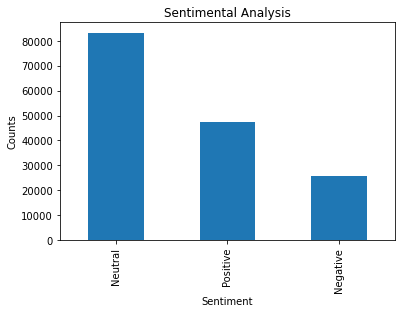

In [25]:
data["Analysis"].value_counts()
plt.title("Sentimental Analysis")
plt.xlabel("Sentiment")
plt.ylabel("Counts")
data["Analysis"].value_counts().plot(kind="bar")
plt.show()

# New

In [2]:
import nltk
import os

In [3]:
print(os.listdir(nltk.data.find("corpora")))

['abc', 'abc.zip', 'alpino', 'alpino.zip', 'biocreative_ppi', 'biocreative_ppi.zip', 'brown', 'brown.zip', 'brown_tei', 'brown_tei.zip', 'cess_cat', 'cess_cat.zip', 'cess_esp', 'cess_esp.zip', 'chat80', 'chat80.zip', 'city_database', 'city_database.zip', 'cmudict', 'cmudict.zip', 'comparative_sentences', 'comparative_sentences.zip', 'comtrans.zip', 'conll2000', 'conll2000.zip', 'conll2002', 'conll2002.zip', 'conll2007.zip', 'crubadan', 'crubadan.zip', 'dependency_treebank', 'dependency_treebank.zip', 'dolch', 'dolch.zip', 'europarl_raw', 'europarl_raw.zip', 'floresta', 'floresta.zip', 'framenet_v15', 'framenet_v15.zip', 'framenet_v17', 'framenet_v17.zip', 'gazetteers', 'gazetteers.zip', 'genesis', 'genesis.zip', 'gutenberg', 'gutenberg.zip', 'ieer', 'ieer.zip', 'inaugural', 'inaugural.zip', 'indian', 'indian.zip', 'jeita.zip', 'kimmo', 'kimmo.zip', 'knbc.zip', 'lin_thesaurus', 'lin_thesaurus.zip', 'machado.zip', 'mac_morpho', 'mac_morpho.zip', 'masc_tagged.zip', 'movie_reviews', 'movie

In [4]:
nltk.corpus.twitter_samples.fileids()

['negative_tweets.json', 'positive_tweets.json', 'tweets.20150430-223406.json']

In [5]:
tweets=nltk.corpus.twitter_samples.strings("tweets.20150430-223406.json")

In [6]:
tweets[1:10]

['VIDEO: Sturgeon on post-election deals http://t.co/BTJwrpbmOY',
 'RT @LabourEoin: The economy was growing 3 times faster on the day David Cameron became Prime Minister than it is today.. #BBCqt http://t.co…',
 'RT @GregLauder: the UKIP east lothian candidate looks about 16 and still has an msn addy http://t.co/7eIU0c5Fm1',
 "RT @thesundaypeople: UKIP's housing spokesman rakes in £800k in housing benefit from migrants.  http://t.co/GVwb9Rcb4w http://t.co/c1AZxcLh…",
 'RT @Nigel_Farage: Make sure you tune in to #AskNigelFarage tonight on BBC 1 at 22:50! #UKIP http://t.co/ogHSc2Rsr2',
 'RT @joannetallis: Ed Milliband is an embarrassment. Would you want him representing the UK?!  #bbcqt vote @Conservatives',
 "RT @abstex: The FT is backing the Tories. On an unrelated note, here's a photo of FT leader writer Jonathan Ford (next to Boris) http://t.c…",
 "RT @NivenJ1: “@George_Osborne: Ed Miliband proved tonight why he's not up to the job” Tbf you've spent 5 years doing that you salivating 

In [7]:
len(tweets)

20000

In [8]:
from textblob import TextBlob
import nltk
from nltk.tokenize import word_tokenize,sent_tokenize
from nltk.stem import PorterStemmer
import regex as re
from nltk.corpus import stopwords

Clening the text

In [9]:
tokens=word_tokenize(str(tweets))

In [10]:
sent_tokens=sent_tokenize(str(tweets))

In [11]:
len(tokens),len(sent_tokens)

(548242, 15350)

In [12]:
sent_tokens[1]

'#BetterOffOut #UKIP\', \'VIDEO: Sturgeon on post-election deals http://t.co/BTJwrpbmOY\', \'RT @LabourEoin: The economy was growing 3 times faster on the day David Cameron became Prime Minister than it is today.. #BBCqt http://t.co…\', \'RT @GregLauder: the UKIP east lothian candidate looks about 16 and still has an msn addy http://t.co/7eIU0c5Fm1\', "RT @thesundaypeople: UKIP\'s housing spokesman rakes in £800k in housing benefit from migrants.'

In [13]:
token=[]
for w in tokens:
    token.append(w.lower())
    

In [14]:
len(token)

548242

In [15]:
token[1:10]

["'rt", '@', 'kirkkus', ':', 'indirect', 'cost', 'of', 'the', 'uk']

In [16]:
clean_text1=[]
for w in token:
    res=re.sub(r"[^\w\s]","",w)
    if res!="":
        clean_text1.append(res)

In [17]:
len(clean_text1)

395139

In [18]:
clean_text1[1:20]

['kirkkus',
 'indirect',
 'cost',
 'of',
 'the',
 'uk',
 'being',
 'in',
 'the',
 'eu',
 'is',
 'estimated',
 'to',
 'be',
 'costing',
 'britain',
 '170',
 'billion',
 'per']

In [19]:
clean_text2=[]
for w in clean_text1:
    if w not in stopwords.words("english"):
        clean_text2.append(w)

In [20]:
len(clean_text2),len(clean_text1)

(259047, 395139)

In [21]:
clean_text2

['rt',
 'kirkkus',
 'indirect',
 'cost',
 'uk',
 'eu',
 'estimated',
 'costing',
 'britain',
 '170',
 'billion',
 'per',
 'year',
 'betteroffout',
 'ukip',
 'video',
 'sturgeon',
 'postelection',
 'deals',
 'http',
 'tcobtjwrpbmoy',
 'rt',
 'laboureoin',
 'economy',
 'growing',
 '3',
 'times',
 'faster',
 'day',
 'david',
 'cameron',
 'became',
 'prime',
 'minister',
 'today',
 'bbcqt',
 'http',
 'tco',
 'rt',
 'greglauder',
 'ukip',
 'east',
 'lothian',
 'candidate',
 'looks',
 '16',
 'still',
 'msn',
 'addy',
 'http',
 'tco7eiu0c5fm1',
 'rt',
 'thesundaypeople',
 'ukip',
 'housing',
 'spokesman',
 'rakes',
 '800k',
 'housing',
 'benefit',
 'migrants',
 'http',
 'tcogvwb9rcb4w',
 'http',
 'tcoc1azxclh',
 'rt',
 'nigel_farage',
 'make',
 'sure',
 'tune',
 'asknigelfarage',
 'tonight',
 'bbc',
 '1',
 '2250',
 'ukip',
 'http',
 'tcooghsc2rsr2',
 'rt',
 'joannetallis',
 'ed',
 'milliband',
 'embarrassment',
 'would',
 'want',
 'representing',
 'uk',
 'bbcqt',
 'vote',
 'conservatives',
 '

In [22]:
Port=PorterStemmer()

In [23]:
clean_text3=[]
for w in clean_text2:
    clean_text3.append(Port.stem(w))

In [24]:
len(clean_text3)

259047

In [26]:
from nltk.probability import FreqDist
fdist=FreqDist()
for w in clean_text3:
    fdist[w]+=1
fdist

FreqDist({'rt': 13512, 'http': 7767, 'tori': 5928, 'miliband': 5589, 'snp': 5285, 'ukip': 3484, 'labour': 2904, 'ed': 2795, 'bbcqt': 2677, 'cameron': 2617, ...})

In [27]:
fdist

FreqDist({'rt': 13512, 'http': 7767, 'tori': 5928, 'miliband': 5589, 'snp': 5285, 'ukip': 3484, 'labour': 2904, 'ed': 2795, 'bbcqt': 2677, 'cameron': 2617, ...})

In [40]:
text=" ".join(clean_text2)

In [41]:
text=re.sub("rt","",text)
text=re.sub("http","",text)

In [42]:
text

' kirkkus indirect cost uk eu estimated costing britain 170 billion per year betteroffout ukip video sturgeon postelection deals  tcobtjwrpbmoy  laboureoin economy growing 3 times faster day david cameron became prime minister today bbcqt  tco  greglauder ukip east lothian candidate looks 16 still msn addy  tco7eiu0c5fm1  thesundaypeople ukip housing spokesman rakes 800k housing benefit migrants  tcogvwb9rcb4w  tcoc1azxclh  nigel_farage make sure tune asknigelfarage tonight bbc 1 2250 ukip  tcooghsc2rsr2  joannetallis ed milliband embarrassment would want representing uk bbcqt vote conservatives  abstex ft backing tories unrelated note photo ft leader writer jonathan ford next boris  tc  nivenj1 george_osborne ed miliband proved tonight job tbf spent 5 years salivating lolz trickle wealth never trickling past wallets greed always wins greedy s tcox7deopbs97 snp leader faces audience questions  tcotyclkltspw  cononeilluk cameron ed milliband hanging russell brand joke election real peop

In [44]:
sent_tokens[1]

'#BetterOffOut #UKIP\', \'VIDEO: Sturgeon on post-election deals http://t.co/BTJwrpbmOY\', \'RT @LabourEoin: The economy was growing 3 times faster on the day David Cameron became Prime Minister than it is today.. #BBCqt http://t.co…\', \'RT @GregLauder: the UKIP east lothian candidate looks about 16 and still has an msn addy http://t.co/7eIU0c5Fm1\', "RT @thesundaypeople: UKIP\'s housing spokesman rakes in £800k in housing benefit from migrants.'

In [51]:
tweet_tokens=[]
for sent in sent_tokens:
    tweet_tokens.append([sent])

In [56]:
tweet_tokens[2]

['http://t.co/GVwb9Rcb4w http://t.co/c1AZxcLh…", \'RT @Nigel_Farage: Make sure you tune in to #AskNigelFarage tonight on BBC 1 at 22:50!']

In [55]:
len(tweet_tokens)

15350